In [2]:
import pandas as pd
import numpy as np
from datetime import datetime

file_path = 'D:/PhD_Research/Paper-3_CHDW_Migration/Processing/Processed Data/Step_1_CDHW_Data_Observ/Georefer_CDHW_Binary_Observ.xlsx'
data = pd.read_excel(file_path)
latitude = data['Latitude'].unique()
longitude = data['Longitude'].unique()
latitude = np.sort(latitude)
longitude = np.sort(longitude)
date_columns = data.columns[2:]
dates = [datetime.strptime(date, '%Y_%m_%d') for date in date_columns]

array_shape = (len(latitude), len(longitude), len(dates))
output_array = np.zeros(array_shape, dtype=int)
lat_map = {lat: idx for idx, lat in enumerate(latitude)}
lon_map = {lon: idx for idx, lon in enumerate(longitude)}
for index, row in data.iterrows():
    lat_idx = lat_map[row['Latitude']]
    lon_idx = lon_map[row['Longitude']]
    for t_idx, date in enumerate(date_columns):
        output_array[lat_idx, lon_idx, t_idx] = row[date]

base_path = 'D:/PhD_Research/Paper-3_CHDW_Migration/Processing/Processed Data/Step_3_Conv_3D Array/'

np.save(base_path + 'CDHW_3D.npy', output_array)

np.save(base_path + 'CDHW_latitudes.npy', latitude)
np.save(base_path + 'CDHW_longitudes.npy', longitude)


In [ ]:
import pandas as pd
from tqdm import tqdm

file1_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Daily_Detailed_CDHW_Events.xlsx'
df1 = pd.read_excel(file1_path)

file2_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_1_CDHW_Data_Observ\\Georefer_CDHW_Severity_Observ.xlsx'
df2 = pd.read_excel(file2_path)

df1['Date'] = pd.to_datetime(df1['Date']).dt.strftime('%Y_%m_%d')

df1['Severity'] = None

for index, row in tqdm(df1.iterrows(), total=df1.shape[0], desc="Processing Rows"):
    lat, long, date = row['Latitude'], row['Longitude'], row['Date']

    match = df2[(df2['Latitude'] == lat) & (df2['Longitude'] == long)]
    if not match.empty and date in match.columns:
        df1.at[index, 'Severity'] = match.iloc[0][date]

output_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Updated_Daily_Detailed_CDHW_Events.xlsx'
df1.to_excel(output_path, index=False)

print("Updated Excel file has been saved.")


In [14]:
import pandas as pd

df = pd.read_excel('D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Updated_Daily_Detailed_CDHW_Events.xlsx')

df['Date'] = pd.to_datetime(df['Date'], format='%Y_%m_%d')

df['Weighted_Latitude'] = df['Latitude'] * df['Severity']
df['Weighted_Longitude'] = df['Longitude'] * df['Severity']

grouped = df.groupby(['Event ID', 'Date'])

daily_data = grouped.agg({
    'Duration': 'first',                                
    'Weighted_Latitude': 'sum',
    'Weighted_Longitude': 'sum',
    'Total Voxels': 'first',                         
    'Severity': ['sum', 'max']                          
})

daily_data.columns = [
    'Duration',
    'Weighted_Latitude',
    'Weighted_Longitude',
    'Total Voxels',
    'Total Severity',
    'Maximum Severity'
]

daily_data['Latitude'] = daily_data['Weighted_Latitude'] / daily_data['Total Severity']
daily_data['Longitude'] = daily_data['Weighted_Longitude'] / daily_data['Total Severity']


daily_data['VoxelsPerDay'] = grouped.size()


daily_data.drop(columns=['Weighted_Latitude', 'Weighted_Longitude'], inplace=True)


daily_data.reset_index(inplace=True)


daily_data['Date'] = daily_data['Date'].dt.strftime('%Y-%m-%d')


output_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Daily_Summary_CDHW_Events.xlsx'
daily_data.to_excel(output_path, index=False)

print(f"Daily summary Excel file has been saved to {output_path}.")


Daily summary Excel file has been saved to D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx.


In [29]:
import pandas as pd

daily_summary_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Daily_Summary_CDHW_Events.xlsx'
daily_summary_df = pd.read_excel(daily_summary_path)

max_voxels_per_day = daily_summary_df.groupby('Event ID')['VoxelsPerDay'].max().reset_index()
max_voxels_per_day.rename(columns={'VoxelsPerDay': 'Maximum VoxelsPerDay'}, inplace=True)

event_level_summary_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Level_Summary.xlsx'
event_level_summary_df = pd.read_excel(event_level_summary_path)

event_level_summary_df = event_level_summary_df.merge(max_voxels_per_day, on='Event ID', how='left')

event_level_summary_df['Accumulated Area'] = (event_level_summary_df['Total Voxels'] * 49284) / 1000000
event_level_summary_df['Maximum Area'] = (event_level_summary_df['Maximum VoxelsPerDay'] * 49284) / 100000

output_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Level_Summary.xlsx'
event_level_summary_df.to_excel(output_path, index=False)

print(f"Updated event-level summary Excel file has been saved to {output_path}.")


Updated event-level summary Excel file has been saved to D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Level_Summary.xlsx.


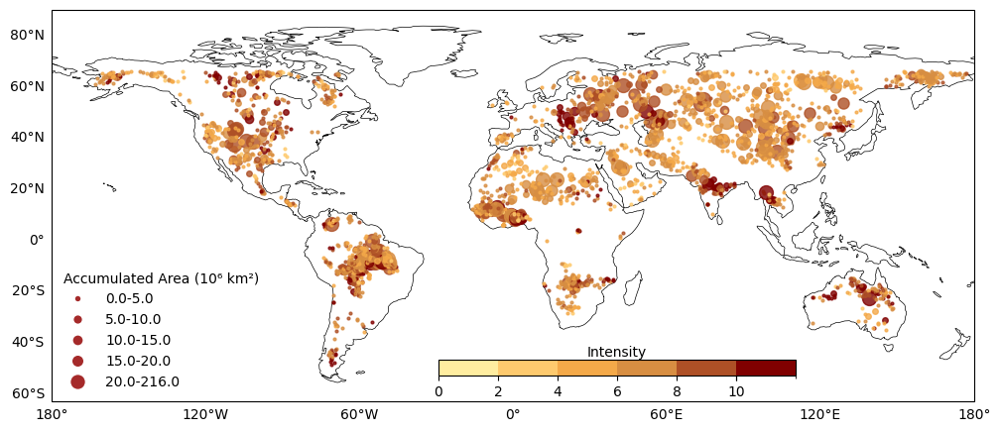

In [30]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import numpy as np
import pandas as pd
from matplotlib.cm import ScalarMappable

file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Level_Summary.xlsx'
data = pd.read_excel(file_path)

save_directory = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots'

fixed_intervals = [0, 2,  4,  6,  8,  10, 30] 
colors =  ['#ffeda0', '#feb24c', '#cd853f', '#800000'] 
cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", colors, N=len(fixed_intervals)-1)
norm = mcolors.BoundaryNorm(fixed_intervals, cmap.N)

def get_circle_size(voxels):
    if voxels <= 100:
        return 2
    elif voxels <= 200:
        return 4
    elif voxels <= 300:
        return 6
    elif voxels <= 400:
        return 8
    else:
        return 10

fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax.coastlines(resolution='110m', linewidth=0.5)
ax.set_extent([-180, 180, -63, 90], ccrs.PlateCarree())

for idx, row in data.iterrows():
    color = cmap(norm(row['Intensity']))
    size = get_circle_size(row['Total Voxels'])
    ax.plot(row['Longitude'], row['Latitude'], 'o', color=color, markersize=size, alpha=0.8, transform=ccrs.Geodetic())

gl = ax.gridlines(draw_labels=True, linewidth=0, color='gray', alpha=0.7)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False

colorbar_ax = fig.add_axes([0.45, 0.28, 0.3, 0.02])
cbar = plt.colorbar(ScalarMappable(norm=norm, cmap=cmap), cax=colorbar_ax, orientation='horizontal', ticks=fixed_intervals[:-1] + [10.01])  # Include ticks up to 15 and mid-point for >15
cbar.ax.set_xticklabels(['0', '2', '4', '6', '8', '10', ''])  
cbar.set_label('Intensity', rotation=0, labelpad=-39, horizontalalignment='center')

labels = ['0.0-5.0', '5.0-10.0', '10.0-15.0', '15.0-20.0', '20.0-216.0']
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='brown', markersize=np.sqrt(size)*4, label=label)
           for size, label in zip([1.5, 3, 4, 5, 8], labels)]
legend = ax.legend(handles=handles, title='Accumulated Area (10⁶ km²)', title_fontsize='10', fontsize='10', loc='lower left', frameon=False, handlelength=2, handletextpad=1)
legend._legend_box.align = "left"

high_res_png = save_directory + '\\CHDW_Oberv_Accumulatedarea_Intensity_1_1.png'
plt.savefig(high_res_png, dpi=900, bbox_inches='tight')
plt.show()

Total number of events: 2584

Percentage of events in each category:
Area Category
0.0-5.0     80.572755
5.0-10.0    11.493808
>10          7.933437
Name: count, dtype: float64


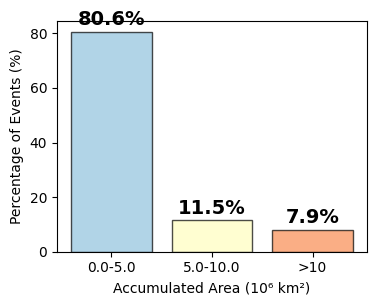

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Level_Summary.xlsx"
data = pd.read_excel(file_path)

bins = [0, 5, 10, float('inf')]
labels = ['0.0-5.0', '5.0-10.0', '>10']

data['Area Category'] = pd.cut(data['Accumulated_Area'], bins=bins, labels=labels, include_lowest=True)

category_counts = data['Area Category'].value_counts().sort_index()

category_percentages = (category_counts / category_counts.sum()) * 100

total_events = data.shape[0]
print(f"Total number of events: {total_events}")
print("\nPercentage of events in each category:")
print(category_percentages)

plt.figure(figsize=(4, 3))
colors = sns.color_palette("RdYlBu_r", len(category_percentages))
bars = plt.bar(category_percentages.index, category_percentages, color=colors, edgecolor='black', alpha=0.7)

for bar, percentage in zip(bars, category_percentages):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{percentage:.1f}%', 
             ha='center', va='bottom', fontsize=14, fontweight='bold')

plt.xlabel('Accumulated Area (10⁶ km²)')
plt.ylabel('Percentage of Events (%)')
plt.xticks(rotation=0)
plt.show()


Total number of events: 2572

Percentage of events in each category for each continent:
Area Category    0.0-5.0   5.0-10.0       >10
Continent                                    
Africa         81.316726  11.209964  7.473310
Eurasia        77.606178  12.451737  9.942085
North America  85.106383  10.638298  4.255319
Oceania        90.625000   7.291667  2.083333
South America  79.780220  11.428571  8.791209


<Figure size 1000x600 with 0 Axes>

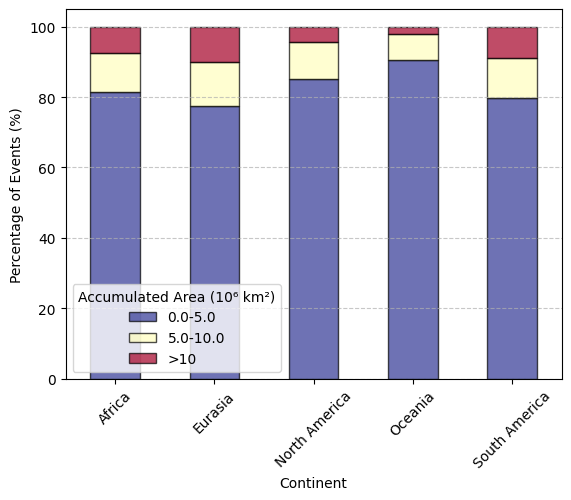

In [19]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

file_path = "D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Level_Summary.xlsx"
data = pd.read_excel(file_path)

gdf_events = gpd.GeoDataFrame(data, geometry=gpd.points_from_xy(data['Longitude'], data['Latitude']), crs="EPSG:4326")

shapefile_folder = "D:\PhD_Research\Paper-3_CHDW_Migration\Data\World_Continents"

continents = ["Africa", "Asia", "Europe", "North America", "Oceania", "South America"]

gdf_events['Continent'] = None

for continent in continents:
    continent_shapefile = f"{shapefile_folder}\{continent}.shp"

    gdf_continent = gpd.read_file(continent_shapefile)

    gdf_events.loc[gdf_events.sjoin(gdf_continent, predicate='within').index, 'Continent'] = continent

gdf_events['Continent'] = gdf_events['Continent'].replace({'Europe': 'Eurasia', 'Asia': 'Eurasia'})

gdf_events = gdf_events.dropna(subset=['Continent'])

bins = [0, 5, 10, float('inf')]
labels = ['0.0-5.0', '5.0-10.0', '>10']

gdf_events['Area Category'] = pd.cut(gdf_events['Accumulated_Area'], bins=bins, labels=labels, include_lowest=True)

continent_category_counts = gdf_events.groupby(['Continent', 'Area Category']).size().unstack(fill_value=0)
continent_category_percentages = continent_category_counts.div(continent_category_counts.sum(axis=1), axis=0) * 100

total_events = gdf_events.shape[0]
print(f"Total number of events: {total_events}")
print("\nPercentage of events in each category for each continent:")
print(continent_category_percentages)

plt.figure(figsize=(10, 6))
continent_category_percentages.plot(kind='bar', stacked=True, colormap='RdYlBu_r', edgecolor='black', alpha=0.7)
plt.xlabel('Continent')
plt.ylabel('Percentage of Events (%)')
plt.xticks(rotation=45)
plt.legend(title='Accumulated Area (10⁶ km²)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


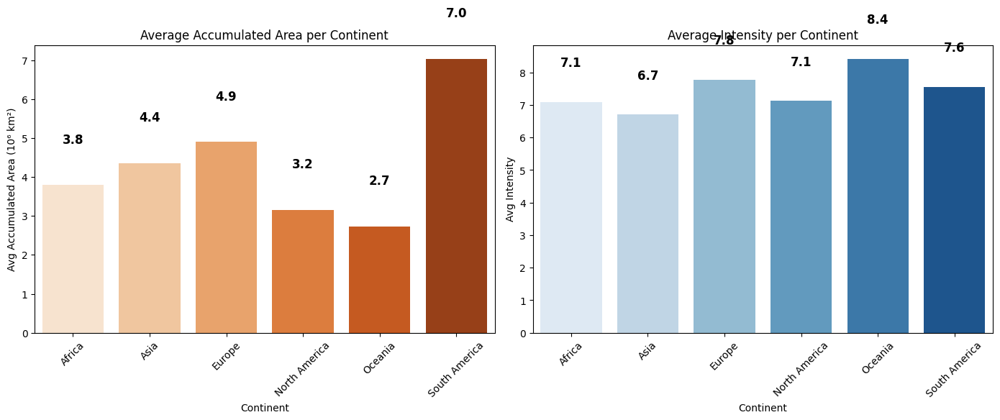

In [14]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Level_Summary.xlsx"
data = pd.read_excel(file_path)

gdf_events = gpd.GeoDataFrame(data, geometry=gpd.points_from_xy(data['Longitude'], data['Latitude']), crs="EPSG:4326")

shapefile_folder = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents"

continents = ["Africa", "Asia", "Europe", "North America", "Oceania", "South America"]

gdf_events['Continent'] = None

for continent in continents:
    continent_shapefile = f"{shapefile_folder}\\{continent}.shp"

    gdf_continent = gpd.read_file(continent_shapefile)

    gdf_events.loc[gdf_events.sjoin(gdf_continent, predicate='within').index, 'Continent'] = continent

gdf_events = gdf_events.dropna(subset=['Continent'])

avg_accumulated_area = gdf_events.groupby('Continent')['Accumulated_Area'].mean()
avg_intensity = gdf_events.groupby('Continent')['Intensity'].mean()

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.barplot(x=avg_accumulated_area.index, y=avg_accumulated_area.values, palette="Oranges", ax=axes[0])
axes[0].set_title("Average Accumulated Area per Continent")
axes[0].set_xlabel("Continent")
axes[0].set_ylabel("Avg Accumulated Area (10⁶ km²)")
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45)

for bar, value in zip(axes[0].patches, avg_accumulated_area.values):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{value:.1f}', 
                 ha='center', va='bottom', fontsize=12, fontweight='bold')

sns.barplot(x=avg_intensity.index, y=avg_intensity.values, palette="Blues", ax=axes[1])
axes[1].set_title("Average Intensity per Continent")
axes[1].set_xlabel("Continent")
axes[1].set_ylabel("Avg Intensity")
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45)

for bar, value in zip(axes[1].patches, avg_intensity.values):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{value:.1f}', 
                 ha='center', va='bottom', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()


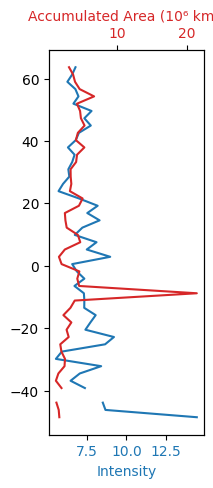

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Level_Summary.xlsx'
data = pd.read_excel(file_path)

lat_bins = np.linspace(data['Latitude'].min(), data['Latitude'].max(), num=50) 
data['lat_bin'] = pd.cut(data['Latitude'], bins=lat_bins, labels=lat_bins[:-1])

grouped = data.groupby('lat_bin').agg({
    'Intensity': 'mean',
    'Accumulated_Area': 'mean'
}).reset_index()

fig, ax1 = plt.subplots(figsize=(2, 5))

ax1.set_xlabel('Intensity', color='tab:blue')
ax1.plot(grouped['Intensity'], grouped['lat_bin'], color='tab:blue')
ax1.tick_params(axis='x', labelcolor='tab:blue')

ax2 = ax1.twiny()
ax2.set_xlabel('Accumulated Area (10⁶ km²)', color='tab:red')
ax2.plot(grouped['Accumulated_Area'], grouped['lat_bin'], color='tab:red')
ax2.tick_params(axis='x', labelcolor='tab:red')

plt.show()



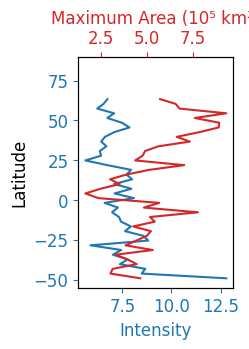

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Level_Summary.xlsx'
data = pd.read_excel(file_path)

lat_bins = np.linspace(-55, 90, num=50) 
data['lat_bin'] = pd.cut(data['Latitude'], bins=lat_bins, labels=lat_bins[:-1])

grouped = data.groupby('lat_bin').agg({
    'Intensity': 'mean',
    'Maximum_Area': 'mean'
}).reset_index()

grouped['lat_bin'] = grouped['lat_bin'].astype(float)

fig, ax1 = plt.subplots(figsize=(2, 3))

ax1.set_xlabel('Intensity', fontsize=12, color='tab:blue')
ax1.set_ylabel('Latitude', fontsize=12)
ax1.plot(grouped['Intensity'], grouped['lat_bin'], color='tab:blue', linewidth=1.5)
ax1.tick_params(axis='both', labelsize=12, colors='tab:blue')
ax1.set_ylim(-55, 90)  

ax2 = ax1.twiny()
ax2.set_xlabel('Maximum Area (10⁵ km²)', fontsize=12, color='tab:red')
ax2.plot(grouped['Maximum_Area'], grouped['lat_bin'], color='tab:red', linewidth=1.5)
ax2.tick_params(axis='x', labelsize=12, colors='tab:red')

high_res_png = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\Latitude_Variation_Accumulatedarea_Intensity.png'
plt.savefig(high_res_png, dpi=600, bbox_inches='tight', transparent=True)
plt.show()


In [41]:
import pandas as pd

df = pd.read_excel('D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Daily_Summary_CDHW_Events.xlsx')

df.sort_values(by=['Event ID', 'Date'], inplace=True)

event_summary = df.groupby('Event ID').agg({
    'Duration': 'mean', 
    'Latitude': ['first', 'last'],
    'Longitude': ['first', 'last'], 
}).rename(columns={'first': 'Starting', 'last': 'Ending'})


event_summary.columns = [' '.join(col).strip() for col in event_summary.columns.values]

event_summary.rename(columns={
    'Duration mean': 'Duration',
    'Latitude Starting': 'Starting Latitude',
    'Latitude Ending': 'Ending Latitude',
    'Longitude Starting': 'Starting Longitude',
    'Longitude Ending': 'Ending Longitude',
}, inplace=True)

output_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Displacement_Summary.xlsx'
event_summary.to_excel(output_path, index=True)

print(f"Event level summary Excel file has been saved to {output_path}.")


Event level summary Excel file has been saved to D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Displacement_Summary.xlsx.


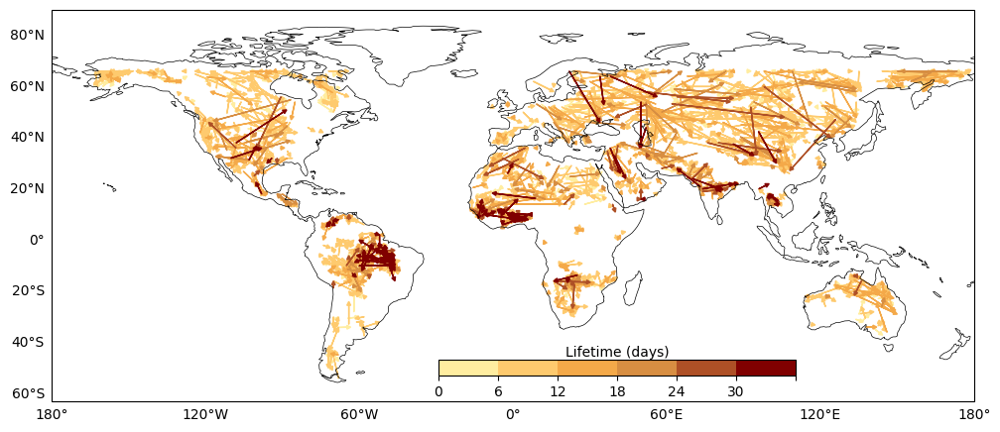

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap

file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Displacement_Summary.xlsx'
df = pd.read_excel(file_path)

save_directory = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots'

colors = ['#ffeda0', '#feb24c', '#cd853f', '#800000']
custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

min_duration = df['Duration'].min()
max_duration = df['Duration'].max()
bounds = np.array([0, 6, 12, 18, 24, 30, max_duration])
norm = mcolors.BoundaryNorm(bounds, custom_cmap.N)

df_sorted = df.sort_values(by='Duration')

fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})

ax.coastlines(resolution='110m', linewidth=0.5)

ax.set_extent([-180, 180, -63, 90], crs=ccrs.PlateCarree())

for index, row in df_sorted.iterrows():
    color = custom_cmap(norm(row['Duration']))
    ax.arrow(row['Starting Longitude'], row['Starting Latitude'], 
             row['Ending Longitude'] - row['Starting Longitude'], 
             row['Ending Latitude'] - row['Starting Latitude'], 
             color=color, alpha=1.0, transform=ccrs.PlateCarree(), 
             width=0.05, head_width=1.5, head_length=1.5, length_includes_head=True)

gl = ax.gridlines(draw_labels=True, linewidth=0, color='gray', alpha=0.5)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False

colorbar_ax = fig.add_axes([0.45, 0.28, 0.3, 0.02])
sm = plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm)
sm.set_array([])  
cbar = plt.colorbar(sm, cax=colorbar_ax, orientation='horizontal')
cbar.set_label('Lifetime (days)', rotation=0, labelpad=-39, horizontalalignment='center')
cbar.set_ticks(bounds)
cbar.set_ticklabels([f'{b}' if b < 30 else '30' for b in bounds[:-1]] + [''])
high_res_png = save_directory + '\\CHDW_Oberv_Accumulatedarea_Intensity_2_1.png'
plt.savefig(high_res_png, dpi=900, bbox_inches='tight')
plt.show()


Total number of events: 2460

Percentage of events in each category:
Displacement Category
0-500       69.878049
500-1000    21.138211
>1000        8.983740
Name: count, dtype: float64


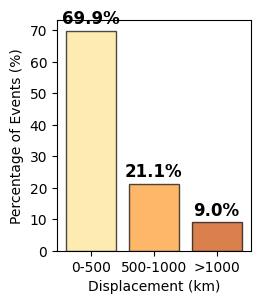

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Temporal_Events_Summary.xlsx"
data = pd.read_excel(file_path)

bins = [0, 500, 1000, float('inf')]
labels = ['0-500', '500-1000', '>1000']

data['Displacement Category'] = pd.cut(data['Distance'], bins=bins, labels=labels, include_lowest=True)

category_counts = data['Displacement Category'].value_counts().sort_index()

category_percentages = (category_counts / category_counts.sum()) * 100

total_events = data.shape[0]
print(f"Total number of events: {total_events}")
print("\nPercentage of events in each category:")
print(category_percentages)

plt.figure(figsize=(2.5, 3))
colors = sns.color_palette("YlOrBr", len(category_percentages))
bars = plt.bar(category_percentages.index, category_percentages, color=colors, edgecolor='black', alpha=0.7)

for bar, percentage in zip(bars, category_percentages):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{percentage:.1f}%', 
             ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.xlabel('Displacement (km)')
plt.ylabel('Percentage of Events (%)')
plt.xticks(rotation=0)
plt.show()


Total number of events: 2460

Percentage of events in each category:
Duration Category
>6       28.617886
6-12     43.617886
12-18    15.691057
18-24     5.894309
24-30     1.788618
>30       4.390244
Name: count, dtype: float64


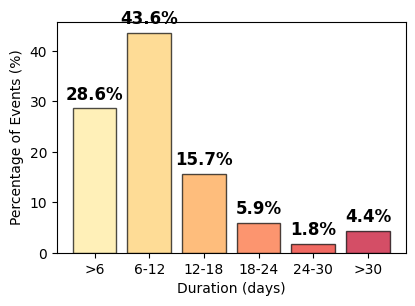

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Temporal_Events_Summary.xlsx"
data = pd.read_excel(file_path)

max_duration = data['Duration'].max()
bins = [0, 6, 12, 18, 24, 30, max_duration]
labels = ['>6', '6-12', '12-18', '18-24', '24-30', f'>30']

data['Duration Category'] = pd.cut(data['Duration'], bins=bins, labels=labels, include_lowest=True)

category_counts = data['Duration Category'].value_counts().sort_index()

category_percentages = (category_counts / category_counts.sum()) * 100

total_events = data.shape[0]
print(f"Total number of events: {total_events}")
print("\nPercentage of events in each category:")
print(category_percentages)

plt.figure(figsize=(4.5, 3))
colors = sns.color_palette("YlOrRd", len(category_percentages))
bars = plt.bar(category_percentages.index, category_percentages, color=colors, edgecolor='black', alpha=0.7)

for bar, percentage in zip(bars, category_percentages):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{percentage:.1f}%', 
             ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.xlabel('Duration (days)')
plt.ylabel('Percentage of Events (%)')
plt.xticks(rotation=0)
plt.show()


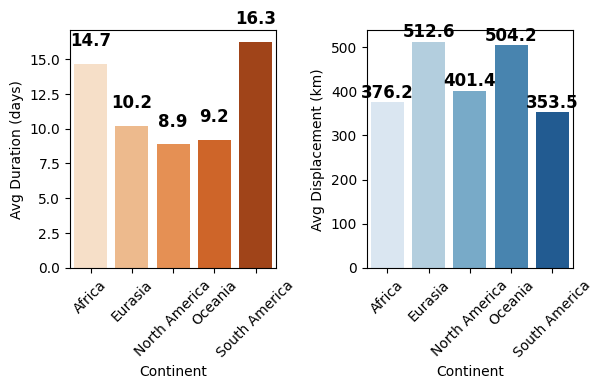

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Temporal_Events_Summary.xlsx"
data = pd.read_excel(file_path)

data.columns = data.columns.str.strip()

avg_duration = data.groupby('Continent')['Duration'].mean()
avg_displacement = data.groupby('Continent')['Distance'].mean()

fig, axes = plt.subplots(1, 2, figsize=(6, 4))

sns.barplot(x=avg_duration.index, y=avg_duration.values, palette="Oranges", ax=axes[0])
axes[0].set_xlabel("Continent")
axes[0].set_ylabel("Avg Duration (days)")
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45)

for bar, value in zip(axes[0].patches, avg_duration.values):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{value:.1f}', 
                 ha='center', va='bottom', fontsize=12, fontweight='bold')

sns.barplot(x=avg_displacement.index, y=avg_displacement.values, palette="Blues", ax=axes[1])
axes[1].set_xlabel("Continent")
axes[1].set_ylabel("Avg Displacement (km)")
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45)

for bar, value in zip(axes[1].patches, avg_displacement.values):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{value:.1f}', 
                 ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


In [45]:
import pandas as pd
import numpy as np

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance in kilometers between two points 
    on the earth (specified in decimal degrees).
    """
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    r = 6371  
    return c * r

def calculate_bearing_cartesian(lat1, lon1, lat2, lon2):
    """
    Calculate the bearing between two geographic points and convert it to Cartesian coordinates with 0 degrees as East.
    """
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlon = lon2 - lon1
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1) * np.sin(lat2) - np.sin(lat1) * np.cos(lat2) * np.cos(dlon)
    initial_bearing = np.arctan2(x, y)
    initial_bearing = np.degrees(initial_bearing)
    compass_bearing = (90 - initial_bearing) % 360  # Convert from geographic north to Cartesian east
    return compass_bearing

df = pd.read_excel('D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Displacement_Summary.xlsx')

df['Distance'] = df.apply(lambda x: haversine(x['Starting Longitude'], x['Starting Latitude'], x['Ending Longitude'], x['Ending Latitude']), axis=1)
df['Bearing'] = df.apply(lambda x: calculate_bearing_cartesian(x['Starting Latitude'], x['Starting Longitude'], x['Ending Latitude'], x['Ending Longitude']), axis=1)

output_path = 'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Displacement_bearing.xlsx'
df.to_excel(output_path, index=False)

print(f"Excel file with distances and bearings has been saved: {output_path}")


Excel file with distances and bearings has been saved: D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Displacement_bearing.xlsx


In [46]:
import pandas as pd
import numpy as np

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance in kilometers between two points 
    on the earth (specified in decimal degrees).
    """
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    r = 6371 
    return c * r

def calculate_bearing_cartesian(lat1, lon1, lat2, lon2):
    """
    Calculate the bearing between two geographic points and convert it to Cartesian coordinates with 0 degrees as East.
    If the final latitude or longitude is the same as the initial one, return a special value or handle differently.
    """
    if (lat1 == lat2 and lon1 == lon2):
        return 0 
    elif lon1 == lon2:
        if lat2 > lat1:
            return 0  
        else:
            return 180
    elif lat1 == lat2:
        if lon2 > lon1:
            return 90
        else:
            return 270
    
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlon = lon2 - lon1
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1) * np.sin(lat2) - np.sin(lat1) * np.cos(lat2) * np.cos(dlon)
    initial_bearing = np.arctan2(x, y)
    initial_bearing = np.degrees(initial_bearing)
    compass_bearing = (90 - initial_bearing) % 360 
    return compass_bearing
df = pd.read_excel('D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Displacement_Summary.xlsx')
df['Distance'] = df.apply(lambda x: haversine(x['Starting Longitude'], x['Starting Latitude'], x['Ending Longitude'], x['Ending Latitude']), axis=1)
df['Bearing'] = df.apply(lambda x: calculate_bearing_cartesian(x['Starting Latitude'], x['Starting Longitude'], x['Ending Latitude'], x['Ending Longitude']), axis=1)
output_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Displacement_bearing.xlsx'
df.to_excel(output_path, index=False)
print(f"Excel file with distances and bearings has been saved: {output_path}")

Excel file with distances and bearings has been saved: D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Displacement_bearing.xlsx


In [50]:
import pandas as pd
import numpy as np

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance in kilometers between two points 
    on the earth (specified in decimal degrees).
    """
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    r = 6371
    return c * r

def calculate_bearing_cartesian(lat1, lon1, lat2, lon2):
    """
    Calculate the bearing between two geographic points and convert it to Cartesian coordinates with 0 degrees as East.
    """
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlon = lon2 - lon1
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1) * np.sin(lat2) - np.sin(lat1) * np.cos(lat2) * np.cos(dlon)
    initial_bearing = np.arctan2(x, y)
    initial_bearing = np.degrees(initial_bearing)
    compass_bearing = (90 - initial_bearing) % 360 
    return compass_bearing

df = pd.read_excel('D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Displacement_Summary.xlsx')

df['Distance'] = df.apply(lambda x: haversine(x['Starting Longitude'], x['Starting Latitude'], x['Ending Longitude'], x['Ending Latitude']), axis=1)
df['Bearing'] = df.apply(lambda x: calculate_bearing_cartesian(x['Starting Latitude'], x['Starting Longitude'], x['Ending Latitude'], x['Ending Longitude']), axis=1)

output_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Displacement_bearing.xlsx'
df.to_excel(output_path, index=False)

print(f"Excel file with distances and bearings has been saved: {output_path}")


Excel file with distances and bearings has been saved: D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Displacement_bearing.xlsx


In [48]:
import pandas as pd
def assign_direction(bearing):
    if (bearing >= 348.75) or (bearing < 11.25):
        return 'E'
    elif 11.25 <= bearing < 33.75:
        return 'ENE'
    elif 33.75 <= bearing < 56.25:
        return 'NE'
    elif 56.25 <= bearing < 78.75:
        return 'NNE'
    elif 78.75 <= bearing < 101.25:
        return 'N'
    elif 101.25 <= bearing < 123.75:
        return 'NNW'
    elif 123.75 <= bearing < 146.25:
        return 'NW'
    elif 146.25 <= bearing < 168.75:
        return 'WNW'
    elif 168.75 <= bearing < 191.25:
        return 'W'
    elif 191.25 <= bearing < 213.75:
        return 'WSW'
    elif 213.75 <= bearing < 236.25:
        return 'SW'
    elif 236.25 <= bearing < 258.75:
        return 'SSW'
    elif 258.75 <= bearing < 281.25:
        return 'S'
    elif 281.25 <= bearing < 303.75:
        return 'SSE'
    elif 303.75 <= bearing < 326.25:
        return 'SE'
    elif 326.25 <= bearing < 348.75:
        return 'ESE'
    else:
        return 'Unknown'

file_path = 'D:/PhD_Research/Paper-3_CHDW_Migration/Processing/Processed Data/Step_4_Event_Calculation/Event_Observ/Event_Displacement_bearing.xlsx'  # replace with the actual path
df = pd.read_excel(file_path)
df['Direction'] = df['Bearing'].apply(assign_direction)
output_path = 'D:/PhD_Research/Paper-3_CHDW_Migration/Processing/Processed Data/Step_4_Event_Calculation/Event_Observ/Event_Displacement_Direction.xlsx'  # replace with the desired output path
df.to_excel(output_path, index=False)

print(f"Processed file saved to {output_path}")


Processed file saved to D:/PhD_Research/Paper-3_CHDW_Migration/Processing/Processed Data/Step_4_Event_Calculation/Event_Observ/Event_Displacement_Direction.xlsx


C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\2944070273.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ytick_labels, verticalalignment='bottom', fontsize=10)


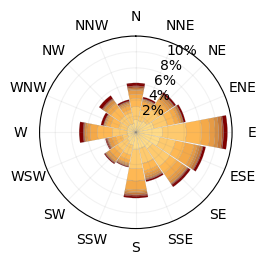

In [104]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize
import matplotlib.cm as cm

file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Displacement_Direction.xlsx'
df = pd.read_excel(file_path)

df['Direction'] = df['Direction'].astype(str)

bounds = np.array([0, 3, 6, 9, 12, 15, 18, 21, 24, 27, 30, df['Duration'].max() + 1])
colors = ['#ffeda0', '#feb24c', '#cd853f', '#800000']
custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", colors, N=len(bounds)-1)
norm = Normalize(vmin=0, vmax=len(bounds)-2)

df['Duration Category'] = pd.cut(df['Duration'], bins=bounds, labels=np.arange(len(bounds)-1))

aggregated_data = df.groupby(['Direction', 'Duration Category']).size().unstack(fill_value=0)

total_events = df.shape[0]
percentage_data = aggregated_data.divide(total_events).fillna(0) * 100

directions = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE', 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']

theta = np.linspace(0, 2 * np.pi, len(directions), endpoint=False)

percentage_data = percentage_data.reindex(directions).fillna(0)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(2.5, 2.5))
width = 2 * np.pi / len(directions) * 0.95

bottom = np.zeros(len(directions))
for i, category in enumerate(percentage_data.columns):
    heights = percentage_data[category].reindex(directions).fillna(0)
    color = custom_cmap(norm(i))
    bars = ax.bar(theta, heights, width=width, bottom=bottom, color=color, edgecolor='grey', linewidth=0.1, label=f'{bounds[i]}-{bounds[i+1]} days')
    bottom += heights

ax.yaxis.grid(True, linestyle='-', color='gray', alpha=0.1)
ax.xaxis.grid(True, linestyle='-', color='gray', alpha=0.1)

ax.set_xticks(theta)
ax.set_xticklabels(directions)
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ge
yticks = ax.get_yticks()
ytick_labels = [f'{int(tick)}%' for tick in yticks]
ax.set_yticklabels(ytick_labels, verticalalignment='bottom', fontsize=10)

save_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\ross_poy_diagram_2_1.png'
plt.savefig(save_path, transparent=True, dpi=300)

plt.show()


C:\Users\Amitesh\AppData\Local\Temp\ipykernel_19900\1735004727.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['Duration Category'] = pd.cut(subset['Duration'], bins=bounds, labels=np.arange(len(bounds)-1))
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_19900\1735004727.py:57: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_yticklabels(ytick_labels, verticalalignment='bottom', fontsize=10, zorder=10)  # Increased zorder to 10
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_19900\1735004727.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

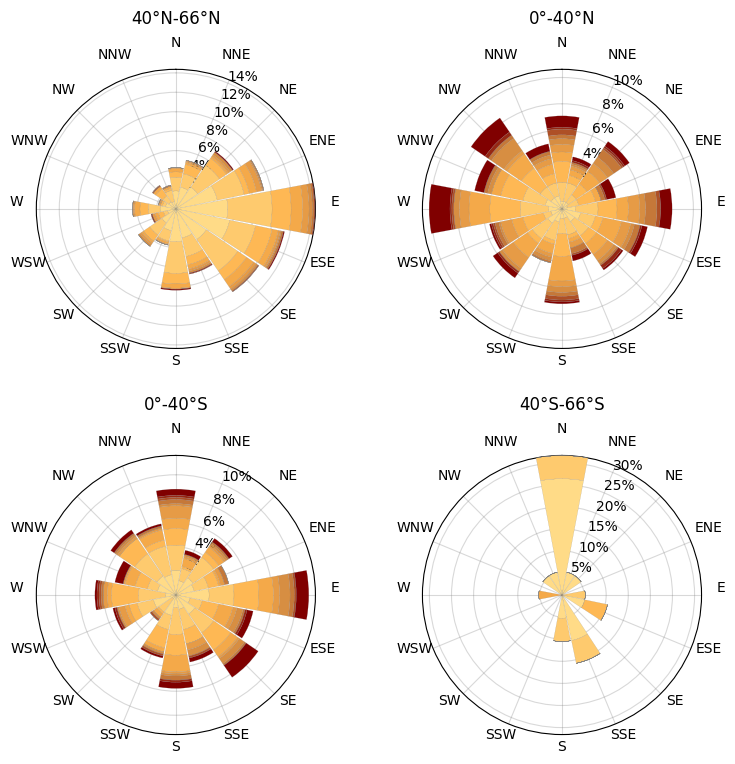

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize
import matplotlib.cm as cm

file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Displacement_Direction.xlsx'
df = pd.read_excel(file_path)
bounds = np.array([0, 3, 6, 9, 12, 15, 18, 21, 24, 27, 30, df['Duration'].max() + 1])
colors = ['#ffeda0', '#feb24c', '#cd853f', '#800000']
custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", colors, N=len(bounds)-1)
norm = Normalize(vmin=0, vmax=len(bounds)-2)

latitude_ranges = {
    '40°N-66°N': (40, 66),
    '0°-40°N': (0, 30),
    '0°-40°S': (-40, 0),
    '40°S-66°S': (-66, -40)
}

fig, axes = plt.subplots(2, 2, subplot_kw={'projection': 'polar'}, figsize=(8, 8))
axes = axes.flatten()

for i, (key, (lat_min, lat_max)) in enumerate(latitude_ranges.items()):
    subset = df[(df['Ending Latitude'] >= lat_min) & (df['Ending Latitude'] <= lat_max)]
    subset['Duration Category'] = pd.cut(subset['Duration'], bins=bounds, labels=np.arange(len(bounds)-1))
    aggregated_data = subset.groupby(['Direction', 'Duration Category']).size().unstack(fill_value=0)
    total_events = subset.shape[0]
    percentage_data = aggregated_data.divide(total_events).fillna(0) * 100

    directions = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE', 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']
    theta = np.linspace(0, 2 * np.pi, len(directions), endpoint=False)
    percentage_data = percentage_data.reindex(directions).fillna(0)

    width = 2 * np.pi / len(directions) * 0.95
    bottom = np.zeros(len(directions))
    for category in percentage_data.columns:
        heights = percentage_data[category].reindex(directions).fillna(0)
        color = custom_cmap(norm(category))
        axes[i].bar(theta, heights, width=width, bottom=bottom, color=color, edgecolor='grey', linewidth=0.1, zorder=3)
        bottom += heights

    axes[i].yaxis.grid(True, linestyle='-', color='gray', alpha=0.3, zorder=1)
    axes[i].xaxis.grid(True, linestyle='-', color='gray', alpha=0.3, zorder=1)
    axes[i].set_xticks(theta)
    axes[i].set_xticklabels(directions, fontsize=10, verticalalignment='bottom')
    axes[i].set_theta_zero_location('N')
    axes[i].set_theta_direction(-1)

    yticks = axes[i].get_yticks()
    ytick_labels = [f'{int(tick)}%' for tick in yticks]
    axes[i].set_yticklabels(ytick_labels, verticalalignment='bottom', fontsize=10, zorder=10)  # Increased zorder to 10

    axes[i].set_title(f'{key}', fontsize=12, verticalalignment='bottom')

plt.tight_layout(pad=2.0)
save_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\ross_poy_diagrams.png'
plt.savefig(save_path, transparent=True, dpi=300)
plt.show()


In [58]:
import pandas as pd
import numpy as np

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance in kilometers between two points 
    on the earth (specified in decimal degrees).
    """
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a)) 
    r = 6371 
    return c * r

file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Daily_Summary_CDHW_Events.xlsx'
df = pd.read_excel(file_path)

df['Date'] = pd.to_datetime(df['Date']).dt.normalize()
r
df.sort_values(by=['Event ID', 'Date'], inplace=True)

df['Distance'] = np.nan

for i in df.index[:-1]:
    if df.loc[i, 'Event ID'] == df.loc[i + 1, 'Event ID']:
        distance = haversine(df.loc[i, 'Longitude'], df.loc[i, 'Latitude'],
                             df.loc[i + 1, 'Longitude'], df.loc[i + 1, 'Latitude'])
        df.loc[i + 1, 'Distance'] = distance  
output_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Daily_Summary_CDHW_Events_With_Distance.xlsx'
with pd.ExcelWriter(output_path, engine='xlsxwriter', datetime_format='yyyy-mm-dd') as writer:
    df.to_excel(writer, index=False)

print(f"Updated Excel file saved: {output_path}")


Updated Excel file saved: D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events_With_Distance.xlsx


In [59]:
import pandas as pd

file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Daily_Summary_CDHW_Events_With_Distance.xlsx'
df = pd.read_excel(file_path)

total_distances = df.groupby('Event ID')['Distance'].sum().reset_index()
total_distances.rename(columns={'Distance': 'Total Distance'}, inplace=True)

df = pd.merge(df, total_distances, on='Event ID', how='left')
df.to_excel(file_path, index=False)

print(f"Updated Excel file saved: {file_path}")


Updated Excel file saved: D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events_With_Distance.xlsx


In [60]:
import pandas as pd
file_path_directions = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Displacement_Direction.xlsx'
file_path_distances = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Daily_Summary_CDHW_Events_With_Distance.xlsx'

df_directions = pd.read_excel(file_path_directions)
df_distances = pd.read_excel(file_path_distances)
total_distances = df_distances.groupby('Event ID')['Distance'].sum().reset_index()
total_distances.rename(columns={'Distance': 'Total Distance'}, inplace=True)

df_directions = pd.merge(df_directions, total_distances, on='Event ID', how='left')
output_path = file_path_directions  
df_directions.to_excel(output_path, index=False)

print(f"Updated Excel file saved: {output_path}")


Updated Excel file saved: D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Displacement_Direction.xlsx


In [61]:
import geopandas as gpd
import pandas as pd
import os

event_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Displacement_Direction.xlsx'
events = pd.read_excel(event_path)

gdf_events = gpd.GeoDataFrame(
    events,
    geometry=gpd.points_from_xy(events['Starting Longitude'], events['Starting Latitude']),
    crs='epsg:4326'  

shapefile_dir = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents'

gdf_events['Continent'] = None

for filename in os.listdir(shapefile_dir):
    if filename.endswith('.shp'):
        shapefile_path = os.path.join(shapefile_dir, filename)
        continent_shapefile = gpd.read_file(shapefile_path)

        if continent_shapefile.crs != gdf_events.crs:
            continent_shapefile = continent_shapefile.to_crs(gdf_events.crs)

        matched_gdf = gpd.sjoin(gdf_events, continent_shapefile, how="inner", op='intersects')

        continent_name = filename[:-4]
        gdf_events.loc[matched_gdf.index, 'Continent'] = continent_name

gdf_events['Continent'].fillna('Not Assigned', inplace=True)

gdf_events.drop(columns=['geometry'], inplace=True)

output_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Displacement_Direction_With_Continent.xlsx'
gdf_events.to_excel(output_path, index=False)

print(f"Updated Excel file saved: {output_path}")


C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\IPython\core\interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\IPython\core\interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\IPython\core\interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\IPython\c

Updated Excel file saved: D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Displacement_Direction_With_Continent.xlsx


In [62]:
import pandas as pd

file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Displacement_Direction_With_Continent.xlsx'
data = pd.read_excel(file_path)
data['Continent'] = data['Continent'].replace(['Europe', 'Asia'], 'Eurasia')
output_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Updated_Event_Displacement_Direction_With_Continent.xlsx'
data.to_excel(output_path, index=False)

print("File has been updated and saved.")


File has been updated and saved.


C:\Users\Amitesh\AppData\Local\Temp\ipykernel_19900\552809039.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ytick_labels)


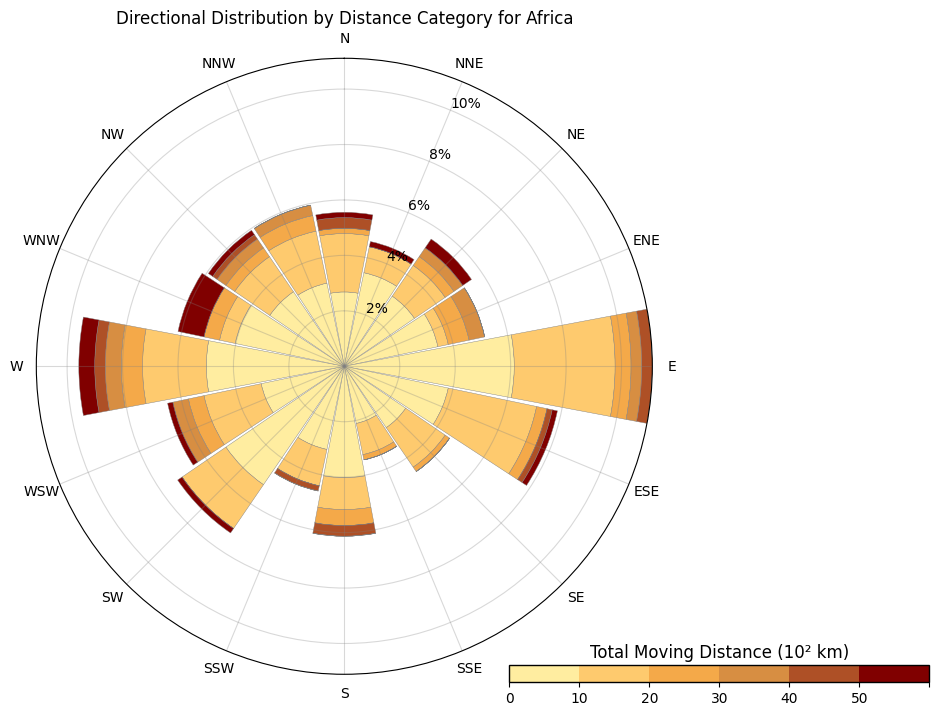

C:\Users\Amitesh\AppData\Local\Temp\ipykernel_19900\552809039.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ytick_labels)


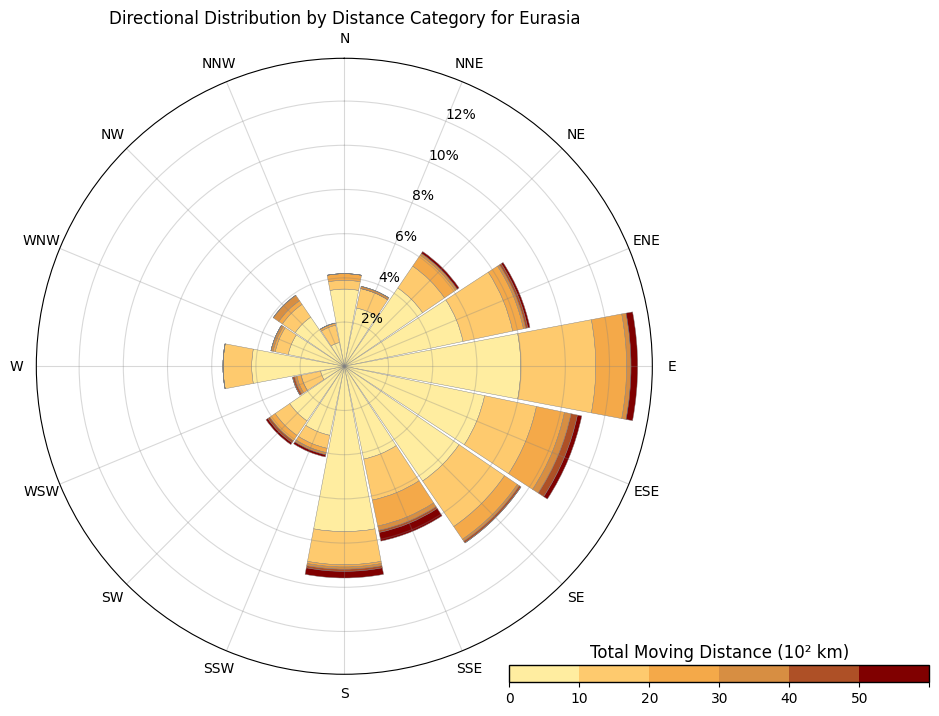

C:\Users\Amitesh\AppData\Local\Temp\ipykernel_19900\552809039.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ytick_labels)


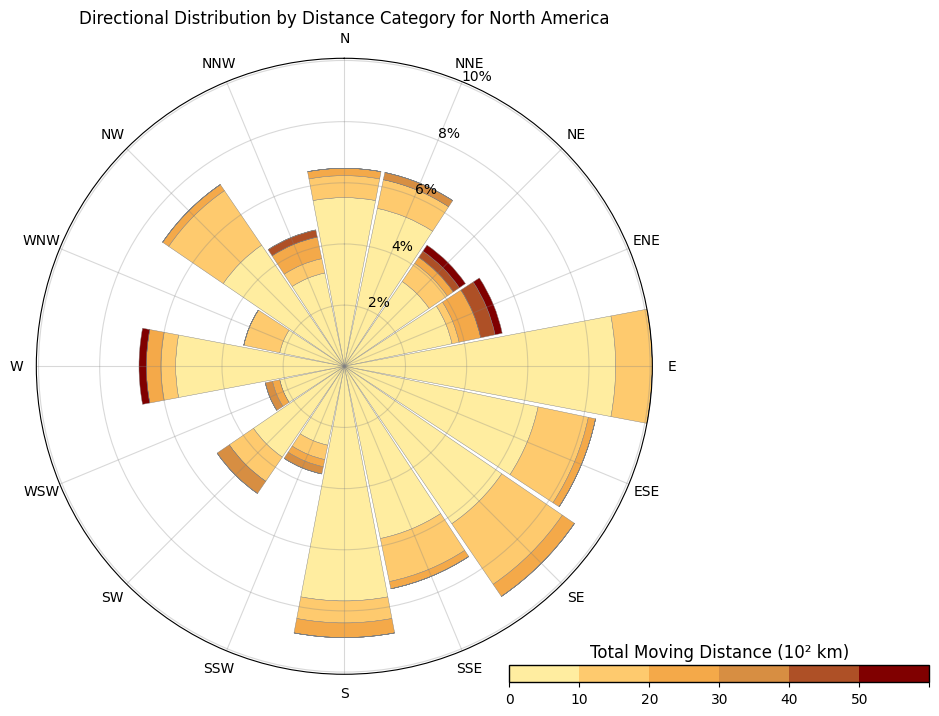

C:\Users\Amitesh\AppData\Local\Temp\ipykernel_19900\552809039.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ytick_labels)


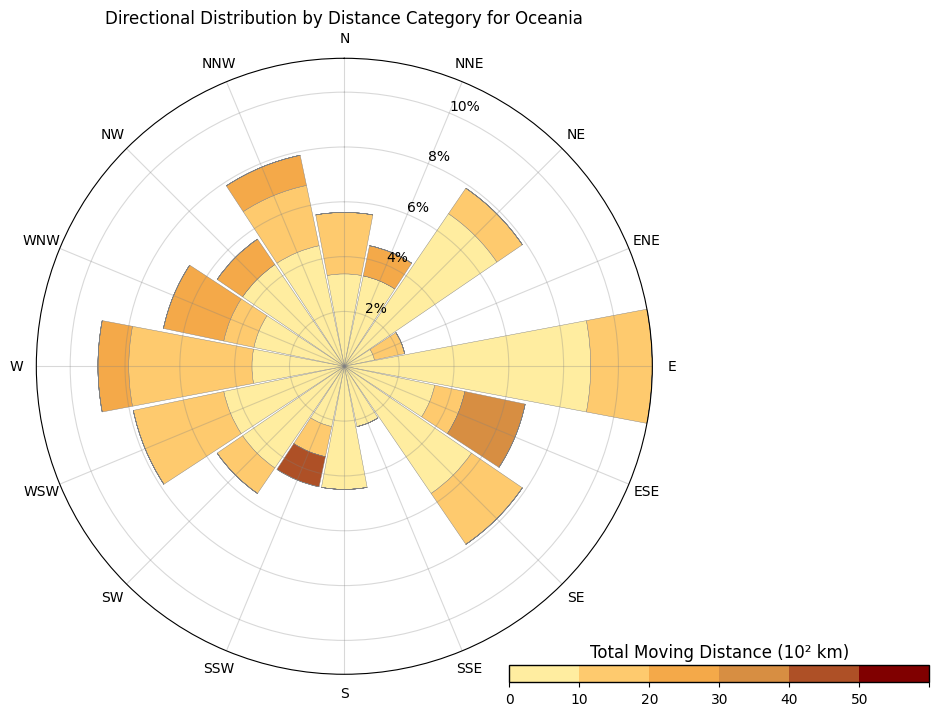

C:\Users\Amitesh\AppData\Local\Temp\ipykernel_19900\552809039.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ytick_labels)


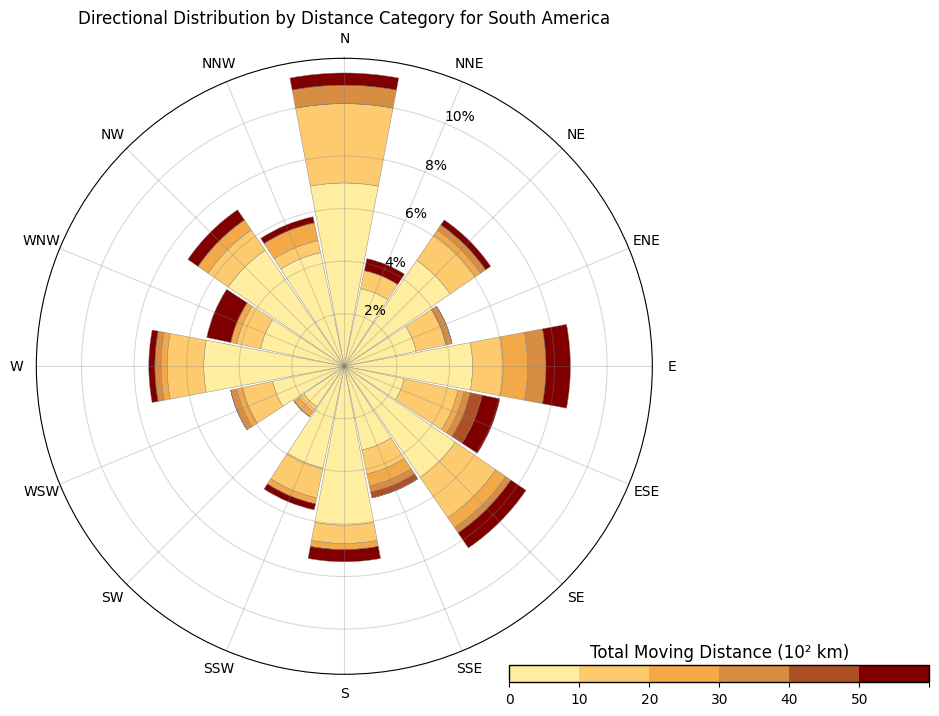

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize
import matplotlib.cm as cm

file_path = 'D:/PhD_Research/Paper-3_CHDW_Migration/Processing/Processed Data/Step_4_Event_Calculation/Event_Observ/Updated_Event_Displacement_Direction_With_Continent.xlsx'
df = pd.read_excel(file_path)

bounds = np.array([0, 1000, 2000,  3000,  4000,  5000, df['Total Distance'].max() + 1])
colors = ['#ffeda0', '#feb24c', '#cd853f', '#800000']
custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", colors, N=len(bounds)-1)
norm = Normalize(vmin=0, vmax=len(bounds)-2)
df['Distance Category'] = pd.cut(df['Total Distance'], bins=bounds, labels=np.arange(len(bounds)-1))

directions = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE',
              'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']
theta = np.linspace(0, 2 * np.pi, len(directions), endpoint=False)

save_directory = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots'  # Path to save the images
continents = df['Continent'].unique()
for continent in continents:
    df_continent = df[df['Continent'] == continent]
    aggregated_data = df_continent.groupby(['Direction', 'Distance Category']).size().unstack(fill_value=0)
    total_events = df_continent.shape[0]
    percentage_data = aggregated_data.divide(total_events).fillna(0) * 100
    percentage_data = percentage_data.reindex(directions).fillna(0)
    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(12, 8))
    fig.patch.set_facecolor('none')
    ax.patch.set_alpha(0)
    
    width = 2 * np.pi / len(directions) * 0.95
    bottom = np.zeros(len(directions))
    for i, category in enumerate(percentage_data.columns):
        heights = percentage_data[category]
        color = custom_cmap(norm(i))
        bars = ax.bar(theta, heights, width=width, bottom=bottom, color=color, edgecolor='grey', linewidth=0.3, label=f'{bounds[i]}-{bounds[i+1]} km')
        bottom += heights

    ax.yaxis.grid(True, linestyle='-', color='gray', alpha=0.3)
    ax.xaxis.grid(True, linestyle='-', color='gray', alpha=0.3)
    ax.set_xticks(theta)
    ax.set_xticklabels(directions)
    ax.set_theta_zero_location('N')
    ax.set_theta_direction(-1)
    yticks = ax.get_yticks()
    ytick_labels = [f'{int(tick)}%' for tick in yticks]
    ax.set_yticklabels(ytick_labels)
    plt.title(f"Directional Distribution by Distance Category for {continent}")
    cbar_ax = fig.add_axes([0.65, 0.10, 0.35, 0.022])
    sm = plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, cax=cbar_ax, orientation='horizontal', ticks=np.linspace(0, len(bounds)-2, 7))
    cbar.ax.set_xticklabels(['0','10','20','30','40','50', ''], fontsize=10)
    cbar.ax.xaxis.set_label_position('top')
    cbar.set_label('Total Moving Distance (10² km)', fontsize=12, labelpad=5)
    cbar.outline.set_edgecolor('black')
    cbar.outline.set_linewidth(1)
    high_res_png = f'{save_directory}\\Total_Distance_Direction_{continent}.png'
    plt.savefig(high_res_png, dpi=900, transparent=True)
    plt.show()


C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\4022146701.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ytick_labels, fontsize=7)  # Reduced fontsize for y-tick labels


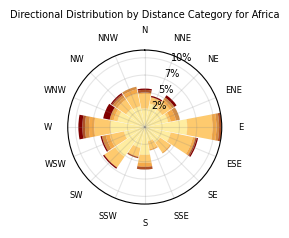

C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\4022146701.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ytick_labels, fontsize=7)  # Reduced fontsize for y-tick labels


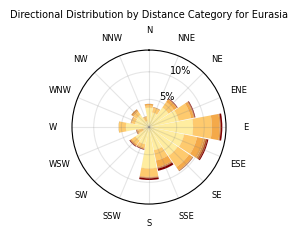

C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\4022146701.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ytick_labels, fontsize=7)  # Reduced fontsize for y-tick labels


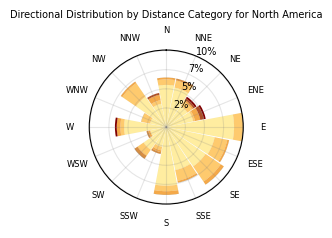

C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\4022146701.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ytick_labels, fontsize=7)  # Reduced fontsize for y-tick labels


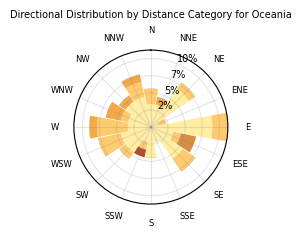

C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\4022146701.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ytick_labels, fontsize=7)  # Reduced fontsize for y-tick labels


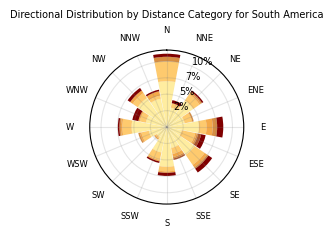

In [103]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize
import matplotlib.cm as cm

file_path = 'D:/PhD_Research/Paper-3_CHDW_Migration/Processing/Processed Data/Step_4_Event_Calculation/Event_Observ/Updated_Event_Displacement_Direction_With_Continent.xlsx'
df = pd.read_excel(file_path)

bounds = np.array([0, 1000, 2000, 3000, 4000, 5000, df['Total Distance'].max() + 1])
colors = ['#ffeda0', '#feb24c', '#cd853f', '#800000']
custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", colors, N=len(bounds)-1)
norm = Normalize(vmin=0, vmax=len(bounds)-2)

df['Distance Category'] = pd.cut(df['Total Distance'], bins=bounds, labels=np.arange(len(bounds)-1))

directions = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE',
              'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']
theta = np.linspace(0, 2 * np.pi, len(directions), endpoint=False)

save_directory = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots'
continents = df['Continent'].unique()
for continent in continents:
    df_continent = df[df['Continent'] == continent]
    aggregated_data = df_continent.groupby(['Direction', 'Distance Category']).size().unstack(fill_value=0)
    total_events = df_continent.shape[0]
    percentage_data = aggregated_data.divide(total_events).fillna(0) * 100
    percentage_data = percentage_data.reindex(directions).fillna(0)

    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(3, 2))
    fig.patch.set_facecolor('none')
    ax.patch.set_alpha(0)
    
    width = 2 * np.pi / len(directions) * 0.95
    bottom = np.zeros(len(directions))
    for i, category in enumerate(percentage_data.columns):
        heights = percentage_data[category]
        color = custom_cmap(norm(i))
        bars = ax.bar(theta, heights, width=width, bottom=bottom, color=color, edgecolor='grey', linewidth=0.01, label=f'{bounds[i]}-{bounds[i+1]} km')
        bottom += heights

    ax.yaxis.grid(True, linestyle='-', color='gray', alpha=0.2)
    ax.xaxis.grid(True, linestyle='-', color='gray', alpha=0.2)
    ax.set_xticks(theta)
    ax.set_xticklabels(directions, fontsize=6)
    ax.set_theta_zero_location('N')
    ax.set_theta_direction(-1)
    yticks = ax.get_yticks()
    ytick_labels = [f'{int(tick)}%' for tick in yticks]
    ax.set_yticklabels(ytick_labels, fontsize=7)
    plt.title(f"Directional Distribution by Distance Category for {continent}", fontsize=7)
    high_res_png = f'{save_directory}\\Total_Distance_Direction_{continent}.png'
    plt.savefig(high_res_png, dpi=900, transparent=True, bbox_inches='tight')
    plt.show()


In [1]:
import pandas as pd

file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Temporal_Events_Summary.xlsx'
data = pd.read_excel(file_path)

def top_40_percent(df):
    threshold = df['Total Voxels'].quantile(0.6)
    return df[df['Total Voxels'] >= threshold]
filtered_data = data.groupby('Continent').apply(top_40_percent)
filtered_data.reset_index(drop=True, inplace=True)
output_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Top_40_Percent_Events.xlsx'
filtered_data.to_excel(output_path, index=False)
print("Filtered data saved to:", output_path)


Filtered data saved to: D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Top_40_Percent_Events.xlsx


In [2]:
import pandas as pd

filtered_file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Top_40_Percent_Events.xlsx'
filtered_data = pd.read_excel(filtered_file_path)
direction_file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Updated_Event_Displacement_Direction_With_Continent.xlsx'
direction_data = pd.read_excel(direction_file_path)

event_ids = filtered_data['Event ID'].unique()
matched_direction_data = direction_data[direction_data['Event ID'].isin(event_ids)]
output_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Matched_Displacement_Direction.xlsx'
matched_direction_data.to_excel(output_path, index=False)

print("Matched data saved to:", output_path)


Matched data saved to: D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Matched_Displacement_Direction.xlsx


In [11]:
import pandas as pd

file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx'
data = pd.read_excel(file_path)

data['Date'] = pd.to_datetime(data['Date'])
data['Year'] = data['Date'].dt.year

output_data = data[['Event ID', 'Year']].drop_duplicates()
output_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
output_data.to_excel(output_path, index=False)


In [12]:
import pandas as pd

path_temporal_events = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
path_event_level_summary = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Level_Summary.xlsx'

temporal_events = pd.read_excel(path_temporal_events)
event_level_summary = pd.read_excel(path_event_level_summary)
merged_data = temporal_events.merge(event_level_summary[['Event ID', 'Duration', 'Total Voxels', 'Accumulated_Area', 'Total Magnitude', 'Intensity']], on='Event ID', how='left')
merged_data.to_excel(path_temporal_events, index=False)


In [13]:
import pandas as pd

path_main = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
path_additional = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Displacement_Direction_With_Continent.xlsx'

main_data = pd.read_excel(path_main)
additional_data = pd.read_excel(path_additional)
s
merged_data = main_data.merge(additional_data[['Event ID','Distance', 'Total Distance', 'Moving Speed']], on='Event ID', how='left')
merged_data.to_excel(path_main, index=False)


In [14]:
import pandas as pd

file_temporal = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
file_continent = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Updated_Event_Displacement_Direction_With_Continent.xlsx'
temporal_data = pd.read_excel(file_temporal)
continent_data = pd.read_excel(file_continent)

updated_data = temporal_data.merge(continent_data[['Event ID', 'Continent']], on='Event ID', how='left')
updated_data.to_excel(file_temporal, index=False)

print("The 'Temporal_Events_Summary.xlsx' file has been updated with 'Continent' information.")


The 'Temporal_Events_Summary.xlsx' file has been updated with 'Continent' information.


In [15]:
import pandas as pd

file_path1 = 'D:/PhD_Research/Paper-3_CHDW_Migration/Processing/Processed Data/Step_4_Event_Calculation/Event_Observ/Temporal_Events_Summary.xlsx'
file_path2 = 'D:/PhD_Research/Paper-3_CHDW_Migration/Processing/Processed Data/Step_4_Event_Calculation/Event_Observ/Event_Level_Summary.xlsx'
df1 = pd.read_excel(file_path1)
df2 = pd.read_excel(file_path2)

merged_df = df1.merge(df2[['Event ID', 'Maximum_Area']], on='Event ID', how='left')
merged_df.to_excel(file_path1, index=False)

print('The original Excel file has been updated.')


The original Excel file has been updated.


In [48]:
import pandas as pd

file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
data = pd.read_excel(file_path)

summary = data.groupby('Year').agg(
    Frequency=('Event ID', 'count'),
    Accumulated_Area=('Accumulated_Area', 'mean'),
    Lifetime=('Duration', 'mean'),
    Total_Magnitude =('Total Magnitude', 'mean'),
    Max_Intensity=('Intensity', 'max'),
    Intensity=('Intensity', 'mean'),
    Displacement=('Distance', 'mean'),
    Total_Moving_Distance=('Total Distance', 'mean'),
    Moving_Speed=('Moving Speed', 'mean'),
    Max_Speed=('Moving Speed', 'max'),
    Max_Area=('Maximum_Area','mean')
)
summary.rename(columns={'Frequency': 'Frequency (event)','Accumulated_Area': 'Accumulated Area (10⁶ km²)','Max_Area': 'Maximum Area (10⁵ km²)',
                        'Lifetime':'Lifetime (days)','Total_Magnitude':'Total Magnitude (10⁶ km²)',
                        'Total_Moving_Distance': 'Total Migration Distance (km)',
                        'Moving_Speed': 'Migration Speed (km/day)','Max_Speed': 'Max Moving Speed (km/day)','Displacement':'Displacement(km)'}, inplace=True)
output_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Yearly_Summary.xlsx'
summary.to_excel(output_path)

print("Yearly summary statistics have been saved.")


Yearly summary statistics have been saved.


C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21808\3624592418.py:46: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)  # Position top left, no frame
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21808\3624592418.py:46: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)  # Position top left, no frame
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21808\3624592418.py:46: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)  # Position top left, no frame
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21808\

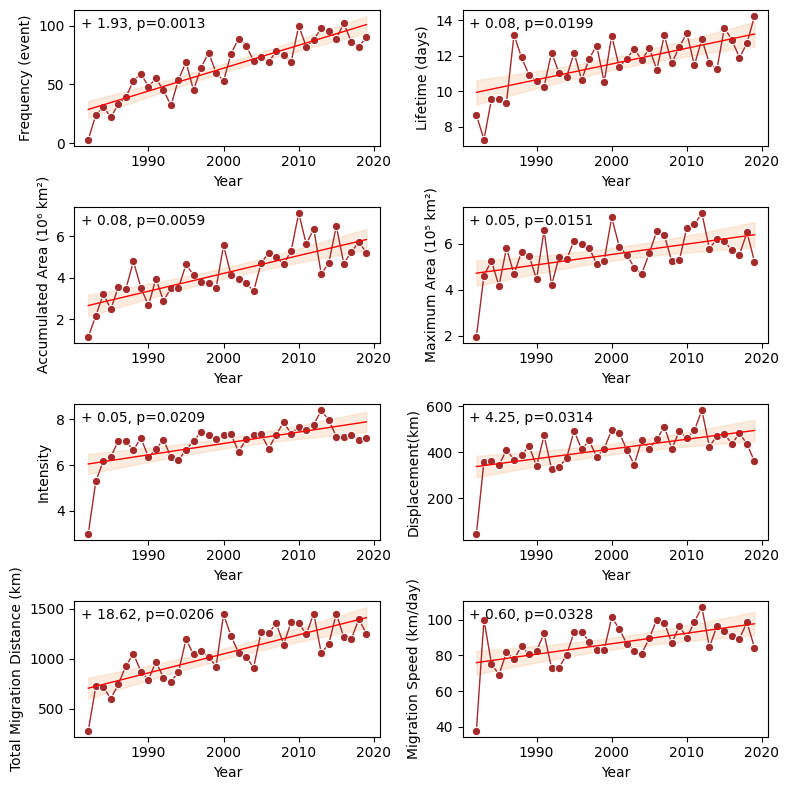

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import numpy as np
import os

df = pd.read_excel(r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Yearly_Summary.xlsx')
df['Decade'] = (df['Year'] // 10) * 10

def plot_with_trend(data, x, y, ax, title):
    decade_data = data.groupby('Decade').agg({y: 'mean', x: 'mean'}).reset_index()
    X_decade = sm.add_constant(decade_data['Decade'])
    model_decade = sm.OLS(decade_data[y], X_decade).fit()
    X_year = sm.add_constant(data['Year'])
    model_year = sm.OLS(data[y], X_year).fit()
    predictions_year = model_year.predict(X_year)
    prstd, iv_l, iv_u = sm.regression.linear_model.OLSResults.get_prediction(model_year, X_year).summary_frame(alpha=0.05)[['mean_se', 'mean_ci_lower', 'mean_ci_upper']].values.T
    sns.lineplot(x=x, y=y, data=data, ax=ax, marker='o', linestyle='-', lw=1, color='brown')
    ax.plot(data[x], predictions_year, color='red', lw=1)
    ax.fill_between(data[x], iv_l, iv_u, color='sandybrown', alpha=0.2)
    decade_slope = model_decade.params[1]
    decade_pvalue = model_decade.pvalues[1]
    ax.text(0.02, 0.95, f'+ {decade_slope:.2f}, p={decade_pvalue:.4f}', transform=ax.transAxes, fontsize=10, verticalalignment='top')
    ax.set_xlabel('Year')
    ax.set_ylabel(y)
    ax.legend(loc='upper left', frameon=False)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(8, 8))

columns = ['Frequency (event)', 'Lifetime (days)', 'Accumulated Area (10⁶ km²)',
           'Maximum Area (10⁵ km²)', 'Intensity', 
           'Displacement(km)', 'Total Migration Distance (km)', 'Migration Speed (km/day)']

for ax, column in zip(axes.flatten(), columns):
    plot_with_trend(df, 'Year', column, ax, column)

plt.tight_layout()
output_dir = r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots'
output_file = 'Temporal Characteristics with Yearly Trends.png'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
plt.savefig(os.path.join(output_dir, output_file), dpi=300)
plt.show()


C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21808\1741374517.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21808\1741374517.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21808\1741374517.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21808\1741374517.py:40: UserWarning: No artists with labels found to put in legend.  Note that arti

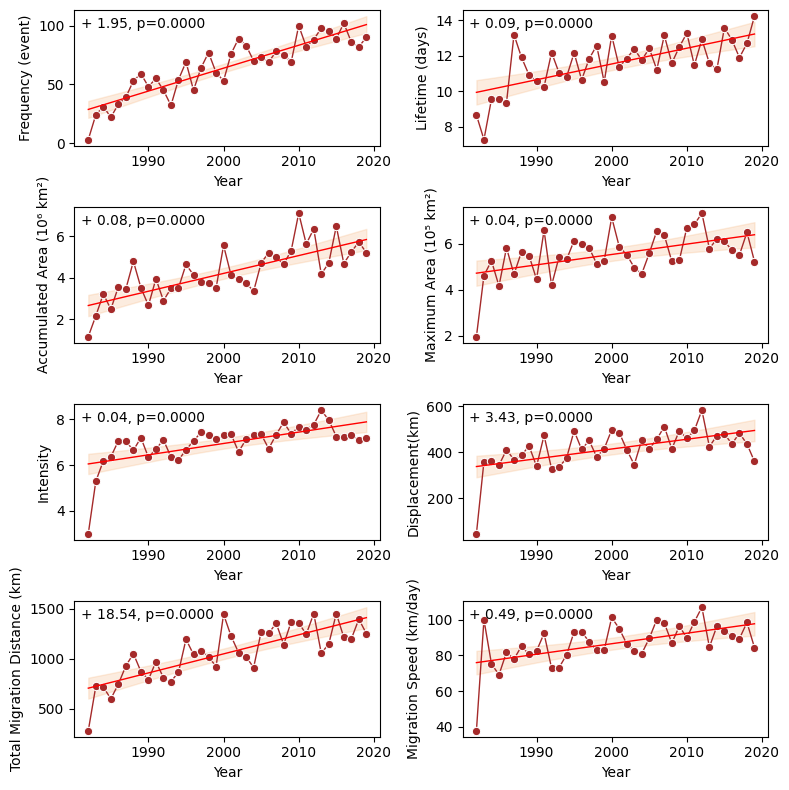

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import numpy as np
import os
import pymannkendall as mk

df = pd.read_excel(r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Yearly_Summary.xlsx')

def plot_with_trend(data, x, y, ax, title):
    X_year = sm.add_constant(data['Year'])
    model_year = sm.OLS(data[y], X_year).fit()
    predictions_year = model_year.predict(X_year)
    prstd, iv_l, iv_u = sm.regression.linear_model.OLSResults.get_prediction(model_year, X_year).summary_frame(alpha=0.05)[['mean_se', 'mean_ci_lower', 'mean_ci_upper']].values.T
    sns.lineplot(x=x, y=y, data=data, ax=ax, marker='o', linestyle='-', lw=1, color='brown')
    ax.plot(data[x], predictions_year, color='red', lw=1)
    ax.fill_between(data[x], iv_l, iv_u, color='sandybrown', alpha=0.2)
    mk_result = mk.yue_wang_modification_test(data[y], alpha=0.05)
    ax.text(0.02, 0.95, f'+ {mk_result.slope:.2f}, p={mk_result.p:.4f}', transform=ax.transAxes, fontsize=10, verticalalignment='top')
    ax.set_xlabel('Year')
    ax.set_ylabel(y)
    ax.legend(loc='upper left', frameon=False)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(8, 8))
columns = ['Frequency (event)', 'Lifetime (days)', 'Accumulated Area (10⁶ km²)',
           'Maximum Area (10⁵ km²)', 'Intensity', 
           'Displacement(km)', 'Total Migration Distance (km)', 'Migration Speed (km/day)']
for ax, column in zip(axes.flatten(), columns):
    plot_with_trend(df, 'Year', column, ax, column)
plt.tight_layout()
output_dir = r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots'
output_file = 'Temporal Characteristics with Yearly Trends.png'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
plt.savefig(os.path.join(output_dir, output_file), dpi=300)
plt.show()


C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\2672326614.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\2672326614.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\2672326614.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\2672326614.py:50: UserWarning: No artists with labels found to put in legend.  Note that arti

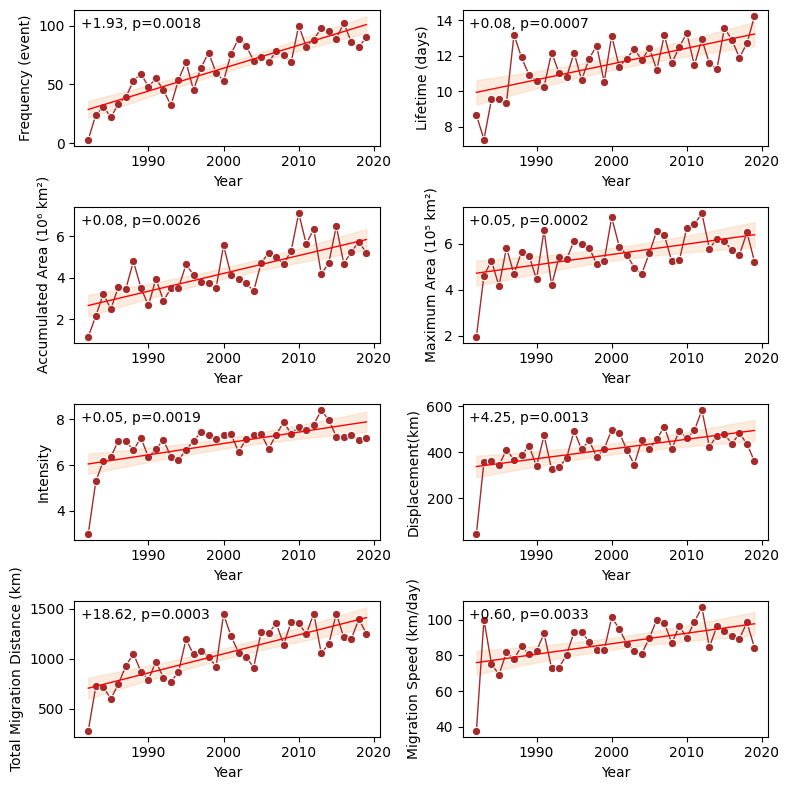

In [105]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import numpy as np
import os
import pymannkendall as mk
df = pd.read_excel(r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Yearly_Summary.xlsx')
df['Decade'] = (df['Year'] // 10) * 10
def plot_with_trend(data, x, y, ax, title):
    decade_data = data.groupby('Decade').agg({y: 'mean', x: 'mean'}).reset_index()
    X_decade = sm.add_constant(decade_data['Decade'])
    model_decade = sm.OLS(decade_data[y], X_decade).fit()
    predictions_decade = model_decade.predict(X_decade)
    X_year = sm.add_constant(data['Year'])
    model_year = sm.OLS(data[y], X_year).fit()
    predictions_year = model_year.predict(X_year)
    prstd, iv_l, iv_u = sm.regression.linear_model.OLSResults.get_prediction(model_year, X_year).summary_frame(alpha=0.05)[['mean_se', 'mean_ci_lower', 'mean_ci_upper']].values.T
    sns.lineplot(x=x, y=y, data=data, ax=ax, marker='o', linestyle='-', lw=1, color='brown')
    ax.plot(data[x], predictions_year, color='red', lw=1)
    ax.fill_between(data[x], iv_l, iv_u, color='sandybrown', alpha=0.2)
    mk_result = mk.yue_wang_modification_test(decade_data[y], alpha=0.05)
    ax.text(0.02, 0.95, f'+{model_decade.params[1]:.2f}, p={mk_result.p:.4f}', 
            transform=ax.transAxes, fontsize=10, verticalalignment='top')
    ax.set_xlabel('Year')
    ax.set_ylabel(y)
    ax.legend(loc='upper left', frameon=False)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(8, 8))
columns = ['Frequency (event)', 'Lifetime (days)', 'Accumulated Area (10⁶ km²)',
           'Maximum Area (10⁵ km²)', 'Intensity', 
           'Displacement(km)', 'Total Migration Distance (km)', 'Migration Speed (km/day)']
for ax, column in zip(axes.flatten(), columns):
    plot_with_trend(df, 'Year', column, ax, column)
plt.tight_layout()
output_dir = r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots'
output_file = 'Temporal Characteristics with Yearly Trends and Decadal MK Test.png'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
plt.savefig(os.path.join(output_dir, output_file), dpi=300)
plt.show()


In [45]:
import pandas as pd
file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Level_Summary.xlsx'
df = pd.read_excel(file_path)
def classify_location(latitude):
    if -40 <= latitude <= 40:
        return 'Tropics'
    elif 40 < latitude <= 66 or -66 <= latitude < -40:
        return 'High Latitude'
    else:
        return 'Other'
df['Location'] = df['Latitude'].apply(classify_location)
output_df = df[['Event ID', 'Location']]
output_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Tropics_Mid_latitude_Indicator.xlsx'
output_df.to_excel(output_path, index=False)
print("File has been saved successfully!")

File has been saved successfully!


In [47]:
import pandas as pd
event_data_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
event_df = pd.read_excel(event_data_path)
location_data_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Tropics_Mid_latitude_Indicator.xlsx'
location_df = pd.read_excel(location_data_path)
merged_df = pd.merge(event_df, location_df, on='Event ID', how='left')
tropics_df = merged_df[merged_df['Location'] == 'Tropics']
high_latitude_df = merged_df[merged_df['Location'] == 'High Latitude']
output_path_tropics = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Tropics_Events_Summary.xlsx'
output_path_high_latitude = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\High_Latitude_Events_Summary.xlsx'
tropics_df.to_excel(output_path_tropics, index=False)
high_latitude_df.to_excel(output_path_high_latitude, index=False)
print("Files have been saved successfully!")

Files have been saved successfully!


In [57]:
import pandas as pd
event_data_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
event_df = pd.read_excel(event_data_path)
location_data_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Tropics_Mid_latitude_Indicator.xlsx'
location_df = pd.read_excel(location_data_path)
merged_df = pd.merge(event_df, location_df, on='Event ID', how='left')
def process_data(data, category_name):
    summary = data.groupby('Year').agg(
        Frequency=('Event ID', 'count'),
        Accumulated_Area=('Accumulated_Area', 'mean'),
        Lifetime=('Duration', 'mean'),
        Total_Magnitude =('Total Magnitude', 'mean'),
        Max_Intensity=('Intensity', 'max'),
        Intensity=('Intensity', 'mean'),
        Displacement=('Distance', 'mean'),
        Total_Moving_Distance=('Total Distance', 'mean'),
        Moving_Speed=('Moving Speed', 'mean'),
        Max_Speed=('Moving Speed', 'max'),
        Max_Area=('Maximum_Area','mean')
    )
    summary.rename(columns={
        'Frequency': 'Frequency (event)',
        'Accumulated_Area': 'Accumulated Area (10⁶ km²)',
        'Max_Area': 'Maximum Area (10⁵ km²)',
        'Lifetime':'Lifetime (days)',
        'Total_Magnitude':'Total Magnitude (10⁶ km²)',
        'Total_Moving_Distance': 'Total Migration Distance (km)',
        'Moving_Speed': 'Migration Speed (km/day)',
        'Max_Speed': 'Max Moving Speed (km/day)',
        'Displacement':'Displacement(km)'
    }, inplace=True)
    output_path = f'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\{category_name}_Yearly_Summary.xlsx'
    summary.to_excel(output_path)
    print(f"Yearly summary statistics for {category_name} have been saved.")
tropics_df = merged_df[merged_df['Location'] == 'Tropics']
process_data(tropics_df, "Tropics")
high_latitude_df = merged_df[merged_df['Location'] == 'High Latitude']
process_data(high_latitude_df, "High_Latitude")

Yearly summary statistics for Tropics have been saved.
Yearly summary statistics for High_Latitude have been saved.


In [61]:
import pandas as pd
high_latitude_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\High_Latitude_Yearly_Summary.xlsx'
high_latitude_data = pd.read_excel(high_latitude_path)
tropics_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Tropics_Yearly_Summary.xlsx'
tropics_data = pd.read_excel(tropics_path)
high_latitude_data.columns = [col + '_HighLatitude' if col != 'Year' else col for col in high_latitude_data.columns]
tropics_data.columns = [col + '_Tropics' if col != 'Year' else col for col in tropics_data.columns]
merged_data = pd.merge(high_latitude_data, tropics_data, on='Year', how='outer')
output_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Merged_Yearly_Summary.xlsx'
merged_data.to_excel(output_path, index=False)
print("The merged file has been saved successfully.")

The merged file has been saved successfully.


C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\741600417.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\741600417.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\741600417.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\741600417.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists 

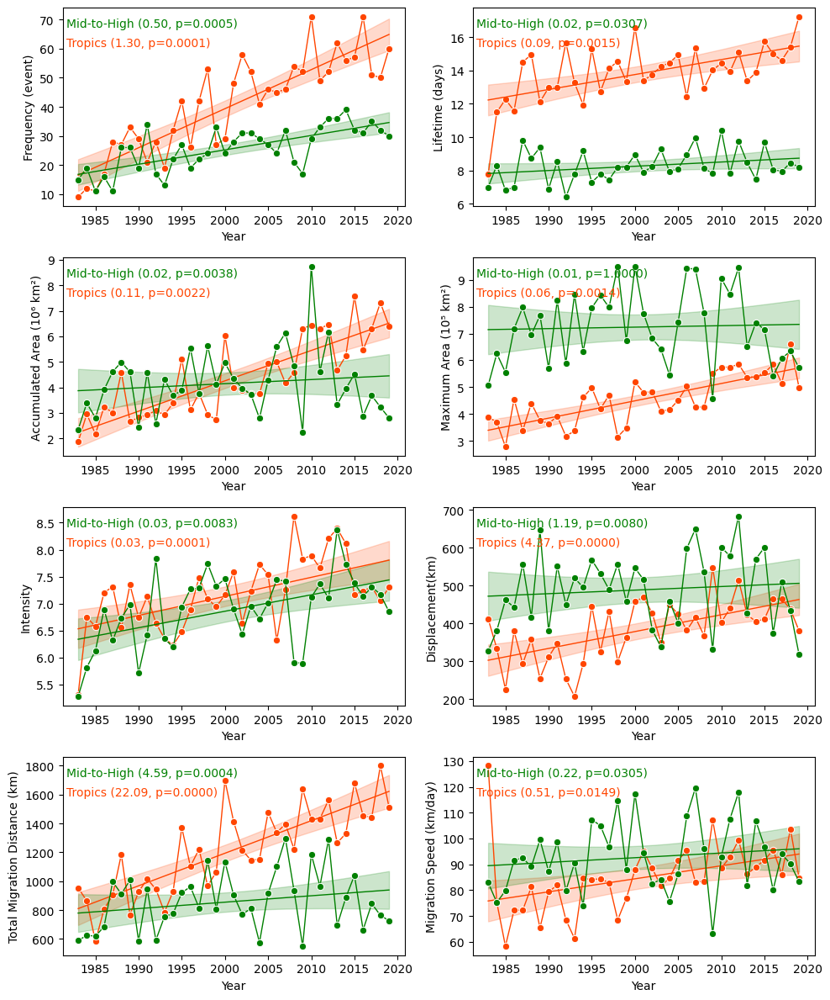

In [101]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import numpy as np
import os
import pymannkendall as mk

file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Merged_Yearly_Summary.xlsx'
df = pd.read_excel(file_path)
df['Decade'] = (df['Year'] // 10) * 10

def plot_with_trend(data, x, y_suffix, ax, title_prefix):
    for location, color in zip(['Tropics', 'HighLatitude'], ['orangered', 'green']):
        display_location = "Mid-to-High" if location == 'HighLatitude' else 'Tropics'
        column = title_prefix + '_' + location
        decade_data = data.groupby('Decade').agg({
            column: 'mean',
            x: 'mean'
        }).reset_index()
        X_decade = sm.add_constant(decade_data['Decade'])
        model_decade = sm.OLS(decade_data[column], X_decade).fit()
        predictions_decade = model_decade.predict(X_decade)
        X_year = sm.add_constant(data['Year'])
        model_year = sm.OLS(data[column], X_year).fit()
        predictions_year = model_year.predict(X_year)
        prediction_results = sm.regression.linear_model.OLSResults.get_prediction(model_year, X_year).summary_frame(alpha=0.05)
        iv_l = prediction_results['mean_ci_lower']
        iv_u = prediction_results['mean_ci_upper']
        sns.lineplot(x=x, y=column, data=data, ax=ax, marker='o', linestyle='-', lw=1, color=color)
        ax.plot(data[x], predictions_year, color=color, lw=1)
        ax.fill_between(data[x], iv_l, iv_u, color=color, alpha=0.2)
        mk_result = mk.yue_wang_modification_test(decade_data[column], alpha=0.05)
        offset = 0.95 if location == 'HighLatitude' else 0.85 
        text_label = f"{display_location} ({model_decade.params[1]:.2f}, p={mk_result.p:.4f})"
        ax.text(0.01, offset, text_label, transform=ax.transAxes, fontsize=10, verticalalignment='top', horizontalalignment='left', color=color)
    ax.set_xlabel('Year')
    ax.set_ylabel(y_suffix)
    ax.legend(loc='upper left', frameon=False)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 12))
column_prefixes =  ['Frequency (event)', 'Lifetime (days)', 'Accumulated Area (10⁶ km²)',
                    'Maximum Area (10⁵ km²)', 'Intensity', 
                    'Displacement(km)', 'Total Migration Distance (km)', 'Migration Speed (km/day)']
for ax, prefix in zip(axes.flatten(), column_prefixes):
    plot_with_trend(df, 'Year', prefix, ax, prefix)
plt.tight_layout()
output_dir = r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots'
output_file = 'Comparative_Temporal_Characteristics.png'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
plt.savefig(os.path.join(output_dir, output_file), dpi=300)
plt.show()

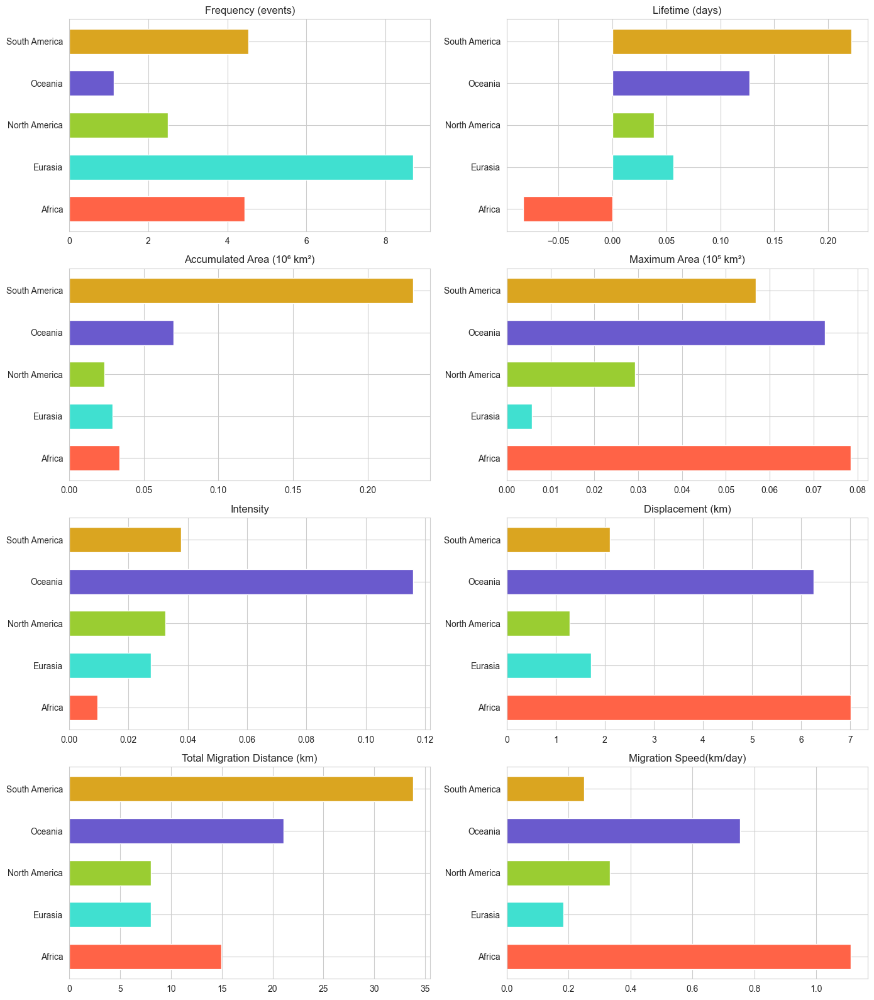

In [124]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
df = pd.read_excel(file_path)
df['Frequency'] = 1
df['Decade'] = (df['Year'] // 10) * 10
aggregations = {
    'Frequency': 'sum',
    'Duration': 'mean',
    'Accumulated_Area': 'mean',
    'Maximum_Area': 'mean',  
    'Intensity':'mean',
    'Distance': 'mean', 
    'Total Distance': 'mean', 
    'Moving Speed': 'mean',
}
grouped_data = df.groupby(['Decade', 'Continent']).agg(aggregations).reset_index()
sns.set_style("whitegrid"
continents = grouped_data['Continent'].unique()
trends = {variable: [] for variable in aggregations}
for variable in aggregations:
    for continent in continents:
        subset = grouped_data[grouped_data['Continent'] == continent]
        if not subset.empty:
            X = sm.add_constant(subset['Decade'])
            y = subset[variable]
            model = sm.OLS(y, X).fit()
            slope = model.params['Decade']
            trends[variable].append(slope)
        else:
            trends[variable].append(0)
variable_labels = {
    'Frequency': 'Frequency (events)',
    'Duration': 'Lifetime (days)',
    'Accumulated_Area': 'Accumulated Area (10⁶ km²)',
    'Maximum_Area': 'Maximum Area (10⁵ km²)',
    'Intensity': 'Intensity',
    'Distance': 'Displacement (km)',
    'Total Distance': 'Total Migration Distance (km)',
    'Moving Speed': 'Migration Speed(km/day)',
}

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(14, 16))
axes = axes.flatten()

for ax, (variable, values) in zip(axes, trends.items()):
    colors = [continent_colors[cont] for cont in continents if cont in continent_colors]
    ax.barh(continents, values, color=colors, height=0.6)
    ax.set_title(f'{variable_labels[variable]}')
plt.tight_layout()
plt.show()


In [134]:
import pandas as pd
file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Level_Summary.xlsx'
df = pd.read_excel(file_path)

def classify_hemisphere(latitude):
    if latitude > 0 and latitude <= 66: 
        return 'North Hemisphere'
    elif latitude < 0 and latitude >= -66:  
        return 'South Hemisphere'
    else:
        return 'Other' 
df['Hemisphere'] = df['Latitude'].apply(classify_hemisphere)
output_df = df[['Event ID', 'Hemisphere']]
output_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Hemisphere_Indicator.xlsx'
output_df.to_excel(output_path, index=False)
print("Hemisphere Indicator file has been saved successfully!")


Hemisphere Indicator file has been saved successfully!


In [135]:
import pandas as pd
event_data_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
event_df = pd.read_excel(event_data_path)
location_data_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Hemisphere_Indicator.xlsx'
location_df = pd.read_excel(location_data_path)
merged_df = pd.merge(event_df, location_df, on='Event ID', how='left')
north_hemisphere_df = merged_df[merged_df['Hemisphere'] == 'North Hemisphere']
south_hemisphere_df = merged_df[merged_df['Hemisphere'] == 'South Hemisphere']
output_path_north = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\North_Hemisphere_Events_Summary.xlsx'
output_path_south = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\South_Hemisphere_Events_Summary.xlsx'
north_hemisphere_df.to_excel(output_path_north, index=False)
south_hemisphere_df.to_excel(output_path_south, index=False)
print("North and South Hemisphere files have been saved successfully!")

North and South Hemisphere files have been saved successfully!


In [136]:
import pandas as pd
event_data_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
event_df = pd.read_excel(event_data_path)
location_data_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Hemisphere_Indicator.xlsx'
location_df = pd.read_excel(location_data_path)
merged_df = pd.merge(event_df, location_df, on='Event ID', how='left')
def process_data(data, category_name):
    summary = data.groupby('Year').agg(
        Frequency=('Event ID', 'count'),
        Accumulated_Area=('Accumulated_Area', 'mean'),
        Lifetime=('Duration', 'mean'),
        Total_Magnitude =('Total Magnitude', 'mean'),
        Max_Intensity=('Intensity', 'max'),
        Intensity=('Intensity', 'mean'),
        Displacement=('Distance', 'mean'),
        Total_Moving_Distance=('Total Distance', 'mean'),
        Moving_Speed=('Moving Speed', 'mean'),
        Max_Speed=('Moving Speed', 'max'),
        Max_Area=('Maximum_Area','mean')
    )
    summary.rename(columns={
        'Frequency': 'Frequency (event)',
        'Accumulated_Area': 'Accumulated Area (10⁶ km²)',
        'Max_Area': 'Maximum Area (10⁵ km²)',
        'Lifetime':'Lifetime (days)',
        'Total_Magnitude':'Total Magnitude (10⁶ km²)',
        'Total_Moving_Distance': 'Total Migration Distance (km)',
        'Moving_Speed': 'Migration Speed (km/day)',
        'Max_Speed': 'Max Moving Speed (km/day)',
        'Displacement':'Displacement(km)'
    }, inplace=True)
    output_path = f'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\{category_name}_Yearly_Summary.xlsx'
    summary.to_excel(output_path)
    print(f"Yearly summary statistics for {category_name} have been saved.")
north_hemisphere_df = merged_df[merged_df['Hemisphere'] == 'North Hemisphere']
process_data(north_hemisphere_df, "North_Hemisphere")
south_hemisphere_df = merged_df[merged_df['Hemisphere'] == 'South Hemisphere']
process_data(south_hemisphere_df, "South_Hemisphere")

Yearly summary statistics for North_Hemisphere have been saved.
Yearly summary statistics for South_Hemisphere have been saved.


In [137]:
import pandas as pd
north_hemisphere_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\North_Hemisphere_Yearly_Summary.xlsx'
north_hemisphere_data = pd.read_excel(north_hemisphere_path)
south_hemisphere_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\South_Hemisphere_Yearly_Summary.xlsx'
south_hemisphere_data = pd.read_excel(south_hemisphere_path)
north_hemisphere_data.columns = [col + '_North' if col != 'Year' else col for col in north_hemisphere_data.columns]
south_hemisphere_data.columns = [col + '_South' if col != 'Year' else col for col in south_hemisphere_data.columns]
merged_data = pd.merge(north_hemisphere_data, south_hemisphere_data, on='Year', how='outer')
output_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Merged_Hemisphere_Yearly_Summary.xlsx'
merged_data.to_excel(output_path, index=False)
print("The merged hemisphere file has been saved successfully.")


The merged hemisphere file has been saved successfully.


C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\1610373107.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\1610373107.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\1610373107.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=False)
C:\Users\Amitesh\AppData\Local\Temp\ipykernel_21848\1610373107.py:59: UserWarning: No artists with labels found to put in legend.  Note that arti

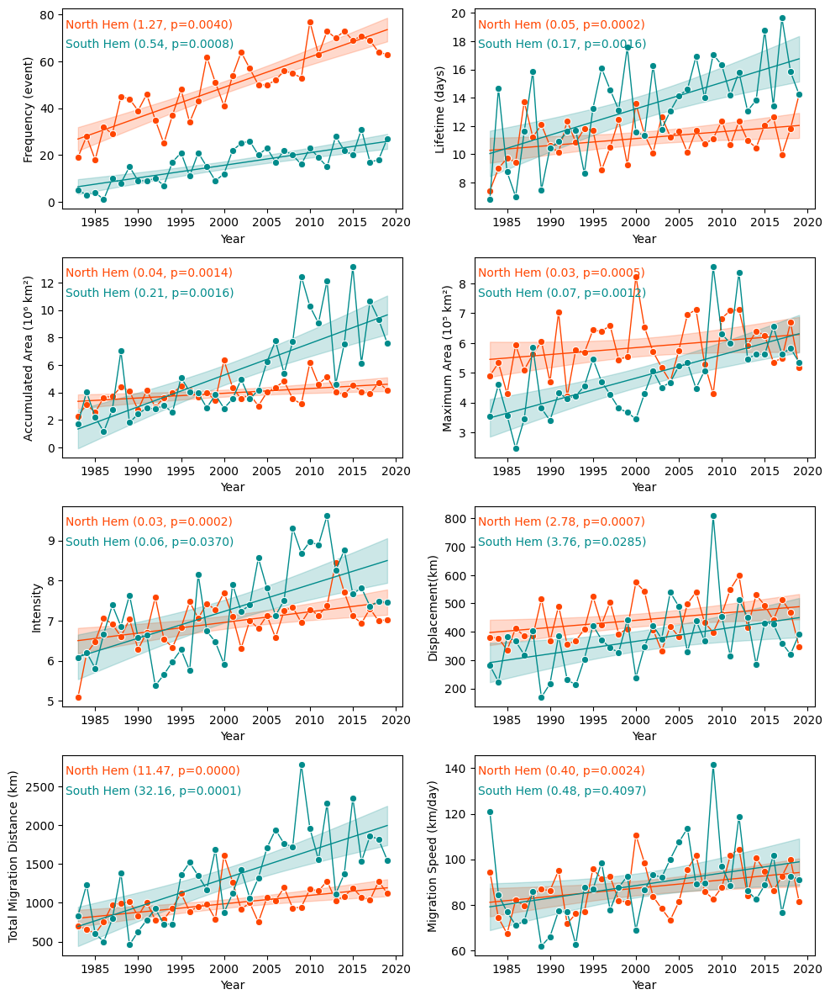

In [102]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import numpy as np
import os
import pymannkendall as mk
file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Merged_Hemisphere_Yearly_Summary.xlsx'
df = pd.read_excel(file_path)
df['Decade'] = (df['Year'] // 10) * 10
def plot_with_trend(data, x, y_suffix, ax, title_prefix):
    for location, color in zip(['North', 'South'], ['orangered', 'darkcyan']):
        display_location = "North Hem" if location == 'North' else 'South Hem'
        column = title_prefix + '_' + location
        decade_data = data.groupby('Decade').agg({
            column: 'mean',
            x: 'mean'
        }).reset_index()
        X_decade = sm.add_constant(decade_data['Decade'])
        model_decade = sm.OLS(decade_data[column], X_decade).fit()
        predictions_decade = model_decade.predict(X_decade)
        X_year = sm.add_constant(data['Year'])
        model_year = sm.OLS(data[column], X_year).fit()
        predictions_year = model_year.predict(X_year)
        prediction_results = sm.regression.linear_model.OLSResults.get_prediction(model_year, X_year).summary_frame(alpha=0.05)
        iv_l = prediction_results['mean_ci_lower']
        iv_u = prediction_results['mean_ci_upper']
        sns.lineplot(x=x, y=column, data=data, ax=ax, marker='o', linestyle='-', lw=1, color=color)
        ax.plot(data[x], predictions_year, color=color, lw=1)
        ax.fill_between(data[x], iv_l, iv_u, color=color, alpha=0.2)
        mk_result = mk.yue_wang_modification_test(decade_data[column], alpha=0.05)
        offset = 0.95 if location == 'North' else 0.85 
        text_label = f"{display_location} ({model_decade.params[1]:.2f}, p={mk_result.p:.4f})"
        ax.text(0.01, offset, text_label, transform=ax.transAxes, fontsize=10, verticalalignment='top', horizontalalignment='left', color=color)

    ax.set_xlabel('Year')
    ax.set_ylabel(y_suffix)
    ax.legend(loc='upper left', frameon=False)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 12))
column_prefixes =  ['Frequency (event)', 'Lifetime (days)', 'Accumulated Area (10⁶ km²)',
                    'Maximum Area (10⁵ km²)', 'Intensity', 
                    'Displacement(km)', 'Total Migration Distance (km)', 'Migration Speed (km/day)']
for ax, prefix in zip(axes.flatten(), column_prefixes):
    plot_with_trend(df, 'Year', prefix, ax, prefix)
plt.tight_layout()
output_dir = r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots'
output_file = 'Comparative_Temporal_Characteristics2.png'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
plt.savefig(os.path.join(output_dir, output_file), dpi=300)
plt.show()

In [175]:
import pandas as pd
file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Daily_Summary_CDHW_Events.xlsx'
data = pd.read_excel(file_path)
data['Date'] = pd.to_datetime(data['Date'])
grouped_data = data.groupby('Event ID').agg({
    'Date': ['min', 'max']
}).reset_index()
grouped_data.columns = ['Event ID', 'Start Date', 'End Date']
grouped_data['Duration (Days)'] = (grouped_data['End Date'] - grouped_data['Start Date']).dt.days + 1
grouped_data['Start Date'] = grouped_data['Start Date'].dt.strftime('%Y-%m-%d')
grouped_data['End Date'] = grouped_data['End Date'].dt.strftime('%Y-%m-%d')
output_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\CDHW_Summary_Event_Identification.xlsx'
grouped_data.to_excel(output_path, index=False)
print('Excel file has been saved successfully!')

Excel file has been saved successfully!


In [176]:
import pandas as pd
file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Daily_Summary_CDHW_Events.xlsx'
data = pd.read_excel(file_path)
data['Date'] = pd.to_datetime(data['Date'])
data['Year'] = data['Date'].dt.year
data['Month'] = data['Date'].dt.month
data['Day'] = data['Date'].dt.day
data['Centroid_x'] = data['Longitude']
data['Centroid_y'] = data['Latitude']
output_data = data[['Event ID', 'Year', 'Month', 'Day', 'Centroid_x', 'Centroid_y']]
output_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\Centriod_Intensity_StationsCount.xlsx'
output_data.to_excel(output_path, index=False)
print('Excel file has been saved successfully!')

Excel file has been saved successfully!


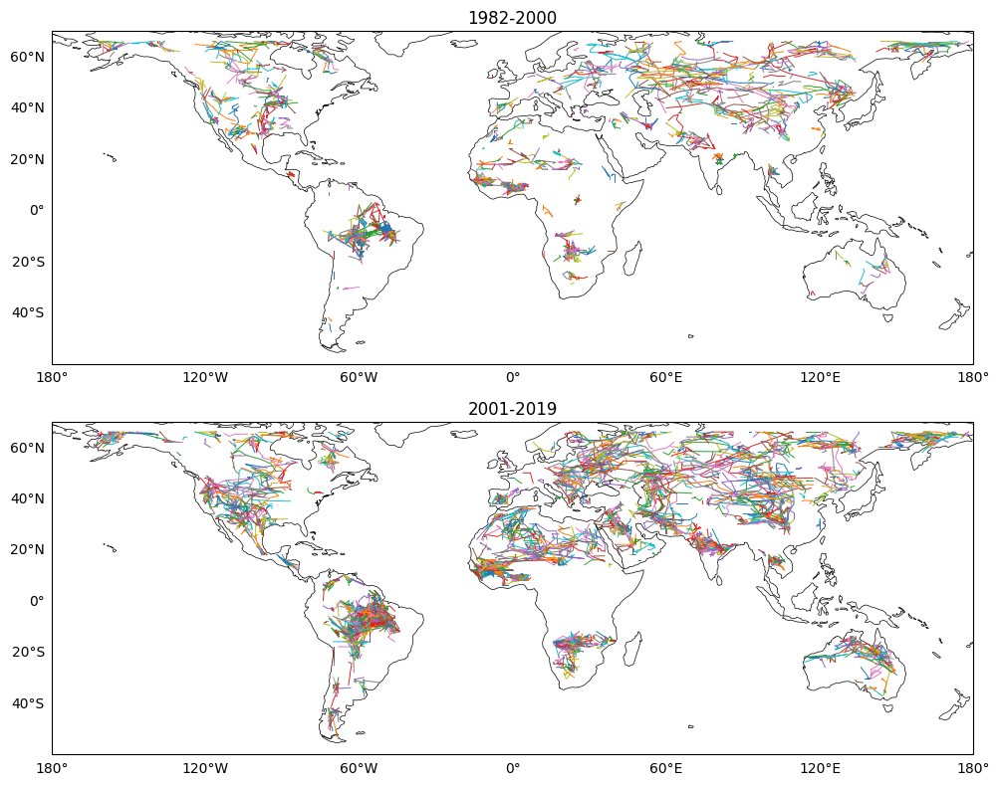

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
file_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data = pd.read_excel(file_path)
data['Year'] = pd.DatetimeIndex(data['Date']).year
data['Decade'] = (data['Year'] // 10) * 10
periods = [(1982, 2000), (2001, 2019)]
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})

for ax, (start_year, end_year) in zip(axes.flatten(), periods):
    period_data = data[(data['Year'] >= start_year) & (data['Year'] < end_year)]
    for event_id in period_data['Event ID'].unique():
        event_data = period_data[period_data['Event ID'] == event_id].sort_values(by='Date')
        ax.plot(event_data['Longitude'], event_data['Latitude'], transform=ccrs.Geodetic(), linestyle='-', markersize=2, linewidth=0.7)
    ax.set_title(f'{start_year}-{end_year}')
    ax.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
    ax.coastlines(resolution='110m', linewidth=0.5)
    gl = ax.gridlines(draw_labels=True, linewidth=0, color='gray', alpha=0)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlines = False
    gl.ylines = False
plt.tight_layout()
plt.savefig(r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Map_Periods.png", dpi=600)
plt.show()

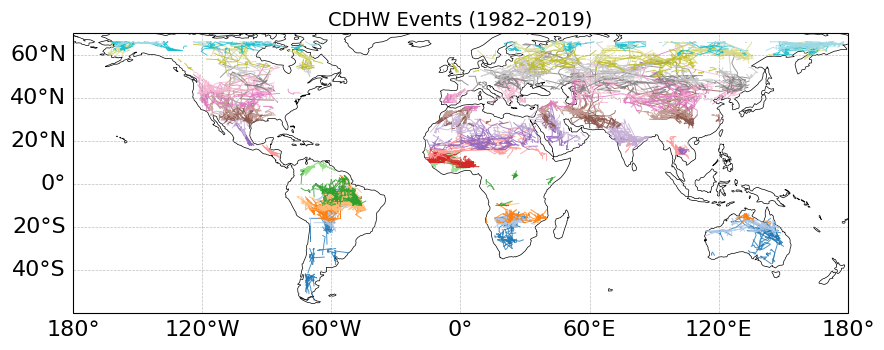

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
file_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data = pd.read_excel(file_path)
data['Year'] = pd.DatetimeIndex(data['Date']).year
unique_events = data['Event ID'].unique()
np.random.seed(42) 
colors = plt.cm.tab20(np.linspace(0, 1, len(unique_events)))
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': ccrs.PlateCarree()})
for event_id, color in zip(unique_events, colors):
    event_data = data[data['Event ID'] == event_id].sort_values(by='Date')
    ax.plot(
        event_data['Longitude'], event_data['Latitude'], 
        transform=ccrs.Geodetic(), linestyle='-', 
        color=color, linewidth=0.7, alpha=0.8
    )
ax.coastlines(resolution='110m', linewidth=0.5)
ax.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
ax.set_title('CDHW Events (1982–2019)', fontsize=14)
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Combined_Colorful_Lines.png"
plt.savefig(output_path, dpi=600)
plt.show()

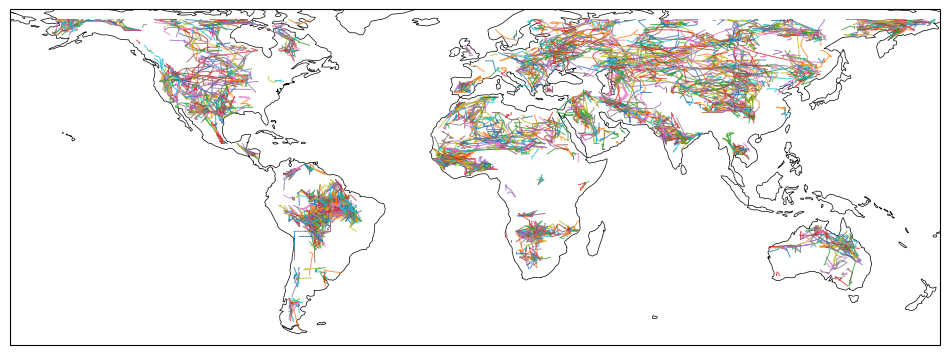

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
file_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data = pd.read_excel(file_path)
data['Year'] = pd.DatetimeIndex(data['Date']).year
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
for event_id in data['Event ID'].unique():
    event_data = data[data['Event ID'] == event_id].sort_values(by='Date')
    ax.plot(
        event_data['Longitude'], event_data['Latitude'], 
        transform=ccrs.Geodetic(), linestyle='-', 
        linewidth=0.7, alpha=0.8 
    )
ax.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
ax.coastlines(resolution='110m', linewidth=0.5)
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Combined_Map.png"
plt.savefig(output_path, dpi=600)
plt.show()

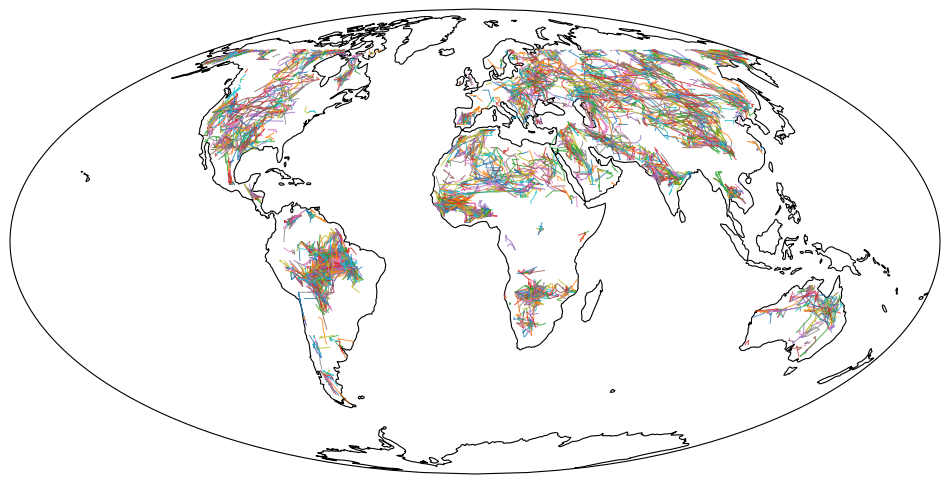

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
file_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data = pd.read_excel(file_path)
data['Year'] = pd.DatetimeIndex(data['Date']).year
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.Mollweide(central_longitude=0)})
for event_id in data['Event ID'].unique():
    event_data = data[data['Event ID'] == event_id].sort_values(by='Date')
    ax.plot(
        event_data['Longitude'], event_data['Latitude'], 
        transform=ccrs.PlateCarree(), linestyle='-', 
        linewidth=0.7, alpha=0.8  # Keep the same colorful lines as in the original
    )
ax.coastlines(resolution='110m', linewidth=0.8)
ax.set_global()
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Improved_Mollweide_Map.png"
plt.savefig(output_path, dpi=600, bbox_inches='tight')
plt.show()

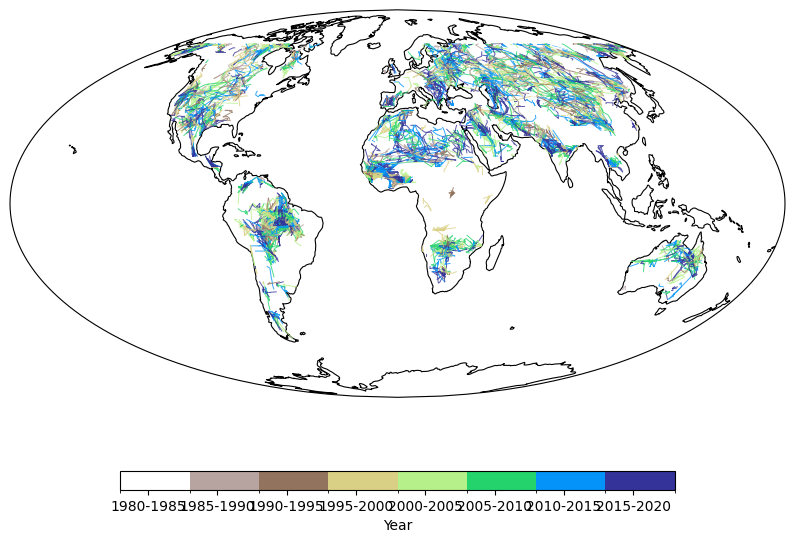

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
file_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data = pd.read_excel(file_path)
data['Year'] = pd.DatetimeIndex(data['Date']).year
def assign_decade(year):
    if 1980 <= year < 1990:
        return '1980-1990'
    elif 1990 <= year < 2000:
        return '1990-2000'
    elif 2000 <= year < 2010:
        return '2000-2010'
    elif 2010 <= year < 2020:
        return '2010-2020'
    return 'Unknown'

data['Decade'] = data['Year'].apply(assign_decade)
bounds = [1980, 1985, 1990, 1995, 2000, 2005, 2010, 2015, 2020]
cmap = plt.cm.terrain_r
cmap = mcolors.ListedColormap(cmap(np.linspace(0, 1, len(bounds) - 1)))
norm = mcolors.BoundaryNorm(bounds, cmap.N)
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.Mollweide(central_longitude=0)})
for event_id in data['Event ID'].unique():
    event_data = data[data['Event ID'] == event_id].sort_values(by='Date')
    event_year = event_data['Year'].iloc[0] 
    color = cmap(norm(event_year)) 
    ax.plot(
        event_data['Longitude'], event_data['Latitude'],
        transform=ccrs.PlateCarree(),
        linestyle='-', linewidth=0.7, alpha=0.8, color=color
    )

ax.coastlines(resolution='110m', linewidth=0.8)
ax.set_global()
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation='horizontal', pad=0.12, fraction=0.03, aspect=30)
cbar.set_label('Year')
cbar.set_ticks([1982, 1987, 1992, 1997, 2002, 2007, 2012, 2017]) 
cbar.set_ticklabels(['1980-1985', '1985-1990', '1990-1995', '1995-2000', '2000-2005', '2005-2010', '2010-2015', '2015-2020'])
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Discrete_Terrain_Colorbar.png"
plt.savefig(output_path, dpi=600, bbox_inches='tight', transparent=True)
plt.show()

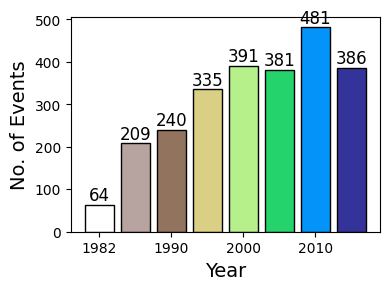

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
file_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data = pd.read_excel(file_path)
data['Year'] = pd.DatetimeIndex(data['Date']).year
bounds = [1982, 1985, 1990, 1995, 2000, 2005, 2010, 2015, 2019]
labels = ['1982', '1985', '1990', '1995', '2000', '2005', '2010', '2015']  # Only the starting years
data['Time Division'] = pd.cut(data['Year'], bins=bounds, labels=labels, right=False)
event_counts = data.groupby('Time Division')['Event ID'].nunique()
cmap = plt.cm.terrain_r
cmap = mcolors.ListedColormap(cmap(np.linspace(0, 1, len(bounds) - 1)))
fig, ax = plt.subplots(figsize=(5, 4))  # Small plot size
bar_colors = [cmap(i / (len(bounds) - 2)) for i in range(len(bounds) - 1)]
ax.bar(labels, event_counts.reindex(labels, fill_value=0), color=bar_colors, edgecolor='black')
ax.set_ylabel("No. of Events", fontsize=14)
ax.set_xlabel("Year", fontsize=14)
ax.set_xticks(['1982', '1990', '2000', '2010'])
for i, count in enumerate(event_counts.reindex(labels, fill_value=0)):
    if labels[i] in ['1982', '1985', '1990', '1995', '2000', '2005', '2010', '2015']:  # Annotate only for selected labels
        ax.text(i, count + 0.2, str(int(count)), ha='center', va='bottom', fontsize=14)
plt.tight_layout()
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Small_Barplot_SelectedLabels.png"
plt.savefig(output_path, dpi=600, bbox_inches='tight', transparent=True)
plt.show()

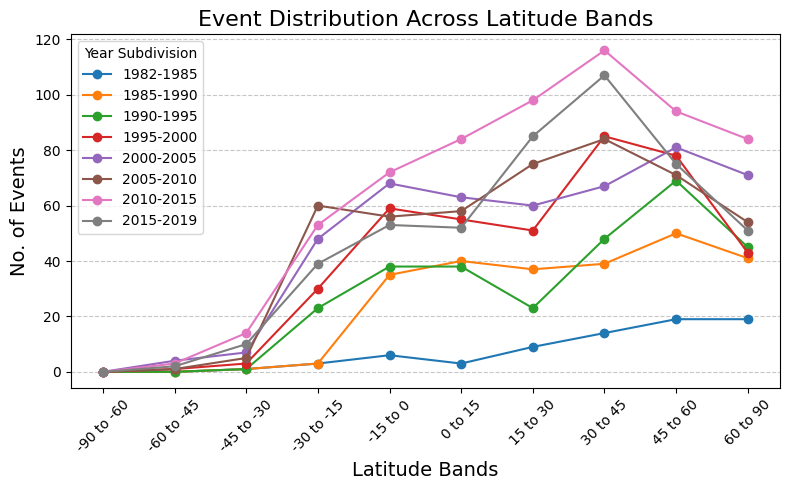

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
file_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data = pd.read_excel(file_path)
data['Year'] = pd.DatetimeIndex(data['Date']).year
year_bounds = [1982, 1985, 1990, 1995, 2000, 2005, 2010, 2015, 2019]
year_labels = ['1982-1985', '1985-1990', '1990-1995', '1995-2000', '2000-2005', '2005-2010', '2010-2015', '2015-2019']
data['Time Division'] = pd.cut(data['Year'], bins=year_bounds, labels=year_labels, right=False)
latitude_bins = [-90, -60, -45, -30, -15, 0, 15, 30, 45, 60, 90]
latitude_labels = ['-90 to -60', '-60 to -45', '-45 to -30', '-30 to -15', '-15 to 0',
                   '0 to 15', '15 to 30', '30 to 45', '45 to 60', '60 to 90']
data['Latitude Band'] = pd.cut(data['Latitude'], bins=latitude_bins, labels=latitude_labels, right=False)
event_counts_latitude = data.groupby(['Time Division', 'Latitude Band'])['Event ID'].nunique().unstack(fill_value=0)
fig, ax = plt.subplots(figsize=(8, 5))
for time_division in year_labels:
    if time_division in event_counts_latitude.index:
        ax.plot(latitude_labels, event_counts_latitude.loc[time_division], marker='o', label=time_division)
ax.set_xlabel("Latitude Bands", fontsize=14)
ax.set_ylabel("No. of Events", fontsize=14)
ax.set_title("Event Distribution Across Latitude Bands", fontsize=16)
ax.legend(title="Year Subdivision", fontsize=10)
ax.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45, fontsize=10)  # Rotate x-axis labels for better visibility
plt.tight_layout()
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Latitude_Variation.png"
plt.savefig(output_path, dpi=600, bbox_inches='tight', transparent=True)
plt.show()

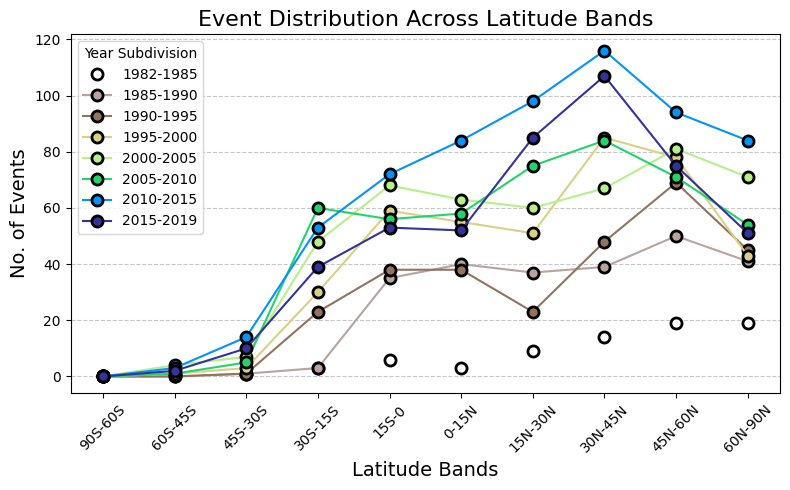

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
file_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data = pd.read_excel(file_path)
data['Year'] = pd.DatetimeIndex(data['Date']).year
year_bounds = [1982, 1985, 1990, 1995, 2000, 2005, 2010, 2015, 2019]
year_labels = ['1982-1985', '1985-1990', '1990-1995', '1995-2000', '2000-2005', '2005-2010', '2010-2015', '2015-2019']
data['Time Division'] = pd.cut(data['Year'], bins=year_bounds, labels=year_labels, right=False)
latitude_bins = [-90, -60, -45, -30, -15, 0, 15, 30, 45, 60, 90]
latitude_labels = ['90S-60S', '60S-45S', '45S-30S', '30S-15S', '15S-0', '0-15N', '15N-30N', '30N-45N', '45N-60N', '60N-90N']
data['Latitude Band'] = pd.cut(data['Latitude'], bins=latitude_bins, labels=latitude_labels, right=False)
event_counts_latitude = data.groupby(['Time Division', 'Latitude Band'])['Event ID'].nunique().unstack(fill_value=0)
cmap = plt.cm.terrain_r
colors = cmap(np.linspace(0, 1, len(year_labels)))
fig, ax = plt.subplots(figsize=(8, 5))

for i, time_division in enumerate(year_labels):
    if time_division in event_counts_latitude.index:
        ax.plot(
            latitude_labels,
            event_counts_latitude.loc[time_division],
            marker='o',
            markersize=8,
            markeredgewidth=2,
            markeredgecolor='black',
            color=colors[i],
            label=time_division
        )
ax.set_xlabel("Latitude Bands", fontsize=14)
ax.set_ylabel("No. of Events", fontsize=14)
ax.set_title("Event Distribution Across Latitude Bands", fontsize=16)
ax.legend(title="Year Subdivision", fontsize=10)
ax.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45, fontsize=10) 
plt.tight_layout()
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Latitude_Variation.png"
plt.savefig(output_path, dpi=600, bbox_inches='tight', transparent=True)
plt.show()

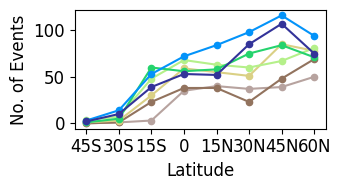

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
file_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data = pd.read_excel(file_path)
data['Year'] = pd.DatetimeIndex(data['Date']).year
year_bounds = [1982, 1985, 1990, 1995, 2000, 2005, 2010, 2015, 2019]
year_labels = ['1982-1985', '1985-1990', '1990-1995', '1995-2000', '2000-2005', '2005-2010', '2010-2015', '2015-2019']
data['Time Division'] = pd.cut(data['Year'], bins=year_bounds, labels=year_labels, right=False)
latitude_bins = [-60, -45, -30, -15, 0, 15, 30, 45, 60,]
latitude_labels = ['45S', '30S', '15S', '0', '15N', '30N', '45N', '60N']
data['Latitude Band'] = pd.cut(data['Latitude'], bins=latitude_bins, labels=latitude_labels, right=False)
event_counts_latitude = data.groupby(['Time Division', 'Latitude Band'])['Event ID'].nunique().unstack(fill_value=0)
cmap = plt.cm.terrain_r
colors = cmap(np.linspace(0, 1, len(year_labels)))
fig, ax = plt.subplots(figsize=(3.5, 2))
for i, time_division in enumerate(year_labels):
    if time_division in event_counts_latitude.index:
        ax.plot(
            latitude_labels,
            event_counts_latitude.loc[time_division],
            marker='o',
            markersize=4.5,  
            color=colors[i],
            label=time_division
        )
ax.set_xlabel("Latitude", fontsize=12)
ax.set_ylabel("No. of Events", fontsize=12)
plt.xticks(fontsize=12) 
plt.yticks(fontsize=12) 
plt.tight_layout()
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Latitude_Variation_Small.png"
plt.savefig(output_path, dpi=600, bbox_inches='tight', transparent=True)
plt.show()

C:\Users\Amitesh\AppData\Local\Temp\ipykernel_15516\1857749085.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data.groupby(["Time Division", "Latitude Band"])["Event ID"]


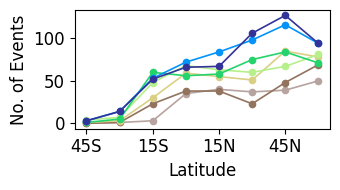

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
file_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data = pd.read_excel(file_path)
data["Date"] = pd.to_datetime(data["Date"], errors="coerce")
data = data.dropna(subset=["Date", "Latitude", "Event ID"])
data["Year"] = data["Date"].dt.year
year_bounds = [1982, 1985, 1990, 1995, 2000, 2005, 2010, 2015, 2020] 
year_labels = [
    "1982-1985", "1985-1990", "1990-1995", "1995-2000",
    "2000-2005", "2005-2010", "2010-2015", "2015-2019"
]
data["Time Division"] = pd.cut(
    data["Year"],
    bins=year_bounds,
    labels=year_labels,
    right=False,
    include_lowest=True
)
latitude_bins = [-60, -45, -30, -15, 0, 15, 30, 45, 60]
latitude_labels = ["45S", "30S", "15S", "0", "15N", "30N", "45N", "60N"]

data["Latitude Band"] = pd.cut(
    data["Latitude"],
    bins=latitude_bins,
    labels=latitude_labels,
    right=False,
    include_lowest=True
)
event_counts_latitude = (
    data.groupby(["Time Division", "Latitude Band"])["Event ID"]
        .nunique()
        .unstack(fill_value=0)
)
event_counts_latitude = event_counts_latitude.reindex(columns=latitude_labels)
fig, ax = plt.subplots(figsize=(3.5, 2))
cmap = plt.cm.terrain_r
colors = cmap(np.linspace(0, 1, len(year_labels)))
for i, td in enumerate(year_labels):
    if td in event_counts_latitude.index:
        ax.plot(
            np.arange(len(latitude_labels)),                 
            event_counts_latitude.loc[td].values,            
            marker="o",
            markersize=4.5,
            linewidth=1.2,
            color=colors[i],
            label=td
        )
keep_labels = ["45S", "15S", "15N", "45N"] 
xtick_positions = [latitude_labels.index(lab) for lab in keep_labels]
ax.set_xticks(xtick_positions)
ax.set_xticklabels(keep_labels, fontsize=12)
ax.set_xlabel("Latitude", fontsize=12)
ax.set_ylabel("No. of Events", fontsize=12)
ax.tick_params(axis="y", labelsize=12)
plt.tight_layout()
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Latitude_Variation_Small.png"
plt.savefig(output_path, dpi=600, bbox_inches="tight", transparent=True)
plt.show()

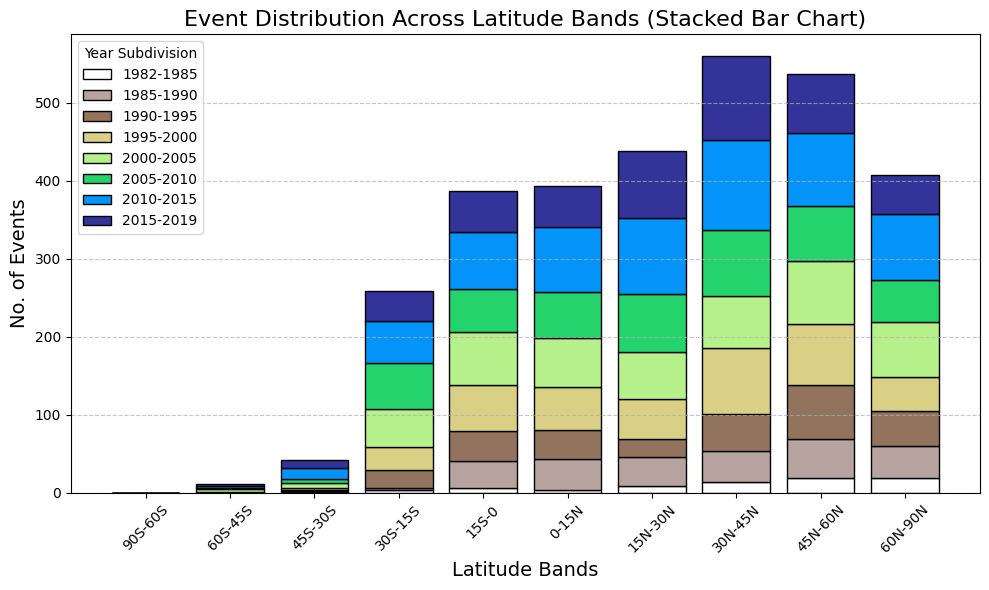

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
file_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data = pd.read_excel(file_path)
data['Year'] = pd.DatetimeIndex(data['Date']).year
year_bounds = [1982, 1985, 1990, 1995, 2000, 2005, 2010, 2015, 2019]
year_labels = ['1982-1985', '1985-1990', '1990-1995', '1995-2000', '2000-2005', '2005-2010', '2010-2015', '2015-2019']
data['Time Division'] = pd.cut(data['Year'], bins=year_bounds, labels=year_labels, right=False)
latitude_bins = [-90, -60, -45, -30, -15, 0, 15, 30, 45, 60, 90]
latitude_labels = ['90S-60S', '60S-45S', '45S-30S', '30S-15S', '15S-0', '0-15N', '15N-30N', '30N-45N', '45N-60N', '60N-90N']
data['Latitude Band'] = pd.cut(data['Latitude'], bins=latitude_bins, labels=latitude_labels, right=False)
event_counts_latitude = data.groupby(['Time Division', 'Latitude Band'])['Event ID'].nunique().unstack(fill_value=0)
cmap = plt.cm.terrain_r
colors = cmap(np.linspace(0, 1, len(year_labels)))
fig, ax = plt.subplots(figsize=(10, 6))
bottom_values = np.zeros(len(latitude_labels)) 
for i, time_division in enumerate(year_labels):
    if time_division in event_counts_latitude.index:
        ax.bar(
            latitude_labels,
            event_counts_latitude.loc[time_division],
            color=colors[i],
            edgecolor='black',
            label=time_division,
            bottom=bottom_values
        )
        bottom_values += event_counts_latitude.loc[time_division]
ax.set_xlabel("Latitude Bands", fontsize=14)
ax.set_ylabel("No. of Events", fontsize=14)
ax.set_title("Event Distribution Across Latitude Bands (Stacked Bar Chart)", fontsize=16)
ax.legend(title="Year Subdivision", fontsize=10)
plt.xticks(rotation=45, fontsize=10) 
ax.grid(axis='y', linestyle='--', alpha=0.7)
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Latitude_StackedBarChart.png"
plt.savefig(output_path, dpi=600, bbox_inches='tight', transparent=True)
plt.show()

Track count data saved successfully!


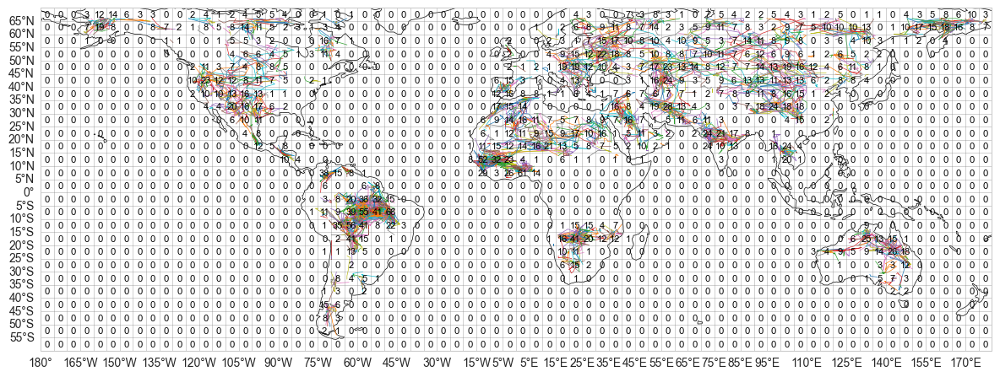

In [188]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
file_path_events = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data_events = pd.read_excel(file_path_events)
data_events['Year'] = pd.DatetimeIndex(data_events['Date']).year
period_data = data_events[(data_events['Year'] >= 2000) & (data_events['Year'] < 2020)]
x_min, x_max, y_min, y_max = -180, 180, -60, 70
grid_size = 5
grid_cells = []
for lon in np.arange(x_min, x_max, grid_size):
    for lat in np.arange(y_min, y_max, grid_size):
        grid_cells.append(Polygon([(lon, lat), (lon + grid_size, lat), (lon + grid_size, lat + grid_size), (lon, lat + grid_size)]))
grid_gdf = gpd.GeoDataFrame({'geometry': grid_cells})
grid_gdf['centroid'] = grid_gdf.centroid
grid_gdf['track_count'] = 0
def date_iter(start_date, end_date):
    current_date = start_date
    while current_date <= end_date:
        yield current_date
        current_date += pd.DateOffset(days=1)
grid_event_dict = {i: set() for i in grid_gdf.index}
for _, event in period_data.iterrows():
    start_date = pd.to_datetime(event['Date'])
    end_date = pd.to_datetime(event['Date'])

    for current_date in date_iter(start_date, end_date):
        point = Point(event['Longitude'], event['Latitude'])
        for i, cell in grid_gdf.iterrows():
            if cell['geometry'].contains(point):
                grid_event_dict[i].add(event['Event ID'])
                break
for i, event_set in grid_event_dict.items():
    grid_gdf.at[i, 'track_count'] = len(event_set)
grid_gdf['centroid_x'] = grid_gdf['centroid'].apply(lambda point: point.x)
grid_gdf['centroid_y'] = grid_gdf['centroid'].apply(lambda point: point.y)
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Track_Count_Grid_5.0_2000-2020.xlsx"
grid_gdf[['centroid_x', 'centroid_y', 'track_count']].to_excel(output_path, index=False)

print('Track count data saved successfully!')
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax.coastlines(resolution='110m', linewidth=0.5)
ax.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
for event_id in period_data['Event ID'].unique():
    event_data = period_data[period_data['Event ID'] == event_id].sort_values(by='Date')
    ax.plot(event_data['Longitude'], event_data['Latitude'], transform=ccrs.Geodetic(), linestyle='-', markersize=2, linewidth=0.5)
for _, row in grid_gdf.iterrows():
    ax.text(row['centroid_x'], row['centroid_y'], str(row['track_count']), transform=ccrs.Geodetic(), fontsize=8, ha='center', va='center', color='black')
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5)
gl.xlocator = plt.MultipleLocator(5)
gl.ylocator = plt.MultipleLocator(5)
gl.top_labels = False
gl.right_labels = False
plt.tight_layout()
plt.savefig(r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Map_2000-2020_with_Track_Counts.png", dpi=600)
plt.show()

Track count data saved successfully!


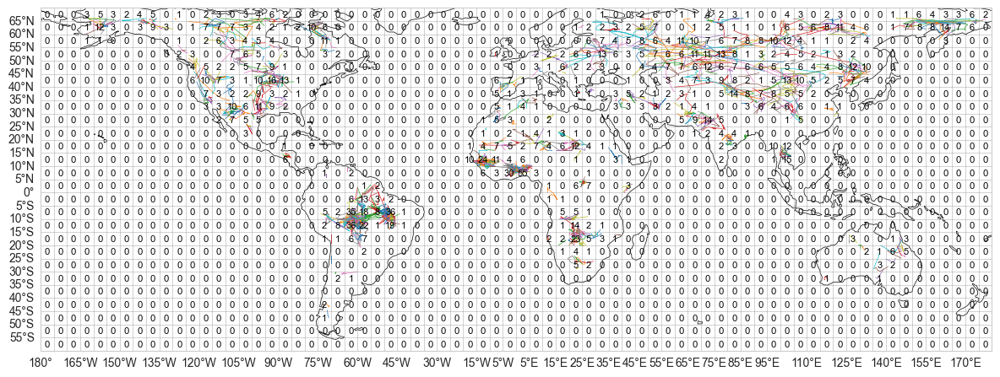

In [189]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
file_path_events = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data_events = pd.read_excel(file_path_events)
data_events['Year'] = pd.DatetimeIndex(data_events['Date']).year
period_data = data_events[(data_events['Year'] >= 1982) & (data_events['Year'] < 2000)]
x_min, x_max, y_min, y_max = -180, 180, -60, 70
grid_size = 5
grid_cells = []
for lon in np.arange(x_min, x_max, grid_size):
    for lat in np.arange(y_min, y_max, grid_size):
        grid_cells.append(Polygon([(lon, lat), (lon + grid_size, lat), (lon + grid_size, lat + grid_size), (lon, lat + grid_size)]))
grid_gdf = gpd.GeoDataFrame({'geometry': grid_cells})
grid_gdf['centroid'] = grid_gdf.centroid
grid_gdf['track_count'] = 0
def date_iter(start_date, end_date):
    current_date = start_date
    while current_date <= end_date:
        yield current_date
        current_date += pd.DateOffset(days=1)
grid_event_dict = {i: set() for i in grid_gdf.index}
for _, event in period_data.iterrows():
    start_date = pd.to_datetime(event['Date'])
    end_date = pd.to_datetime(event['Date'])

    for current_date in date_iter(start_date, end_date):
        point = Point(event['Longitude'], event['Latitude'])
        for i, cell in grid_gdf.iterrows():
            if cell['geometry'].contains(point):
                grid_event_dict[i].add(event['Event ID'])
                break
for i, event_set in grid_event_dict.items():
    grid_gdf.at[i, 'track_count'] = len(event_set)
grid_gdf['centroid_x'] = grid_gdf['centroid'].apply(lambda point: point.x)
grid_gdf['centroid_y'] = grid_gdf['centroid'].apply(lambda point: point.y)
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Track_Count_Grid_5.0_1982-2000.xlsx"
grid_gdf[['centroid_x', 'centroid_y', 'track_count']].to_excel(output_path, index=False)
print('Track count data saved successfully!')
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax.coastlines(resolution='110m', linewidth=0.5)
ax.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
d
for event_id in period_data['Event ID'].unique():
    event_data = period_data[period_data['Event ID'] == event_id].sort_values(by='Date')
    ax.plot(event_data['Longitude'], event_data['Latitude'], transform=ccrs.Geodetic(), linestyle='-', markersize=2, linewidth=0.5)

for _, row in grid_gdf.iterrows():
    ax.text(row['centroid_x'], row['centroid_y'], str(row['track_count']), transform=ccrs.Geodetic(), fontsize=8, ha='center', va='center', color='black')

gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5)
gl.xlocator = plt.MultipleLocator(5)
gl.ylocator = plt.MultipleLocator(5)
gl.top_labels = False
gl.right_labels = False

plt.tight_layout()
plt.savefig(r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Map_1982-2000_with_Track_Counts.png", dpi=600)
plt.show()

Track count data saved successfully!


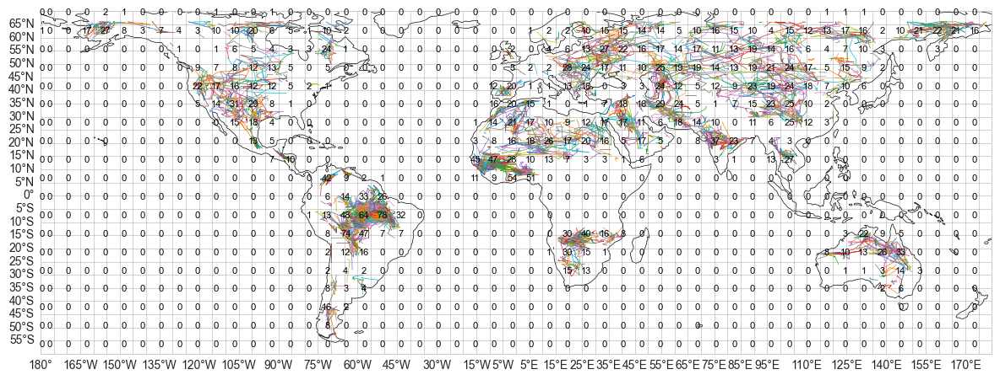

In [190]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
file_path_events = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data_events = pd.read_excel(file_path_events)
data_events['Year'] = pd.DatetimeIndex(data_events['Date']).year
period_data = data_events[(data_events['Year'] >= 2000) & (data_events['Year'] < 2020)]
x_min, x_max, y_min, y_max = -180, 180, -60, 70
grid_size = 7
grid_cells = []
for lon in np.arange(x_min, x_max, grid_size):
    for lat in np.arange(y_min, y_max, grid_size):
        grid_cells.append(Polygon([(lon, lat), (lon + grid_size, lat), (lon + grid_size, lat + grid_size), (lon, lat + grid_size)]))
grid_gdf = gpd.GeoDataFrame({'geometry': grid_cells})
grid_gdf['centroid'] = grid_gdf.centroid
grid_gdf['track_count'] = 0
def date_iter(start_date, end_date):
    current_date = start_date
    while current_date <= end_date:
        yield current_date
        current_date += pd.DateOffset(days=1)l
grid_event_dict = {i: set() for i in grid_gdf.index}
for _, event in period_data.iterrows():
    start_date = pd.to_datetime(event['Date'])
    end_date = pd.to_datetime(event['Date'])

    for current_date in date_iter(start_date, end_date):
        point = Point(event['Longitude'], event['Latitude'])
        for i, cell in grid_gdf.iterrows():
            if cell['geometry'].contains(point):
                grid_event_dict[i].add(event['Event ID'])
                break
for i, event_set in grid_event_dict.items():
    grid_gdf.at[i, 'track_count'] = len(event_set)
grid_gdf['centroid_x'] = grid_gdf['centroid'].apply(lambda point: point.x)
grid_gdf['centroid_y'] = grid_gdf['centroid'].apply(lambda point: point.y)
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Track_Count_Grid_7_2000-2020.xlsx"
grid_gdf[['centroid_x', 'centroid_y', 'track_count']].to_excel(output_path, index=False)
print('Track count data saved successfully!')
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax.coastlines(resolution='110m', linewidth=0.5)
ax.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
for event_id in period_data['Event ID'].unique():
    event_data = period_data[period_data['Event ID'] == event_id].sort_values(by='Date')
    ax.plot(event_data['Longitude'], event_data['Latitude'], transform=ccrs.Geodetic(), linestyle='-', markersize=2, linewidth=0.5)
for _, row in grid_gdf.iterrows():
    ax.text(row['centroid_x'], row['centroid_y'], str(row['track_count']), transform=ccrs.Geodetic(), fontsize=8, ha='center', va='center', color='black')
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5)
gl.xlocator = plt.MultipleLocator(5)
gl.ylocator = plt.MultipleLocator(5)
gl.top_labels = False
gl.right_labels = False
plt.tight_layout()
plt.savefig(r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Map_1980-2000_with_Track_Counts_7.png", dpi=600)
plt.show()

Track count data saved successfully!


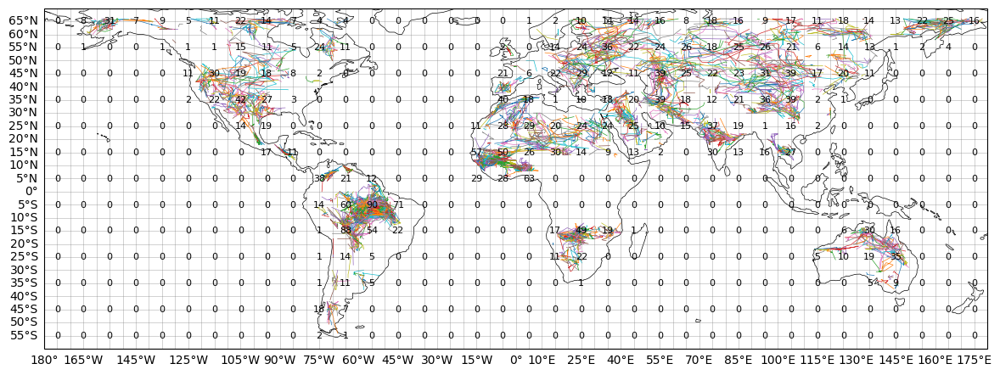

In [11]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
file_path_events = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx"
data_events = pd.read_excel(file_path_events)
data_events['Year'] = pd.DatetimeIndex(data_events['Date']).year
period_data = data_events[(data_events['Year'] >= 2000) & (data_events['Year'] < 2020)]
x_min, x_max, y_min, y_max = -180, 180, -60, 70
grid_size = 10
grid_cells = []
for lon in np.arange(x_min, x_max, grid_size):
    for lat in np.arange(y_min, y_max, grid_size):
        grid_cells.append(Polygon([(lon, lat), (lon + grid_size, lat), (lon + grid_size, lat + grid_size), (lon, lat + grid_size)]))
grid_gdf = gpd.GeoDataFrame({'geometry': grid_cells})
grid_gdf['centroid'] = grid_gdf.centroid
grid_gdf['track_count'] = 0
def date_iter(start_date, end_date):
    current_date = start_date
    while current_date <= end_date:
        yield current_date
        current_date += pd.DateOffset(days=1)
grid_event_dict = {i: set() for i in grid_gdf.index}
for _, event in period_data.iterrows():
    start_date = pd.to_datetime(event['Date'])
    end_date = pd.to_datetime(event['Date'])

    for current_date in date_iter(start_date, end_date):
        point = Point(event['Longitude'], event['Latitude'])
        for i, cell in grid_gdf.iterrows():
            if cell['geometry'].contains(point):
                grid_event_dict[i].add(event['Event ID'])
                break
for i, event_set in grid_event_dict.items():
    grid_gdf.at[i, 'track_count'] = len(event_set)
grid_gdf['centroid_x'] = grid_gdf['centroid'].apply(lambda point: point.x)
grid_gdf['centroid_y'] = grid_gdf['centroid'].apply(lambda point: point.y)
output_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Track_Count_Grid_10_2000-2020.xlsx"
grid_gdf[['centroid_x', 'centroid_y', 'track_count']].to_excel(output_path, index=False)
print('Track count data saved successfully!')
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax.coastlines(resolution='110m', linewidth=0.5)
ax.set_extent([-180, 180, -60, 70], crs=ccrs.PlateCarree())
for event_id in period_data['Event ID'].unique():
    event_data = period_data[period_data['Event ID'] == event_id].sort_values(by='Date')
    ax.plot(event_data['Longitude'], event_data['Latitude'], transform=ccrs.Geodetic(), linestyle='-', markersize=2, linewidth=0.5)
for _, row in grid_gdf.iterrows():
    ax.text(row['centroid_x'], row['centroid_y'], str(row['track_count']), transform=ccrs.Geodetic(), fontsize=8, ha='center', va='center', color='black')
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5)
gl.xlocator = plt.MultipleLocator(5)
gl.ylocator = plt.MultipleLocator(5)
gl.top_labels = False
gl.right_labels = False
plt.tight_layout()
plt.savefig(r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\CDHW_Events_Map_2000-2020_with_Track_Counts_10.png", dpi=600)
plt.show()

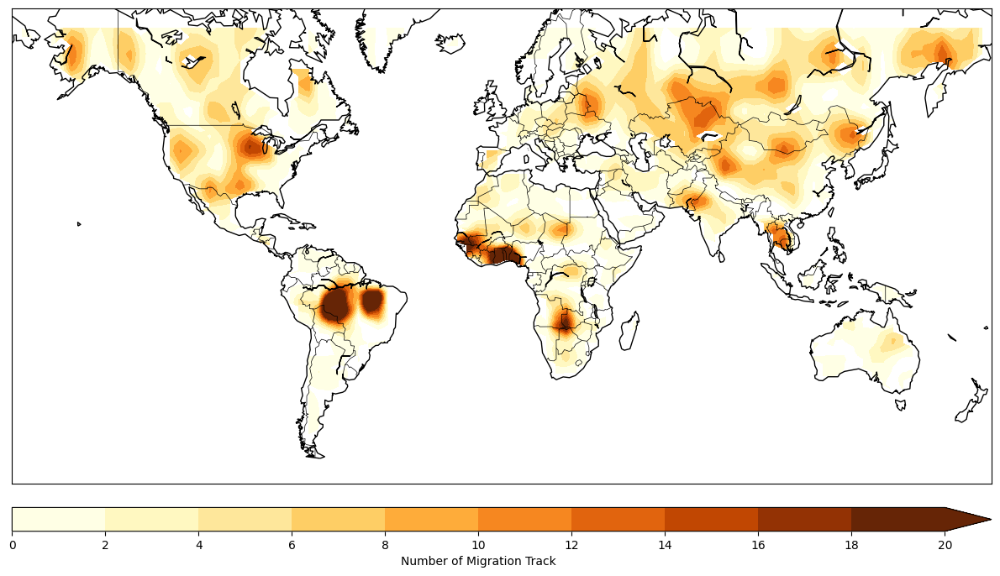

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from scipy.interpolate import griddata
file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000.xlsx'
data = pd.read_excel(file_path)
lon = data['centroid_x'].values
lat = data['centroid_y'].values
track_count = data['track_count'].values
grid_lon = np.linspace(-180, 180, 100)
grid_lat = np.linspace(-60, 70, 100)
grid_lon, grid_lat = np.meshgrid(grid_lon, grid_lat)
linear_interpolated = griddata((lon, lat), track_count, (grid_lon, grid_lat), method='cubic')
plt.figure(figsize=(12, 8))
m = Basemap(projection='merc', llcrnrlat=-60, urcrnrlat=70, llcrnrlon=-180, urcrnrlon=180, resolution='c')
m.drawcoastlines()
m.drawcountries()
x, y = m(grid_lon, grid_lat)
land_mask = np.array([[m.is_land(xi, yi) for xi, yi in zip(x_row, y_row)] for x_row, y_row in zip(x, y)])
linear_interpolated_masked = np.where(land_mask, linear_interpolated, np.nan)
levels = [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20]
cmap = plt.get_cmap('YlOrBr', len(levels) - 1)
cs = m.contourf(x, y, np.squeeze(linear_interpolated_masked), levels=levels, cmap=cmap, extend='max')
cbar = m.colorbar(cs, location='bottom', pad="5%")
cbar.set_label('Number of Migration Track')
cbar.set_ticks(levels)
cbar.set_ticklabels(['0', '2', '4', '6', '8', '10', '12', '14', '16', '18', '20'])
plt.tight_layout()
plt.savefig(r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\1980-2000_with_Track_Counts.png", dpi=900)
plt.show()

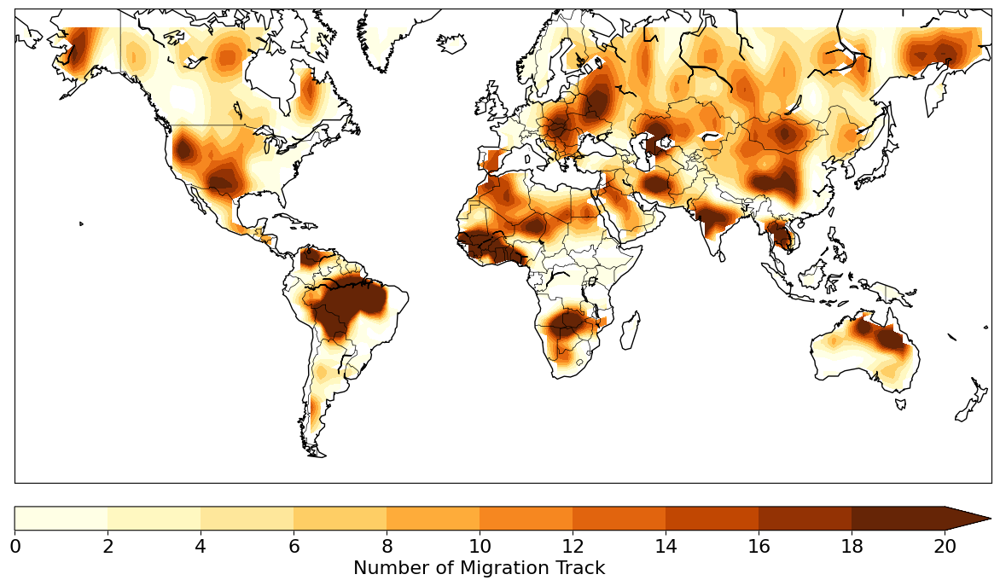

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from scipy.interpolate import griddata
file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020.xlsx'
data = pd.read_excel(file_path)
lon = data['centroid_x'].values
lat = data['centroid_y'].values
track_count = data['track_count'].values
grid_lon = np.linspace(-180, 180, 100)
grid_lat = np.linspace(-60, 70,100)
grid_lon, grid_lat = np.meshgrid(grid_lon, grid_lat)
linear_interpolated = griddata((lon, lat), track_count, (grid_lon, grid_lat), method='cubic')
plt.figure(figsize=(12, 8))
m = Basemap(projection='merc', llcrnrlat=-60, urcrnrlat=70, llcrnrlon=-180, urcrnrlon=180, resolution='c')
m.drawcoastlines()
m.drawcountries()
x, y = m(grid_lon, grid_lat)
land_mask = np.array([[m.is_land(xi, yi) for xi, yi in zip(x_row, y_row)] for x_row, y_row in zip(x, y)])
linear_interpolated_masked = np.where(land_mask, linear_interpolated, np.nan)
levels = [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20]
cmap = plt.get_cmap('YlOrBr', len(levels) - 1)
cs = m.contourf(x, y, np.squeeze(linear_interpolated_masked), levels=levels, cmap=cmap, extend='max')
cbar = m.colorbar(cs, location='bottom', pad="5%")
cbar.set_label('Number of Migration Track')
cbar.set_ticks(levels)
cbar.set_ticklabels(['0', '2', '4', '6', '8', '10', '12', '14', '16', '18', '20'])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig(r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\2000-2020_with_Track_Counts.png", dpi=900)
plt.show()

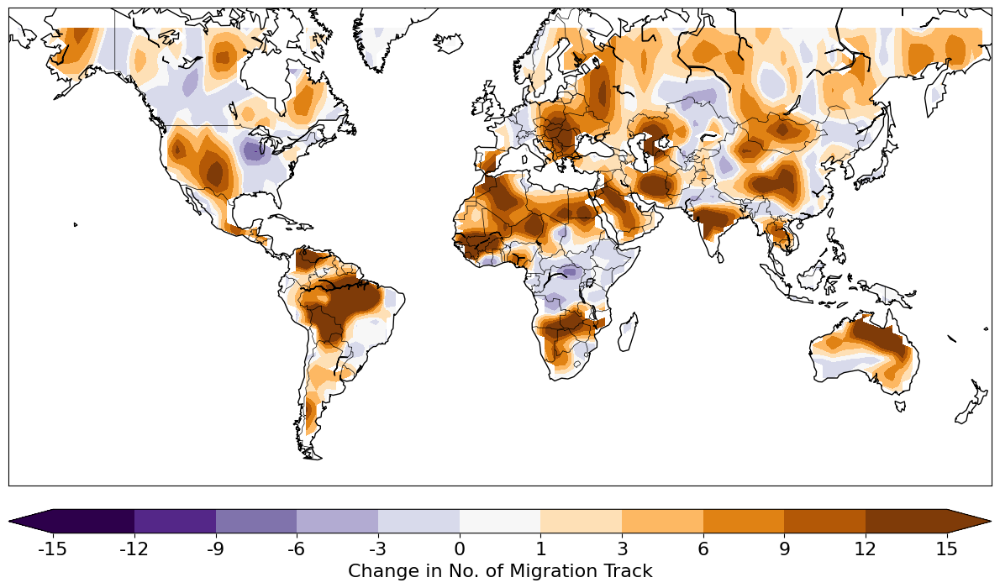

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from scipy.interpolate import griddata
file_path_1980_2000 = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000.xlsx'
file_path_2000_2020 = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020.xlsx'
data_1980_2000 = pd.read_excel(file_path_1980_2000)
data_2000_2020 = pd.read_excel(file_path_2000_2020)
lon_1980_2000 = data_1980_2000['centroid_x'].values
lat_1980_2000 = data_1980_2000['centroid_y'].values
track_count_1980_2000 = data_1980_2000['track_count'].values
lon_2000_2020 = data_2000_2020['centroid_x'].values
lat_2000_2020 = data_2000_2020['centroid_y'].values
track_count_2000_2020 = data_2000_2020['track_count'].values
grid_lon = np.linspace(-180, 180, 100)
grid_lat = np.linspace(-60, 70, 100)
grid_lon, grid_lat = np.meshgrid(grid_lon, grid_lat)
interp_1980_2000 = griddata((lon_1980_2000, lat_1980_2000), track_count_1980_2000, (grid_lon, grid_lat), method='cubic')
interp_2000_2020 = griddata((lon_2000_2020, lat_2000_2020), track_count_2000_2020, (grid_lon, grid_lat), method='cubic')
difference = interp_2000_2020 - interp_1980_2000
plt.figure(figsize=(12, 8))
m = Basemap(projection='merc', llcrnrlat=-60, urcrnrlat=70, llcrnrlon=-180, urcrnrlon=180, resolution='c')
m.drawcoastlines()
m.drawcountries()
x, y = m(grid_lon, grid_lat)
land_mask = np.array([[m.is_land(xi, yi) for xi, yi in zip(x_row, y_row)] for x_row, y_row in zip(x, y)])
difference_masked = np.where(land_mask, difference, np.nan)
levels = np.concatenate([np.linspace(-15, 0, 6, dtype=int), np.linspace(1, 15, 6, dtype=int)])  # Whole numbers only
cmap = plt.get_cmap('PuOr_r', len(levels) - 1)
cs = m.contourf(x, y, np.squeeze(difference_masked), levels=levels, cmap=cmap, extend='both')
cbar = m.colorbar(cs, location='bottom', pad="5%")
cbar.set_label('Change in No. of Migration Track', fontsize=16)
cbar.set_ticks(levels)
cbar.ax.tick_params(labelsize=16)  
cbar.ax.set_xticklabels([f'{int(tick)}' for tick in levels])
plt.tick_params(labelsize=16)
plt.tight_layout()
plt.savefig(r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\Difference_Asymmetric_PuOr_WholeNumbers_Label16.png", dpi=900)
plt.show()

In [1]:
import pandas as pd
import numpy as np
from scipy.interpolate import griddata
from mpl_toolkits.basemap import Basemap
file_path_1980_2000 = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Track_Count_Grid_5.0_1980-2000.xlsx'
file_path_2000_2020 = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Track_Count_Grid_5.0_2000-2020.xlsx'
output_excel_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change.xlsx'
data_1980_2000 = pd.read_excel(file_path_1980_2000)
data_2000_2020 = pd.read_excel(file_path_2000_2020)
lon_1980_2000 = data_1980_2000['centroid_x'].values
lat_1980_2000 = data_1980_2000['centroid_y'].values
track_count_1980_2000 = data_1980_2000['track_count'].values
lon_2000_2020 = data_2000_2020['centroid_x'].values
lat_2000_2020 = data_2000_2020['centroid_y'].values
track_count_2000_2020 = data_2000_2020['track_count'].values
grid_lon = np.linspace(-180, 180, 100)
grid_lat = np.linspace(-60, 70, 100)
grid_lon, grid_lat = np.meshgrid(grid_lon, grid_lat)
interp_1980_2000 = griddata((lon_1980_2000, lat_1980_2000), track_count_1980_2000, (grid_lon, grid_lat), method='cubic')
interp_2000_2020 = griddata((lon_2000_2020, lat_2000_2020), track_count_2000_2020, (grid_lon, grid_lat), method='cubic')
difference = interp_2000_2020 - interp_1980_2000
m = Basemap(projection='merc', llcrnrlat=-60, urcrnrlat=70, llcrnrlon=-180, urcrnrlon=180, resolution='c')
x, y = m(grid_lon, grid_lat)
land_mask = np.array([[m.is_land(xi, yi) for xi, yi in zip(x_row, y_row)] for x_row, y_row in zip(x, y)])
difference_masked = np.where(land_mask, difference, np.nan)
df_output = pd.DataFrame({
    'Longitude': grid_lon.ravel(),
    'Latitude': grid_lat.ravel(),
    'Migration_Change': difference_masked.ravel()
})
df_output.to_excel(output_excel_path, index=False)

In [2]:
import pandas as pd
import rasterio
migration_change_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change.xlsx'
aridity_raster_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Data\Aridity\Global-AI_ET0_v3_annual\ai_v3_yr.tif'
output_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_With_Aridity.xlsx'
df_migration = pd.read_excel(migration_change_file)
with rasterio.open(aridity_raster_file) as src:
    coords = [(x, y) for x, y in zip(df_migration['Longitude'], df_migration['Latitude'])]
    ai_values = [float(val[0]) * 0.0001 for val in src.sample(coords)] 
def classify_aridity(ai_value):
    if ai_value < 0.2:
        return "Arid"
    elif 0.2 <= ai_value <= 0.5:
        return "Semi-Arid"
    else:
        return "Humid"
df_migration["AI_Value"] = ai_values  
df_migration["Aridity Class"] = df_migration["AI_Value"].apply(classify_aridity)
df_migration.to_excel(output_file, index=False)
print("Updated file saved with Three-Class Aridity Classification!")

Updated file saved with Three-Class Aridity Classification!


In [3]:
import pandas as pd
import geopandas as gpd
import glob
migration_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_With_Aridity.xlsx'
continent_folder = r'D:\PhD_Research\Paper-3_CHDW_Migration\Data\World_Continents'
output_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_LandOnly.xlsx'
df_migration = pd.read_excel(migration_file)
gdf_migration = gpd.GeoDataFrame(df_migration, geometry=gpd.points_from_xy(df_migration['Longitude'], df_migration['Latitude']), crs="EPSG:4326")
continent_files = glob.glob(continent_folder + "/*.shp") 
gdf_continents = gpd.GeoDataFrame()
for shp in continent_files:
    continent_name = shp.split("\\")[-1].replace(".shp", "")  
    gdf = gpd.read_file(shp)
    gdf["Continent"] = continent_name  
    gdf_continents = pd.concat([gdf_continents, gdf], ignore_index=True)
gdf_land_points = gpd.sjoin(gdf_migration, gdf_continents[['geometry', 'Continent']], how="inner", predicate="intersects")
gdf_land_points = gdf_land_points[df_migration.columns.tolist() + ['Continent']]  
gdf_land_points.to_excel(output_file, index=False)
print(f"Filtered land points with continent names saved to: {output_file}")

Filtered land points with continent names saved to: D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_LandOnly.xlsx


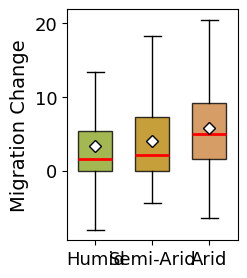

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
migration_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_LandOnly.xlsx'
df = pd.read_excel(migration_file)
colors = {'Humid': (0.55, 0.65, 0.15, 0.8), 
          'Semi-Arid': (0.72, 0.53, 0.04, 0.8),  
          'Arid': (0.80, 0.52, 0.25, 0.8)} 
order = ['Humid', 'Semi-Arid', 'Arid']
data = [df[df['Aridity Class'] == category]['Migration_Change'].dropna() for category in order]
fig, ax = plt.subplots(figsize=(2.2, 3))
box = ax.boxplot(data, patch_artist=True, widths=0.6, showfliers=False, showmeans=True, 
                 meanprops={"marker": "D", "markerfacecolor": "white", "markeredgecolor": "black", "markersize": 6})  
for patch, category in zip(box['boxes'], order):
    patch.set_facecolor(colors[category]) 
    patch.set_edgecolor("black")  
    patch.set_alpha(0.8)  
for median in box['medians']:
    median.set(color='red', linewidth=2)
for mean in box['means']:
    mean.set(marker='D', markerfacecolor='white', markeredgecolor='black', markersize=6)  # Diamond shape
ax.set_xticks([1, 2, 3])
ax.set_xticklabels(order, fontsize=13)
ax.tick_params(axis='both', which='major', labelsize=13)
ax.set_ylabel("Migration Change", fontsize=14)
plt.savefig(r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\Migration_Change_BoxPlot_Transparent.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

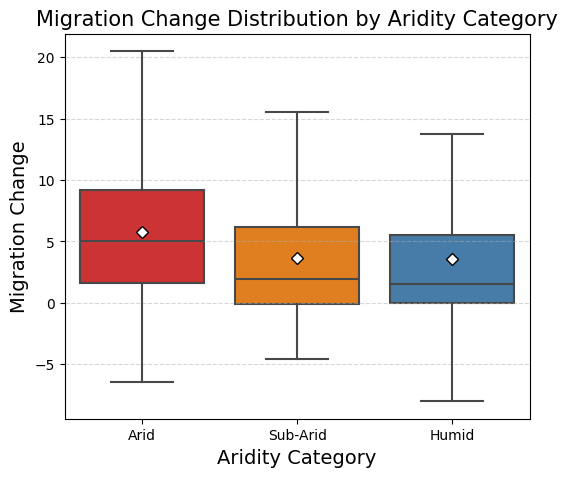

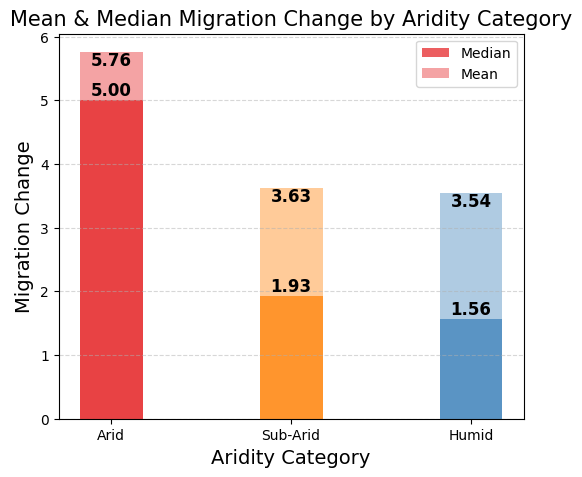

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
migration_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_LandOnly.xlsx'
df = pd.read_excel(migration_file)
bins = [0, 0.2, 0.65, float('inf')]
labels = ['Arid', 'Sub-Arid', 'Humid']
df['Aridity_Category'] = pd.cut(df['AI_Value'], bins=bins, labels=labels, include_lowest=True)
median_values = df.groupby('Aridity_Category')['Migration_Change'].median()
mean_values = df.groupby('Aridity_Category')['Migration_Change'].mean()
colors = {'Arid': '#e41a1c', 'Sub-Arid': '#ff7f00', 'Humid': '#377eb8'}
plt.figure(figsize=(6, 5))
sns.boxplot(x=df['Aridity_Category'], y=df['Migration_Change'], palette=colors, showfliers=False, showmeans=True,
            meanprops={"marker": "D", "markerfacecolor": "white", "markeredgecolor": "black", "markersize": 6})
plt.xlabel("Aridity Category", fontsize=14)
plt.ylabel("Migration Change", fontsize=14)
plt.title("Migration Change Distribution by Aridity Category", fontsize=15)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.savefig(r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\Migration_Change_BoxPlot_Aridity.png', 
            dpi=300, bbox_inches='tight', transparent=True)
plt.show()
plt.figure(figsize=(6, 5))
bar_width = 0.35
x_labels = median_values.index
bars1 = plt.bar(x_labels, median_values.values, width=bar_width, color=[colors[c] for c in x_labels], alpha=0.7, label='Median')
bars2 = plt.bar(x_labels, mean_values.values, width=bar_width, color=[colors[c] for c in x_labels], alpha=0.4, label='Mean')
for bar, value in zip(bars1, median_values.values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f'{value:.2f}', 
             ha='center', va='bottom', fontsize=12, fontweight='bold')

for bar, value in zip(bars2, mean_values.values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f'{value:.2f}', 
             ha='center', va='top', fontsize=12, fontweight='bold')
plt.xlabel("Aridity Category", fontsize=14)
plt.ylabel("Migration Change", fontsize=14)
plt.title("Mean & Median Migration Change by Aridity Category", fontsize=15)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.savefig(r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\Migration_Change_BarPlot_Aridity.png', 
            dpi=300, bbox_inches='tight', transparent=True)
plt.show()

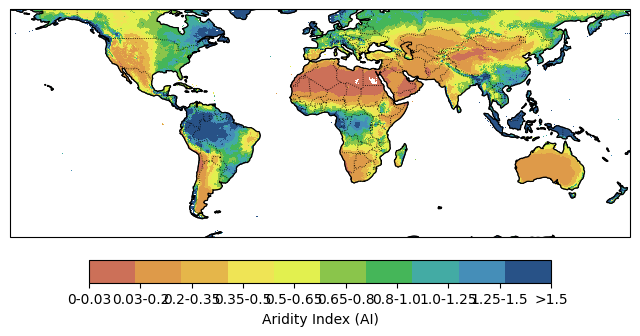

In [14]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import cartopy.crs as ccrs
import cartopy.feature as cfeature
aridity_raster_file = r"D:\PhD_Research\Paper-3_CHDW_Migration\Data\Aridity\Global-AI_ET0_v3_annual\ai_v3_yr.tif"
with rasterio.open(aridity_raster_file) as src:
    downsample_factor = 10
    aridity_data = src.read(1, out_shape=(src.height // downsample_factor, src.width // downsample_factor))
    aridity_data = aridity_data * 0.0001
    lon = np.linspace(src.bounds.left, src.bounds.right, aridity_data.shape[1])
    lat = np.linspace(src.bounds.top, src.bounds.bottom, aridity_data.shape[0])  # Top to Bottom
bins = [0, 0.03, 0.2, 0.35, 0.5, 0.65, 0.8, 1.0, 1.25, 1.5, float('inf')]
colors = ['#cc7058', '#de9a49', '#e5b64a', '#efe455', '#e2f04f', 
          '#8ac54b', '#45b659', '#43aba4', '#458eb8', '#285287']
labels = ['0-0.03', '0.03-0.2', '0.2-0.35', '0.35-0.5', '0.5-0.65', 
          '0.65-0.8', '0.8-1.0', '1.0-1.25', '1.25-1.5', '>1.5']
aridity_classified = np.digitize(aridity_data, bins) - 1  # Assigns each pixel to a category
aridity_classified = aridity_classified.astype(float)
ocean_mask = aridity_data < 0.000000000000000000000000001
aridity_classified[ocean_mask] = np.nan  
lat_mask = (lat >= -66) & (lat <= 66)
aridity_classified = aridity_classified[lat_mask, :]
lat = lat[lat_mask] 
fig, ax = plt.subplots(figsize=(8, 6), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([-180, 180, -66, 66], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.6)
ax.add_feature(cfeature.LAND, facecolor='none', edgecolor='black')
cmap = ListedColormap(colors)
im = ax.pcolormesh(lon, lat, aridity_classified, cmap=cmap, transform=ccrs.PlateCarree())
cbar = plt.colorbar(im, orientation='horizontal', fraction=0.05, pad=0.05)
cbar.set_ticks(np.arange(len(labels)))
cbar.set_ticklabels(labels)
cbar.set_label("Aridity Index (AI)")
plt.show()

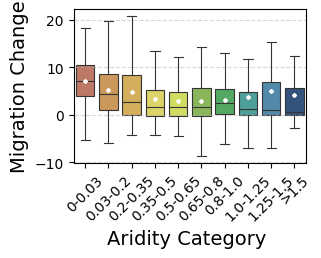

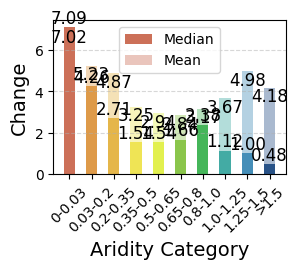

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
migration_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_LandOnly.xlsx'
df = pd.read_excel(migration_file)
bins = [0, 0.03, 0.2, 0.35, 0.5, 0.65, 0.8, 1.0, 1.25, 1.5, float('inf')]
labels = ['0-0.03', '0.03-0.2', '0.2-0.35', '0.35-0.5', '0.5-0.65', 
          '0.65-0.8', '0.8-1.0', '1.0-1.25', '1.25-1.5', '>1.5']
df['Aridity_Category'] = pd.cut(df['AI_Value'], bins=bins, labels=labels, include_lowest=True)
median_values = df.groupby('Aridity_Category')['Migration_Change'].median()
mean_values = df.groupby('Aridity_Category')['Migration_Change'].mean()
colors = ['#cc7058', '#de9a49', '#e5b64a', '#efe455', '#e2f04f', 
          '#8ac54b', '#45b659', '#43aba4', '#458eb8', '#285287']
plt.figure(figsize=(3, 2))
sns.boxplot(x=df['Aridity_Category'], y=df['Migration_Change'], palette=colors, showfliers=False, showmeans=True,
            meanprops={"marker": "D", "markerfacecolor": "white", "markeredgecolor": "white", "markersize": 2},
            linewidth=0.8)
plt.xlabel("Aridity Category ", fontsize=14)
plt.ylabel("Migration Change", fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.savefig(r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\Migration_Change_BoxPlot_Aridity_10_Categories.png', 
            dpi=300, bbox_inches='tight', transparent=True)
plt.show()
plt.figure(figsize=(3, 2))
bar_width = 0.5
x_labels = median_values.index
bars1 = plt.bar(x_labels, median_values.values, width=bar_width, color=colors, alpha=1, label='Median')
bars2 = plt.bar(x_labels, mean_values.values, width=bar_width, color=colors, alpha=0.4, label='Mean')
for bar, value in zip(bars1, median_values.values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f'{value:.2f}', 
             ha='center', va='bottom', fontsize=12)

for bar, value in zip(bars2, mean_values.values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f'{value:.2f}', 
             ha='center', va='top', fontsize=12)
plt.xlabel("Aridity Category", fontsize=14)
plt.ylabel("Change", fontsize=14)
plt.xticks(rotation=45)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.savefig(r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\Migration_Change_BarPlot_Aridity_10_Categories.png', 
            dpi=300, bbox_inches='tight', transparent=True)
plt.show()

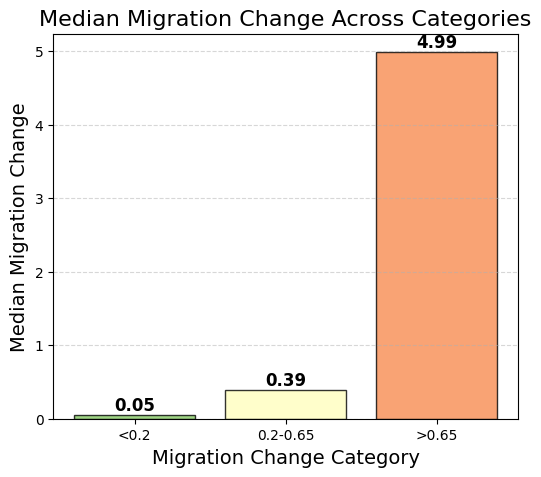

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
migration_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_LandOnly.xlsx'
df = pd.read_excel(migration_file)
intervals = [0, 0.2, 0.65, float('inf')]
labels = ['<0.2', '0.2-0.65', '>0.65']
df['Category'] = pd.cut(df['Migration_Change'], bins=intervals, labels=labels, include_lowest=True)
median_values = df.groupby('Category')['Migration_Change'].median()
colors = sns.color_palette("RdYlGn_r", len(median_values))
plt.figure(figsize=(6, 5))
bars = plt.bar(median_values.index, median_values.values, color=[(*c, 0.7) for c in colors], edgecolor='black', alpha=0.8)
for bar, value in zip(bars, median_values.values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f'{value:.2f}', 
             ha='center', va='bottom', fontsize=12, fontweight='bold')
plt.xlabel("Migration Change Category", fontsize=14)
plt.ylabel("Median Migration Change", fontsize=14)
plt.title("Median Migration Change Across Categories", fontsize=16)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.savefig(r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\Migration_Change_BarPlot_Three_Categories.png', 
            dpi=300, bbox_inches='tight', transparent=True)
plt.show()

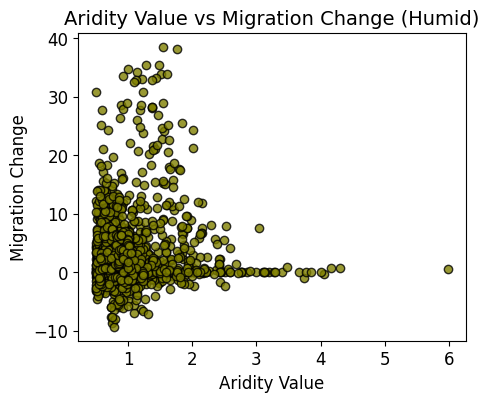

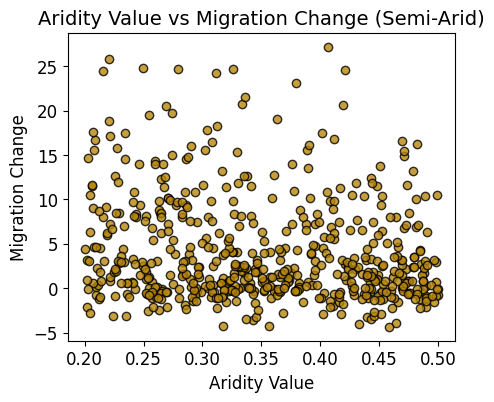

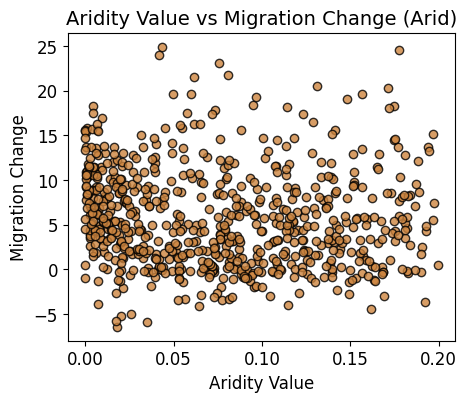

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
migration_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_LandOnly.xlsx'
df = pd.read_excel(migration_file)
colors = {'Humid': 'olive', 'Semi-Arid': 'darkgoldenrod', 'Arid': 'peru'}
for category in ['Humid', 'Semi-Arid', 'Arid']:
    df_filtered = df[df['Aridity Class'] == category]
    fig, ax = plt.subplots(figsize=(5, 4), facecolor='none')
    ax.scatter(df_filtered['AI_Value'], df_filtered['Migration_Change'], 
               color=colors[category], alpha=0.8, edgecolors='black')
    ax.set_title(f"Aridity Value vs Migration Change ({category})", fontsize=14)
    ax.set_xlabel("Aridity Value", fontsize=12)
    ax.set_ylabel("Migration Change", fontsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12)
    plt.savefig(fr'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Scatter_{category}_Aridity_Migration.png', 
                dpi=300, bbox_inches='tight', transparent=True)
    plt.show()

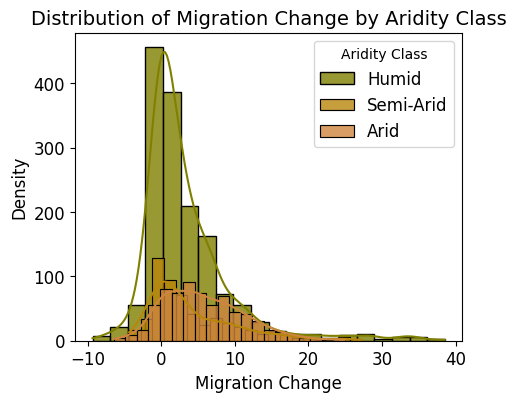

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
migration_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_LandOnly.xlsx'
df = pd.read_excel(migration_file)
colors = {'Humid': 'olive', 'Semi-Arid': 'darkgoldenrod', 'Arid': 'peru'}
fig, ax = plt.subplots(figsize=(5, 4), facecolor='none')
for category in ['Humid', 'Semi-Arid', 'Arid']:
    sns.histplot(df[df['Aridity Class'] == category]['Migration_Change'], 
                 kde=True, bins=20, color=colors[category], label=category, alpha=0.8, ax=ax)
ax.set_title("Distribution of Migration Change by Aridity Class", fontsize=14)
ax.set_xlabel("Migration Change", fontsize=12)
ax.set_ylabel("Density", fontsize=12)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.legend(title="Aridity Class", fontsize=12)
plt.savefig(r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Histogram_Migration_Change_Aridity.png', 
            dpi=300, bbox_inches='tight', transparent=True)
plt.show()

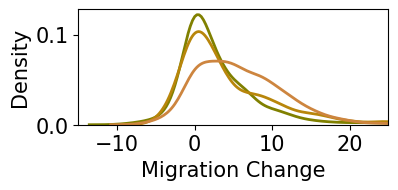

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
migration_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_LandOnly.xlsx'
df = pd.read_excel(migration_file)
colors = {'Humid': 'olive', 'Semi-Arid': 'darkgoldenrod', 'Arid': 'peru'}
fig, ax = plt.subplots(figsize=(4, 1.5), facecolor='none')
for category in ['Humid', 'Semi-Arid', 'Arid']:
    sns.kdeplot(df[df['Aridity Class'] == category]['Migration_Change'], 
                color=colors[category], label=category, linewidth=2)
ax.set_xlim(-15, 25)
ax.set_xlabel("Migration Change", fontsize=15)
ax.set_ylabel("Density", fontsize=15)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.savefig(r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\KDE_Migration_Change_Aridity.png', 
            dpi=300, bbox_inches='tight', transparent=True)
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
migration_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_LandOnly.xlsx'
df = pd.read_excel(migration_file)
colors = {'Humid': 'olive', 'Semi-Arid': 'darkgoldenrod', 'Arid': 'peru'}
fig, ax = plt.subplots(figsize=(4, 1.5), facecolor='none')
for category in ['Humid', 'Semi-Arid', 'Arid']:
    sns.kdeplot(df[df['Aridity Class'] == category]['Migration_Change'], 
                color=colors[category], label=category, linewidth=2, bw_adjust=0.7)  # Adjust bandwidth
ax.set_xlim(-15, 25)
ax.set_xlabel("Migration Change", fontsize=15)
ax.set_ylabel("Density", fontsize=15)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.savefig(r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\KDE_Migration_Change_Aridity.png', 
            dpi=300, bbox_inches='tight', transparent=True)
plt.show()

In [66]:
import numpy as np
import pandas as pd
migration_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_LandOnly.xlsx'
df = pd.read_excel(migration_file)
def optimal_bandwidth(data):
    sigma = np.std(data, ddof=1)
    iqr = np.percentile(data, 75) - np.percentile(data, 25)
    n = len(data)
    return 0.9 * min(sigma, iqr / 1.34) * n**(-1/5)
for category in ['Humid', 'Semi-Arid', 'Arid']:
    subset = df[df['Aridity Class'] == category]['Migration_Change'].dropna()
    if len(subset) > 1:
        bw = optimal_bandwidth(subset)
        print(f"Optimal bandwidth for {category}: {bw:.4f}")

Optimal bandwidth for Humid: 0.8315
Optimal bandwidth for Semi-Arid: 1.3878
Optimal bandwidth for Arid: 1.3193


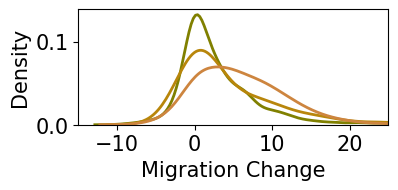

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import gaussian_kde
migration_file = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Migration_Change_LandOnly.xlsx'
df = pd.read_excel(migration_file)
colors = {'Humid': 'olive', 'Semi-Arid': 'darkgoldenrod', 'Arid': 'peru'}
fig, ax = plt.subplots(figsize=(4, 1.5), facecolor='none')
def optimal_bandwidth(data):
    sigma = np.std(data, ddof=1)
    iqr = np.percentile(data, 75) - np.percentile(data, 25)
    n = len(data)
    return 0.9 * min(sigma, iqr / 1.34) * n**(-1/5)  # Silverman's Rule
for category in ['Humid', 'Semi-Arid', 'Arid']:
    subset = df[df['Aridity Class'] == category]['Migration_Change'].dropna()
    if len(subset) > 1: 
        bw = optimal_bandwidth(subset)
        sns.kdeplot(subset, color=colors[category], label=category, linewidth=2, bw_adjust=bw)
ax.set_xlim(-15, 25)
ax.set_xlabel("Migration Change", fontsize=15)
ax.set_ylabel("Density", fontsize=15)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.savefig(r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\KDE_Migration_Change_Aridity.png', 
            dpi=300, bbox_inches='tight', transparent=True)
plt.show()

In [3]:
import pandas as pd
import numpy as np
def print_mean_tracks(file_path, period):
    data = pd.read_excel(file_path)
    cleaned_track_count = data['track_count'].dropna()
    mean_tracks = np.mean(cleaned_track_count)
    print(f"Mean Number of Migration Tracks ({period}): {mean_tracks}")
file_path_1980_2000 = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000.xlsx'
file_path_2000_2020 = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020.xlsx'
print_mean_tracks(file_path_1980_2000, "1980-2000")
print_mean_tracks(file_path_2000_2020, "2000-2020")

Mean Number of Migration Tracks (1980-2000): 1.0368589743589745
Mean Number of Migration Tracks (2000-2020): 2.3205128205128207


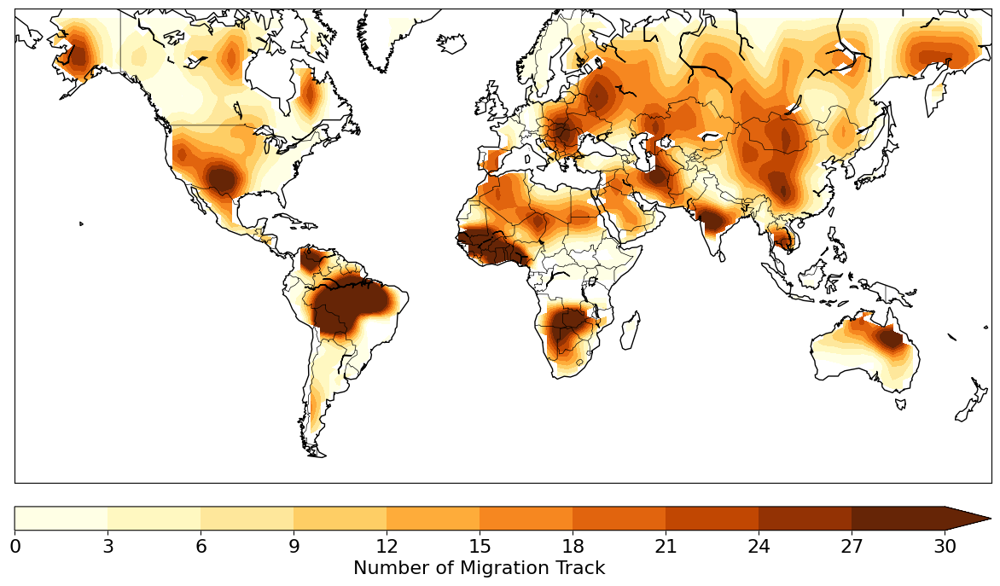

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from scipy.interpolate import griddata
plt.rcParams.update({'font.size': 16})
file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_7_2000-2020.xlsx'
data = pd.read_excel(file_path)
lon = data['centroid_x'].values
lat = data['centroid_y'].values
track_count = data['track_count'].values
grid_lon = np.linspace(-180, 180, 100)
grid_lat = np.linspace(-60, 70, 100)
grid_lon, grid_lat = np.meshgrid(grid_lon, grid_lat)
linear_interpolated = griddata((lon, lat), track_count, (grid_lon, grid_lat), method='cubic')
plt.figure(figsize=(12, 8))
m = Basemap(projection='merc', llcrnrlat=-60, urcrnrlat=70, llcrnrlon=-180, urcrnrlon=180, resolution='c')
m.drawcoastlines()
m.drawcountries()
x, y = m(grid_lon, grid_lat)
land_mask = np.array([[m.is_land(xi, yi) for xi, yi in zip(x_row, y_row)] for x_row, y_row in zip(x, y)])
linear_interpolated_masked = np.where(land_mask, linear_interpolated, np.nan)
levels = [0, 3, 6, 9, 12, 15, 18, 21, 24, 27, 30]
cmap = plt.get_cmap('YlOrBr', len(levels) - 1)
cs = m.contourf(x, y, np.squeeze(linear_interpolated_masked), levels=levels, cmap=cmap, extend='max')
cbar = m.colorbar(cs, location='bottom', pad="5%")
cbar.set_label('Number of Migration Track')
cbar.set_ticks(levels)
cbar.set_ticklabels([str(level) for level in levels])
plt.tight_layout()
plt.savefig(r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\2000-2020_7_with_Track_Counts.png", dpi=600)
plt.show()

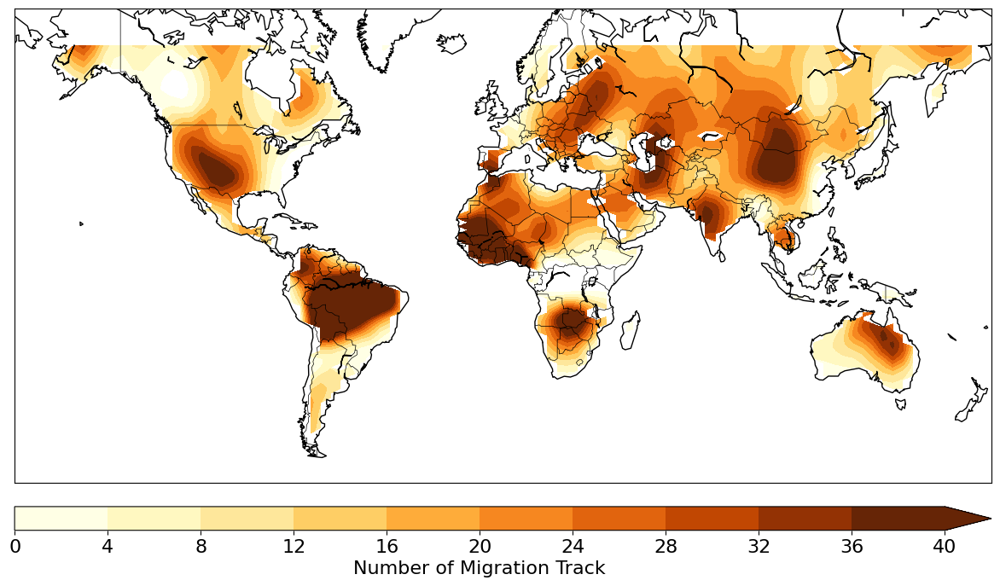

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from scipy.interpolate import griddata
plt.rcParams.update({'font.size': 16})
file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_10_2000-2020.xlsx'
data = pd.read_excel(file_path)
lon = data['centroid_x'].values
lat = data['centroid_y'].values
track_count = data['track_count'].values
grid_lon = np.linspace(-180, 180, 100)
grid_lat = np.linspace(-60, 70, 100)
grid_lon, grid_lat = np.meshgrid(grid_lon, grid_lat)
linear_interpolated = griddata((lon, lat), track_count, (grid_lon, grid_lat), method='cubic')
plt.figure(figsize=(12, 8))
m = Basemap(projection='merc', llcrnrlat=-60, urcrnrlat=70, llcrnrlon=-180, urcrnrlon=180, resolution='c')
m.drawcoastlines()
m.drawcountries()
x, y = m(grid_lon, grid_lat)
land_mask = np.array([[m.is_land(xi, yi) for xi, yi in zip(x_row, y_row)] for x_row, y_row in zip(x, y)])
linear_interpolated_masked = np.where(land_mask, linear_interpolated, np.nan)
levels = [0, 4, 8, 12, 16, 20, 24, 28, 32, 36, 40]
cmap = plt.get_cmap('YlOrBr', len(levels) - 1)
cs = m.contourf(x, y, np.squeeze(linear_interpolated_masked), levels=levels, cmap=cmap, extend='max')
cbar = m.colorbar(cs, location='bottom', pad="5%")
cbar.set_label('Number of Migration Track')
cbar.set_ticks(levels)
cbar.set_ticklabels([str(level) for level in levels])
plt.tight_layout()
plt.savefig(r"D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\2000-2020_with_10_Track_Counts.png", dpi=600)
plt.show()

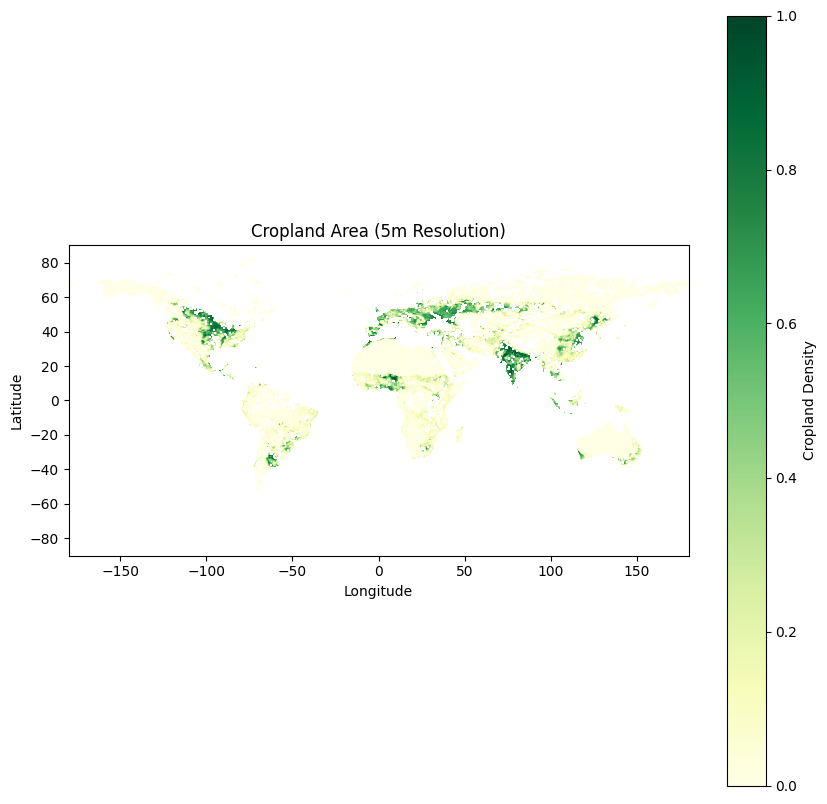

In [70]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\Cropland_Pasture_Area_Geotiff\\CroplandPastureArea2000_Geotiff\\Cropland2000_5m.tif"
with rasterio.open(file_path) as src:
    cropland_data = src.read(1)
    transform = src.transform
    cropland_data = np.ma.masked_equal(cropland_data, src.nodata)
    if cropland_data.max() > 1 or cropland_data.min() < 0:
        cropland_data = (cropland_data - cropland_data.min()) / (cropland_data.max() - cropland_data.min())
plt.figure(figsize=(10, 10))
plt.imshow(cropland_data, cmap='YlGn', extent=(transform[2], transform[2] + transform[0] * cropland_data.shape[1],
                                       transform[5] + transform[4] * cropland_data.shape[0], transform[5]),
           norm=Normalize(vmin=0, vmax=1))
plt.title('Cropland Area (5m Resolution)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='Cropland Density')
plt.show()

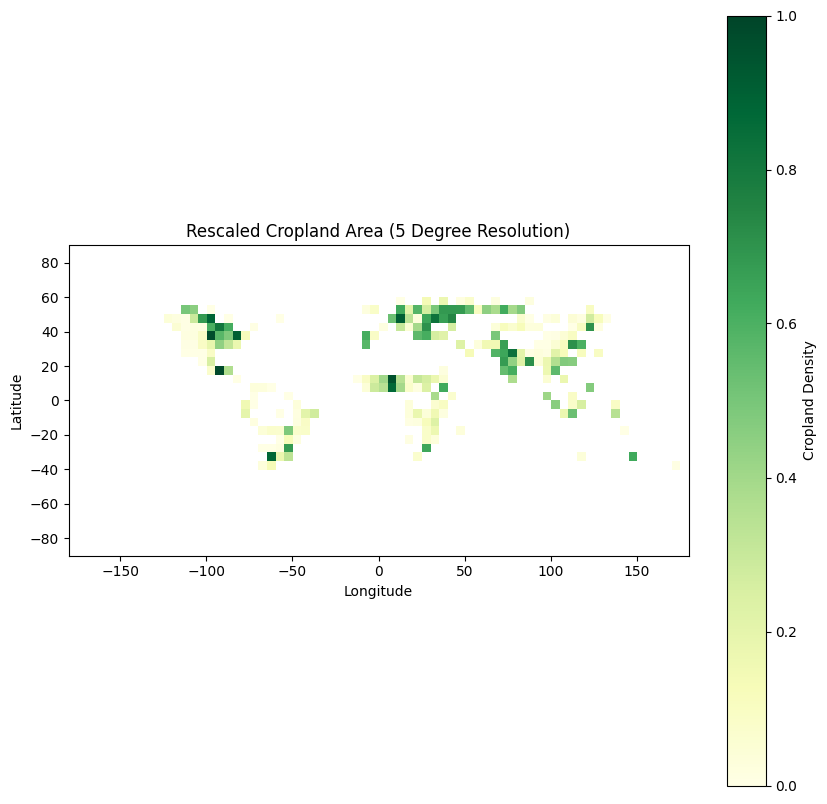

In [71]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy.ndimage import zoom
file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\Cropland_Pasture_Area_Geotiff\\CroplandPastureArea2000_Geotiff\\Cropland2000_5m.tif"
with rasterio.open(file_path) as src:
    cropland_data = src.read(1)
    cropland_data = np.ma.masked_equal(cropland_data, src.nodata))
    if cropland_data.max() > 1 or cropland_data.min() < 0:
        cropland_data = (cropland_data - cropland_data.min()) / (cropland_data.max() - cropland_data.min())
    original_transform = src.transform
    original_width = src.width
    original_height = src.height
land_mask = np.zeros_like(cropland_data)
land_mask[cropland_data > 0] = 1 
cropland_data = np.ma.masked_array(cropland_data, mask=(land_mask == 0))
new_resolution_deg = 5.0
original_resolution_deg = 5.0 / 60.0 
scale_x = new_resolution_deg / original_resolution_deg
scale_y = new_resolution_deg / original_resolution_deg
new_width = int(original_width / scale_x)
new_height = int(original_height / scale_y)
rescaled_data = zoom(cropland_data.filled(0), (new_height / original_height, new_width / original_width), order=1)
rescaled_land_mask = zoom(land_mask, (new_height / original_height, new_width / original_width), order=0)
rescaled_data = np.ma.masked_array(rescaled_data, mask=(rescaled_land_mask == 0))
new_transform = original_transform * original_transform.scale(
    (original_width / new_width), (original_height / new_height))
new_file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\Cropland_Pasture_Area_Geotiff\\CroplandPastureArea2000_Geotiff\\Cropland2000_5deg.tif"
with rasterio.open(
    new_file_path, 'w',
    driver='GTiff',
    height=rescaled_data.shape[0],
    width=rescaled_data.shape[1],
    count=1,
    dtype=rescaled_data.dtype,
    crs=src.crs,
    transform=new_transform,
) as dst:
    dst.write(rescaled_data.filled(src.nodata), 1)
plt.figure(figsize=(10, 10))
plt.imshow(rescaled_data, cmap='YlGn', extent=(new_transform[2], new_transform[2] + new_transform[0] * rescaled_data.shape[1],
                                               new_transform[5] + new_transform[4] * rescaled_data.shape[0], new_transform[5]),
           norm=Normalize(vmin=0, vmax=1))
plt.title('Rescaled Cropland Area (5 Degree Resolution)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='Cropland Density')
plt.show()

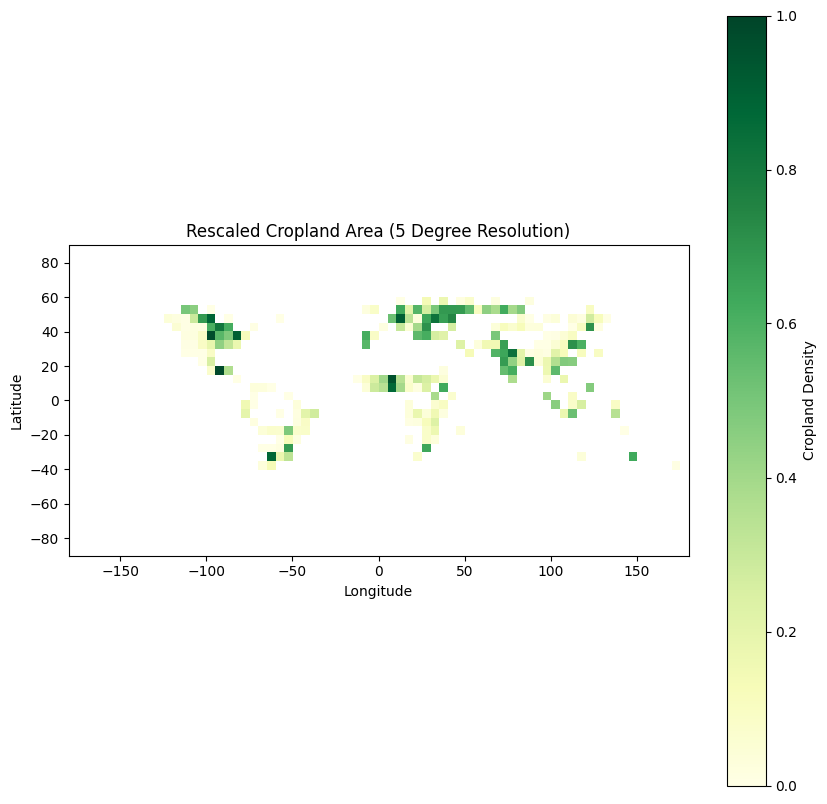

In [72]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy.ndimage import zoom
file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\Cropland_Pasture_Area_Geotiff\\CroplandPastureArea2000_Geotiff\\Cropland2000_5m.tif"
with rasterio.open(file_path) as src:
    cropland_data = src.read(1)
    cropland_data = np.ma.masked_equal(cropland_data, src.nodata)
    if cropland_data.max() > 1 or cropland_data.min() < 0:
        cropland_data = (cropland_data - cropland_data.min()) / (cropland_data.max() - cropland_data.min())
    original_transform = src.transform
    original_width = src.width
    original_height = src.height
land_mask = np.zeros_like(cropland_data, dtype=bool)
land_mask[cropland_data > 0] = True 
cropland_data = np.ma.masked_array(cropland_data, mask=~land_mask)
new_resolution_deg = 5.0
original_resolution_deg = 5.0 / 60.0 
scale_x = new_resolution_deg / original_resolution_deg
scale_y = new_resolution_deg / original_resolution_deg
new_width = int(original_width / scale_x)
new_height = int(original_height / scale_y)
rescaled_data = zoom(cropland_data.filled(0), (new_height / original_height, new_width / original_width), order=1)
rescaled_land_mask = zoom(land_mask.astype(float), (new_height / original_height, new_width / original_width), order=0) > 0.5
rescaled_data = np.ma.masked_array(rescaled_data, mask=~rescaled_land_mask)
new_transform = original_transform * original_transform.scale(
    (original_width / new_width), (original_height / new_height))
new_file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\Cropland_Pasture_Area_Geotiff\\CroplandPastureArea2000_Geotiff\\Cropland2000_5deg.tif"
with rasterio.open(
    new_file_path, 'w',
    driver='GTiff',
    height=rescaled_data.shape[0],
    width=rescaled_data.shape[1],
    count=1,
    dtype=rescaled_data.dtype,
    crs=src.crs,
    transform=new_transform,
) as dst:
    dst.write(rescaled_data.filled(src.nodata), 1)
plt.figure(figsize=(10, 10))
plt.imshow(rescaled_data, cmap='YlGn', extent=(new_transform[2], new_transform[2] + new_transform[0] * rescaled_data.shape[1],
                                               new_transform[5] + new_transform[4] * rescaled_data.shape[0], new_transform[5]),
           norm=Normalize(vmin=0, vmax=1))
plt.title('Rescaled Cropland Area (5 Degree Resolution)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='Cropland Density')
plt.show()

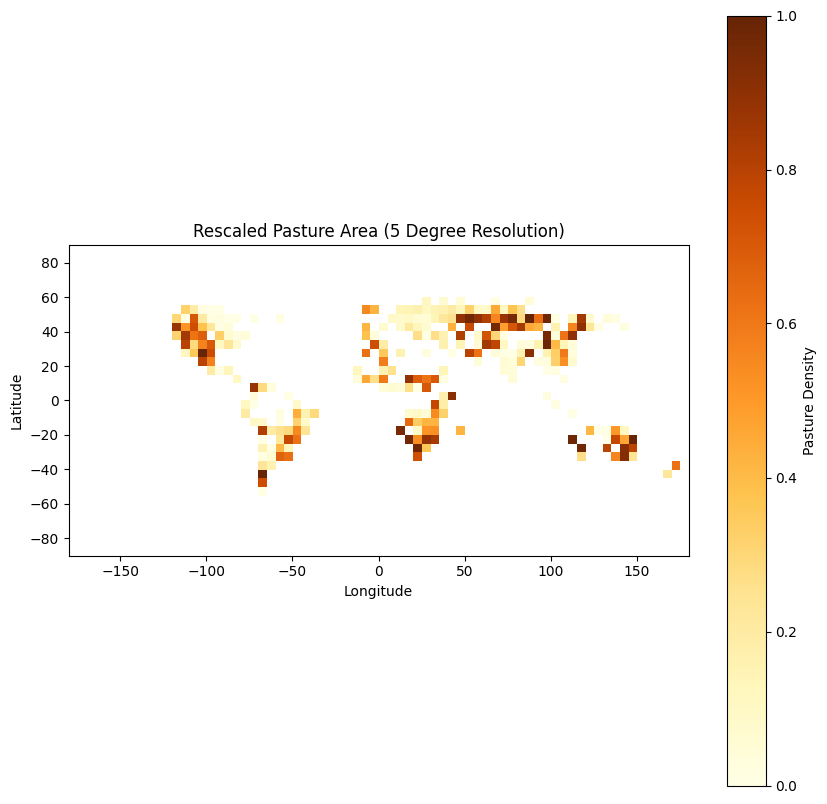

In [22]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy.ndimage import zoom
file_path_pasture = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\Cropland_Pasture_Area_Geotiff\\CroplandPastureArea2000_Geotiff\\Pasture2000_5m.tif"
with rasterio.open(file_path_pasture) as src:
    pasture_data = src.read(1)
    pasture_data = np.ma.masked_equal(pasture_data, src.nodata)
    if pasture_data.max() > 1 or pasture_data.min() < 0:
        pasture_data = (pasture_data - pasture_data.min()) / (pasture_data.max() - pasture_data.min())
    original_transform = src.transform
    original_width = src.width
    original_height = src.height
land_mask = np.zeros_like(pasture_data, dtype=bool)
land_mask[pasture_data > 0] = True  
pasture_data = np.ma.masked_array(pasture_data, mask=~land_mask)
new_resolution_deg = 5.0
original_resolution_deg = 5.0 / 60.0 
scale_x = new_resolution_deg / original_resolution_deg
scale_y = new_resolution_deg / original_resolution_deg
new_width = int(original_width / scale_x)
new_height = int(original_height / scale_y)
rescaled_data = zoom(pasture_data.filled(0), (new_height / original_height, new_width / original_width), order=1)
rescaled_land_mask = zoom(land_mask.astype(float), (new_height / original_height, new_width / original_width), order=0) > 0.5
rescaled_data = np.ma.masked_array(rescaled_data, mask=~rescaled_land_mask)
new_transform = original_transform * original_transform.scale(
    (original_width / new_width), (original_height / new_height))
new_file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\Cropland_Pasture_Area_Geotiff\\CroplandPastureArea2000_Geotiff\\Pasture2000_5deg.tif"
with rasterio.open(
    new_file_path, 'w',
    driver='GTiff',
    height=rescaled_data.shape[0],
    width=rescaled_data.shape[1],
    count=1,
    dtype=rescaled_data.dtype,
    crs=src.crs,
    transform=new_transform,
) as dst:
    dst.write(rescaled_data.filled(src.nodata), 1)
plt.figure(figsize=(10, 10))
plt.imshow(rescaled_data, cmap='YlOrBr', extent=(new_transform[2], new_transform[2] + new_transform[0] * rescaled_data.shape[1],
                                               new_transform[5] + new_transform[4] * rescaled_data.shape[0], new_transform[5]),
           norm=Normalize(vmin=0, vmax=1))
plt.title('Rescaled Pasture Area (5 Degree Resolution)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='Pasture Density')
plt.show()

In [74]:
import pandas as pd
import rasterio
import numpy as np
from openpyxl import load_workbook
excel_file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000.xlsx"
cropland_tif_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\Cropland_Pasture_Area_Geotiff\\CroplandPastureArea2000_Geotiff\\Cropland2000_5deg.tif"
pasture_tif_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\Cropland_Pasture_Area_Geotiff\\CroplandPastureArea2000_Geotiff\\Pasture2000_5deg.tif"
df = pd.read_excel(excel_file_path)
with rasterio.open(cropland_tif_path) as src:
    cropland_data = src.read(1, masked=True)
    cropland_transform = src.transform
    cropland_width = src.width
    cropland_height = src.height
    cropland_data = np.where(cropland_data < -1e38, 0, cropland_data)
with rasterio.open(pasture_tif_path) as src:
    pasture_data = src.read(1, masked=True)
    pasture_transform = src.transform
    pasture_width = src.width
    pasture_height = src.height
    pasture_data = np.where(pasture_data < -1e38, 0, pasture_data)
def get_cropland_value(lon, lat):
    col, row = ~cropland_transform * (lon, lat)
    col, row = int(col), int(row)
    if 0 <= col < cropland_width and 0 <= row < cropland_height:
        return cropland_data[row, col]
    else:
        return np.nan
def get_pasture_value(lon, lat):
    col, row = ~pasture_transform * (lon, lat)
    col, row = int(col), int(row)
    if 0 <= col < pasture_width and 0 <= row < pasture_height:
        return pasture_data[row, col]
    else:
        return np.nan
df['cropland'] = df.apply(lambda row: get_cropland_value(row['centroid_x'], row['centroid_y']), axis=1)
df['pasture'] = df.apply(lambda row: get_pasture_value(row['centroid_x'], row['centroid_y']), axis=1)
output_excel_file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000_with_cropland_pasture.xlsx"
df.to_excel(output_excel_file_path, index=False)
print(f"Updated Excel file saved to {output_excel_file_path}")

Updated Excel file saved to D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Track_Count_Grid_5.0_1980-2000_with_cropland_pasture.xlsx


In [75]:
import pandas as pd
import rasterio
import numpy as np
from openpyxl import load_workbook

excel_file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020.xlsx"
cropland_tif_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\Cropland_Pasture_Area_Geotiff\\CroplandPastureArea2000_Geotiff\\Cropland2000_5deg.tif"
pasture_tif_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\Cropland_Pasture_Area_Geotiff\\CroplandPastureArea2000_Geotiff\\Pasture2000_5deg.tif"
df = pd.read_excel(excel_file_path)
with rasterio.open(cropland_tif_path) as src:
    cropland_data = src.read(1, masked=True)
    cropland_transform = src.transform
    cropland_width = src.width
    cropland_height = src.height
    cropland_data = np.where(cropland_data < -1e38, 0, cropland_data)
with rasterio.open(pasture_tif_path) as src:
    pasture_data = src.read(1, masked=True)
    pasture_transform = src.transform
    pasture_width = src.width
    pasture_height = src.height
    pasture_data = np.where(pasture_data < -1e38, 0, pasture_data)
def get_cropland_value(lon, lat):
    col, row = ~cropland_transform * (lon, lat)
    col, row = int(col), int(row)
    if 0 <= col < cropland_width and 0 <= row < cropland_height:
        return cropland_data[row, col]
    else:
        return np.nan
def get_pasture_value(lon, lat):
    col, row = ~pasture_transform * (lon, lat)
    col, row = int(col), int(row)
    if 0 <= col < pasture_width and 0 <= row < pasture_height:
        return pasture_data[row, col]
    else:
        return np.nan
df['cropland'] = df.apply(lambda row: get_cropland_value(row['centroid_x'], row['centroid_y']), axis=1)
df['pasture'] = df.apply(lambda row: get_pasture_value(row['centroid_x'], row['centroid_y']), axis=1)
output_excel_file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020_with_cropland_pasture.xlsx"
df.to_excel(output_excel_file_path, index=False)
print(f"Updated Excel file saved to {output_excel_file_path}")

Updated Excel file saved to D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Track_Count_Grid_5.0_2000-2020_with_cropland_pasture.xlsx


In [76]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000_with_cropland_pasture.xlsx"
df = pd.read_excel(file_path)
shapefiles = {
    "Africa": "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents\\Africa.shp",
    "Asia": "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents\\Asia.shp",
    "Europe": "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents\\Europe.shp",
    "North America": "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents\\North America.shp",
    "Oceania": "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents\\Oceania.shp",
    "South America": "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents\\South America.shp",
}
continent_gdfs = {name: gpd.read_file(path) for name, path in shapefiles.items()}
eurasia_gdf = gpd.GeoDataFrame(pd.concat([continent_gdfs['Asia'], continent_gdfs['Europe']], ignore_index=True))
continent_gdfs['Eurasia'] = eurasia_gdf
del continent_gdfs['Asia']
del continent_gdfs['Europe']
def get_continent(lon, lat, continent_gdfs):
    point = Point(lon, lat)
    for continent, gdf in continent_gdfs.items():
        if gdf.contains(point).any():
            return continent
    return "Unknown"
df['continent'] = df.apply(lambda row: get_continent(row['centroid_x'], row['centroid_y'], continent_gdfs), axis=1)
output_excel_file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000_with_continent.xlsx"
df.to_excel(output_excel_file_path, index=False)
print(f"Updated Excel file saved to {output_excel_file_path}")

Updated Excel file saved to D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Track_Count_Grid_5.0_1980-2000_with_continent.xlsx


In [77]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020_with_cropland_pasture.xlsx"
df = pd.read_excel(file_path)
shapefiles = {
    "Africa": "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents\\Africa.shp",
    "Asia": "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents\\Asia.shp",
    "Europe": "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents\\Europe.shp",
    "North America": "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents\\North America.shp",
    "Oceania": "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents\\Oceania.shp",
    "South America": "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents\\South America.shp",
}
continent_gdfs = {name: gpd.read_file(path) for name, path in shapefiles.items()}
eurasia_gdf = gpd.GeoDataFrame(pd.concat([continent_gdfs['Asia'], continent_gdfs['Europe']], ignore_index=True))
continent_gdfs['Eurasia'] = eurasia_gdf
del continent_gdfs['Asia']
del continent_gdfs['Europe']
def get_continent(lon, lat, continent_gdfs):
    point = Point(lon, lat)
    for continent, gdf in continent_gdfs.items():
        if gdf.contains(point).any():
            return continent
    return "Unknown"
df['continent'] = df.apply(lambda row: get_continent(row['centroid_x'], row['centroid_y'], continent_gdfs), axis=1)
output_excel_file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020_with_continent.xlsx"
df.to_excel(output_excel_file_path, index=False)
print(f"Updated Excel file saved to {output_excel_file_path}")

Updated Excel file saved to D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Track_Count_Grid_5.0_2000-2020_with_continent.xlsx


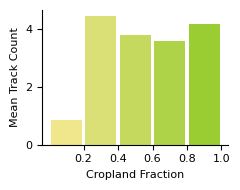

Plot saved to D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\cropland-1.png


In [78]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000_with_cropland_pasture.xlsx"
df = pd.read_excel(file_path)
bins = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
labels = [0.2, 0.4, 0.6, 0.8, 1.0]
df['cropland_bin'] = pd.cut(df['cropland'], bins=bins, labels=labels, include_lowest=True)
mean_track_count = df.groupby('cropland_bin')['track_count'].mean()
cmap = mcolors.LinearSegmentedColormap.from_list("YellowGreen", ["Khaki", "yellowgreen"])
colors = cmap(np.linspace(0, 1, len(mean_track_count)))
plt.figure(figsize=(2.5, 2))
bar_positions = np.array(labels) - 0.05  
bars = plt.bar(bar_positions, mean_track_count, color=colors, width=0.18) 
plt.xlabel('Cropland Fraction', fontsize=8)
plt.ylabel('Mean Track Count', fontsize=8)
plt.xticks(ticks=bar_positions + 0.1, labels=labels, fontsize=8)  # Adjusted to center
plt.yticks(fontsize=8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(True)
plt.gca().spines['bottom'].set_visible(True)
plt.gca().yaxis.tick_left()
plt.gca().xaxis.tick_bottom()
plt.tight_layout()
output_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\cropland-1.png"
plt.savefig(output_path, dpi=300, transparent=True)
plt.show()
print(f"Plot saved to {output_path}")

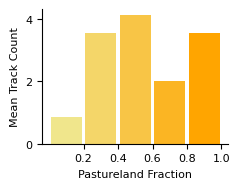

Plot saved to D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\Pasture-2.png


In [79]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000_with_cropland_pasture.xlsx"
df = pd.read_excel(file_path)
bins = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
labels = [0.2, 0.4, 0.6, 0.8, 1.0]
df['pasture_bin'] = pd.cut(df['pasture'], bins=bins, labels=labels, include_lowest=True)
mean_track_count = df.groupby('pasture_bin')['track_count'].mean()
cmap = mcolors.LinearSegmentedColormap.from_list("YellowOrange", ["Khaki", "orange"])
colors = cmap(np.linspace(0, 1, len(mean_track_count)))
plt.figure(figsize=(2.5, 2))
bar_positions = np.array(labels) - 0.05 
bars = plt.bar(bar_positions, mean_track_count, color=colors, width=0.18) 
plt.xlabel('Pastureland Fraction', fontsize=8)
plt.ylabel('Mean Track Count', fontsize=8)
plt.xticks(ticks=bar_positions + 0.1, labels=labels, fontsize=8)
plt.yticks(fontsize=8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(True)
plt.gca().spines['bottom'].set_visible(True)
plt.gca().yaxis.tick_left()
plt.gca().xaxis.tick_bottom()
plt.tight_layout()
output_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\Pasture-2.png"
plt.savefig(output_path, dpi=300, transparent=True)
plt.show()
print(f"Plot saved to {output_path}")

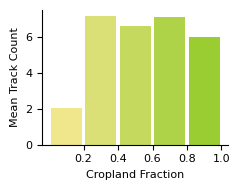

Plot saved to D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\cropland-3.png


In [80]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020_with_cropland_pasture.xlsx"
df = pd.read_excel(file_path)
bins = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
labels = [0.2, 0.4, 0.6, 0.8, 1.0]
df['cropland_bin'] = pd.cut(df['cropland'], bins=bins, labels=labels, include_lowest=True)
mean_track_count = df.groupby('cropland_bin')['track_count'].mean()
cmap = mcolors.LinearSegmentedColormap.from_list("YellowGreen", ["Khaki", "yellowgreen"])
colors = cmap(np.linspace(0, 1, len(mean_track_count)))
plt.figure(figsize=(2.5, 2))
bar_positions = np.array(labels) - 0.05  
bars = plt.bar(bar_positions, mean_track_count, color=colors, width=0.18)  
plt.xlabel('Cropland Fraction', fontsize=8)
plt.ylabel('Mean Track Count', fontsize=8)
plt.xticks(ticks=bar_positions + 0.1, labels=labels, fontsize=8)  
plt.yticks(fontsize=8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(True)
plt.gca().spines['bottom'].set_visible(True)
plt.gca().yaxis.tick_left()
plt.gca().xaxis.tick_bottom()
plt.tight_layout()
output_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\cropland-3.png"
plt.savefig(output_path, dpi=300, transparent=True)
plt.show()
print(f"Plot saved to {output_path}")

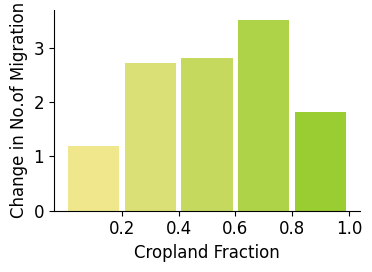

Plot saved to D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\difference_cropland.png


In [77]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
file_path_previous = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000_with_cropland_pasture.xlsx"
file_path_recent = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020_with_cropland_pasture.xlsx"
df_previous = pd.read_excel(file_path_previous)
df_recent = pd.read_excel(file_path_recent)
bins = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
labels = [0.2, 0.4, 0.6, 0.8, 1.0]
df_previous['cropland_bin'] = pd.cut(df_previous['cropland'], bins=bins, labels=labels, include_lowest=True)
df_recent['cropland_bin'] = pd.cut(df_recent['cropland'], bins=bins, labels=labels, include_lowest=True)
mean_track_count_previous = df_previous.groupby('cropland_bin')['track_count'].mean()
mean_track_count_recent = df_recent.groupby('cropland_bin')['track_count'].mean()
difference = mean_track_count_recent - mean_track_count_previous
cmap = mcolors.LinearSegmentedColormap.from_list("YellowGreen", ["Khaki", "yellowgreen"])
colors = cmap(np.linspace(0, 1, len(difference)))
plt.figure(figsize=(4, 3))
bar_positions = np.array(labels) - 0.05 
bars = plt.bar(bar_positions, difference, color=colors, width=0.18) 
plt.xlabel('Cropland Fraction', fontsize=12)
plt.ylabel('Change in No.of Migration', fontsize=12)
plt.xticks(ticks=bar_positions + 0.1, labels=labels, fontsize=12) 
plt.yticks(fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(True)
plt.gca().spines['bottom'].set_visible(True)
plt.gca().yaxis.tick_left()
plt.gca().xaxis.tick_bottom()
plt.tight_layout()
output_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\difference_cropland.png"
plt.savefig(output_path, dpi=300, transparent=True)
plt.show()
print(f"Plot saved to {output_path}")

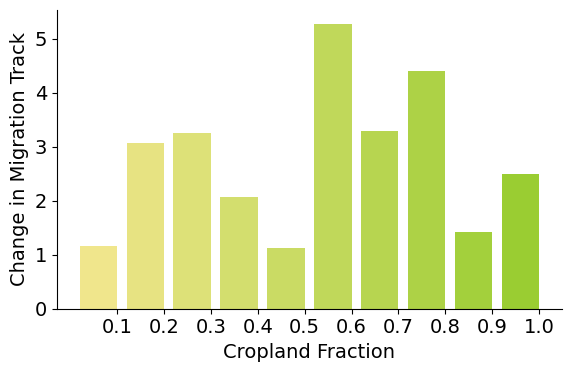

Plot saved to D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\difference_cropland_with_spacing.png


In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
file_path_previous = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000_with_cropland_pasture.xlsx"
file_path_recent = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020_with_cropland_pasture.xlsx"
df_previous = pd.read_excel(file_path_previous)
df_recent = pd.read_excel(file_path_recent)
bins = np.arange(0, 1.1, 0.1)  
labels = np.round(bins[1:], 1)  
df_previous['cropland_bin'] = pd.cut(df_previous['cropland'], bins=bins, labels=labels, include_lowest=True)
df_recent['cropland_bin'] = pd.cut(df_recent['cropland'], bins=bins, labels=labels, include_lowest=True)
mean_track_count_previous = df_previous.groupby('cropland_bin')['track_count'].mean()
mean_track_count_recent = df_recent.groupby('cropland_bin')['track_count'].mean()
difference = mean_track_count_recent - mean_track_count_previous
cmap = mcolors.LinearSegmentedColormap.from_list("YellowGreen", ["Khaki", "yellowgreen"])
colors = cmap(np.linspace(0, 1, len(difference)))
plt.figure(figsize=(6, 4))
bar_width = 0.08
bar_positions = np.array(labels) - (bar_width / 2) 
bars = plt.bar(bar_positions, difference, color=colors, width=bar_width)
plt.xlabel('Cropland Fraction', fontsize=14)
plt.ylabel('Change in Migration Track', fontsize=14)
plt.xticks(ticks=np.array(labels), labels=labels, fontsize=14) 
plt.yticks(fontsize=14)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(True)
plt.gca().spines['bottom'].set_visible(True)
plt.gca().yaxis.tick_left()
plt.gca().xaxis.tick_bottom()
plt.tight_layout()
output_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\difference_cropland_with_spacing.png"
plt.savefig(output_path, dpi=300, transparent=True)
plt.show()
print(f"Plot saved to {output_path}")

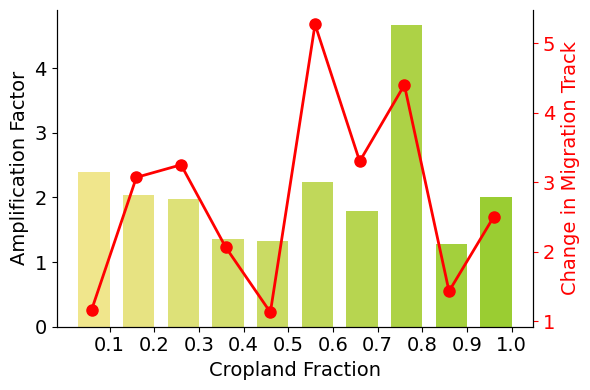

Combined plot saved to D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\combined_plot_adjusted_markers.png


In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
file_path_previous = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000_with_cropland_pasture.xlsx"
file_path_recent = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020_with_cropland_pasture.xlsx"
df_previous = pd.read_excel(file_path_previous)
df_recent = pd.read_excel(file_path_recent)
bins = np.arange(0, 1.1, 0.1)  
labels = np.round(bins[1:], 1) 
df_previous['cropland_bin'] = pd.cut(df_previous['cropland'], bins=bins, labels=labels, include_lowest=True)
df_recent['cropland_bin'] = pd.cut(df_recent['cropland'], bins=bins, labels=labels, include_lowest=True)
mean_track_count_previous = df_previous.groupby('cropland_bin')['track_count'].mean()
mean_track_count_recent = df_recent.groupby('cropland_bin')['track_count'].mean()
amplification_factor = mean_track_count_recent / mean_track_count_previous
difference = mean_track_count_recent - mean_track_count_previous
cmap = mcolors.LinearSegmentedColormap.from_list("YellowGreen", ["Khaki", "yellowgreen"])
colors = cmap(np.linspace(0, 1, len(amplification_factor)))
fig, ax1 = plt.subplots(figsize=(6, 4))
bar_width = 0.7
bar_positions = np.arange(len(labels))
bars = ax1.bar(
    bar_positions, amplification_factor, color=colors, width=bar_width
)
ax1.set_xlabel('Cropland Fraction', fontsize=14)
ax1.set_ylabel('Amplification Factor', fontsize=14)
ax1.set_xticks(bar_positions + bar_width / 2)
ax1.set_xticklabels(labels, fontsize=14)
ax1.tick_params(axis='y', labelsize=14)
line_positions = bar_positions + bar_width / 2 - 0.4  
ax2 = ax1.twinx()
ax2.plot(
    line_positions, difference, color='red', marker='o', markersize=8,
    linestyle='-', linewidth=2, label='Change in Migration Track'
)
ax2.set_ylabel('Change in Migration Track', fontsize=14, color='red')
ax2.tick_params(axis='y', labelsize=14, colors='red')
ax1.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)

plt.tight_layout()
output_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\combined_plot_adjusted_markers.png"
plt.savefig(output_path, dpi=300, transparent=True)
plt.show()
print(f"Combined plot saved to {output_path}")

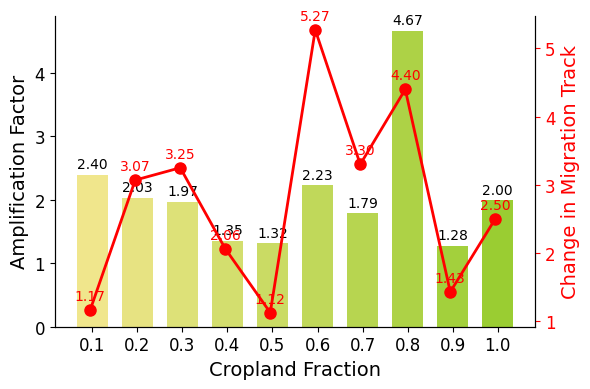

Combined plot saved to D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\combined_plot_with_values.png


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
file_path_previous = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000_with_cropland_pasture.xlsx"
file_path_recent = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020_with_cropland_pasture.xlsx"
df_previous = pd.read_excel(file_path_previous)
df_recent = pd.read_excel(file_path_recent)
bins = np.arange(0, 1.1, 0.1)  
labels = np.round(bins[1:], 1)  
df_previous['cropland_bin'] = pd.cut(df_previous['cropland'], bins=bins, labels=labels, include_lowest=True)
df_recent['cropland_bin'] = pd.cut(df_recent['cropland'], bins=bins, labels=labels, include_lowest=True)
mean_track_count_previous = df_previous.groupby('cropland_bin')['track_count'].mean()
mean_track_count_recent = df_recent.groupby('cropland_bin')['track_count'].mean()
amplification_factor = mean_track_count_recent / mean_track_count_previous
difference = mean_track_count_recent - mean_track_count_previous
cmap = mcolors.LinearSegmentedColormap.from_list("YellowGreen", ["Khaki", "yellowgreen"])
colors = cmap(np.linspace(0, 1, len(amplification_factor)))
fig, ax1 = plt.subplots(figsize=(6, 4))
bar_width = 0.7
bar_positions = np.arange(len(labels)) 
bars = ax1.bar(
    bar_positions, amplification_factor, color=colors, width=bar_width
)
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width() / 2, height + 0.05, f'{height:.2f}', 
             ha='center', va='bottom', fontsize=10, color='black')
ax1.set_xlabel('Cropland Fraction', fontsize=14)
ax1.set_ylabel('Amplification Factor', fontsize=14)
ax1.set_xticks(bar_positions)  
ax1.set_xticklabels(labels, fontsize=12)
ax1.tick_params(axis='y', labelsize=12)
line_positions = bar_positions + bar_width / 2 - 0.4 
ax2 = ax1.twinx()
line_plot, = ax2.plot(
    line_positions, difference, color='red', marker='o', markersize=8,
    linestyle='-', linewidth=2, label='Change in Migration Track'
)
for i, (x, y) in enumerate(zip(line_positions, difference)):
    ax2.text(x, y + 0.1, f'{y:.2f}', ha='center', va='bottom', fontsize=10, color='red')
ax2.set_ylabel('Change in Migration Track', fontsize=14, color='red')
ax2.tick_params(axis='y', labelsize=12, colors='red')
ax1.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)
plt.tight_layout()
output_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\combined_plot_with_values.png"
plt.savefig(output_path, dpi=300, transparent=True)
plt.show()
print(f"Combined plot saved to {output_path}")

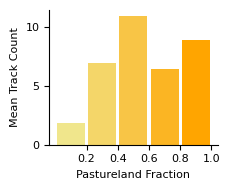

Plot saved to D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\Pasture-4.png


In [81]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020_with_cropland_pasture.xlsx"
df = pd.read_excel(file_path)
bins = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
labels = [0.2, 0.4, 0.6, 0.8, 1.0]
df['pasture_bin'] = pd.cut(df['pasture'], bins=bins, labels=labels, include_lowest=True)
mean_track_count = df.groupby('pasture_bin')['track_count'].mean()
cmap = mcolors.LinearSegmentedColormap.from_list("YellowOrange", ["Khaki", "orange"])
colors = cmap(np.linspace(0, 1, len(mean_track_count)))
plt.figure(figsize=(2.5, 2))
bar_positions = np.array(labels) - 0.05
bars = plt.bar(bar_positions, mean_track_count, color=colors, width=0.18)  
plt.xlabel('Pastureland Fraction', fontsize=8)
plt.ylabel('Mean Track Count', fontsize=8)
plt.xticks(ticks=bar_positions + 0.1, labels=labels, fontsize=8) 
plt.yticks(fontsize=8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(True)
plt.gca().spines['bottom'].set_visible(True)
plt.gca().yaxis.tick_left()
plt.gca().xaxis.tick_bottom()
plt.tight_layout()
output_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\Pasture-4.png"
plt.savefig(output_path, dpi=300, transparent=True)
plt.show()
print(f"Plot saved to {output_path}")

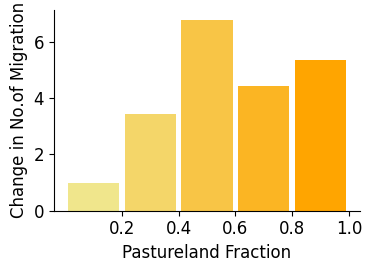

Plot saved to D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\difference_pasture.png


In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
file_path_previous = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000_with_cropland_pasture.xlsx"
file_path_recent = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020_with_cropland_pasture.xlsx"
df_previous = pd.read_excel(file_path_previous)
df_recent = pd.read_excel(file_path_recent)
bins = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
labels = [0.2, 0.4, 0.6, 0.8, 1.0]
df_previous['pasture_bin'] = pd.cut(df_previous['pasture'], bins=bins, labels=labels, include_lowest=True)
df_recent['pasture_bin'] = pd.cut(df_recent['pasture'], bins=bins, labels=labels, include_lowest=True)
mean_track_count_previous = df_previous.groupby('pasture_bin')['track_count'].mean()
mean_track_count_recent = df_recent.groupby('pasture_bin')['track_count'].mean()
difference = mean_track_count_recent - mean_track_count_previous
cmap = mcolors.LinearSegmentedColormap.from_list("YellowOrange", ["Khaki", "orange"])
colors = cmap(np.linspace(0, 1, len(difference)))
plt.figure(figsize=(4, 3))
bar_positions = np.array(labels) - 0.05 
bars = plt.bar(bar_positions, difference, color=colors, width=0.18)  
plt.xlabel('Pastureland Fraction', fontsize=12)
plt.ylabel('Change in No.of Migration', fontsize=12)
plt.xticks(ticks=bar_positions + 0.1, labels=labels, fontsize=12)  
plt.yticks(fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(True)
plt.gca().spines['bottom'].set_visible(True)
plt.gca().yaxis.tick_left()
plt.gca().xaxis.tick_bottom()
plt.tight_layout()
output_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\difference_pasture.png"
plt.savefig(output_path, dpi=300, transparent=True)
plt.show()
print(f"Plot saved to {output_path}")

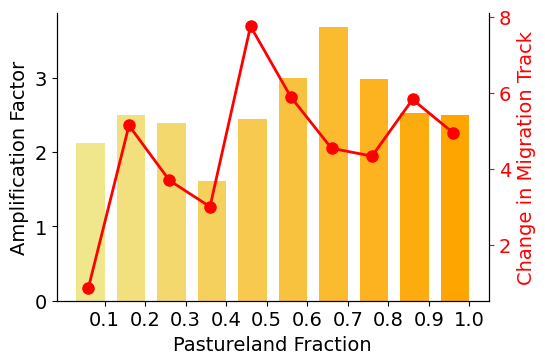

Combined plot saved to D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\combined_pastureland_plot.png


In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
file_path_previous = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000_with_cropland_pasture.xlsx"
file_path_recent = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020_with_cropland_pasture.xlsx"
df_previous = pd.read_excel(file_path_previous)
df_recent = pd.read_excel(file_path_recent)
bins = np.arange(0, 1.1, 0.1) 
labels = np.round(bins[1:], 1)  
df_previous['pasture_bin'] = pd.cut(df_previous['pasture'], bins=bins, labels=labels, include_lowest=True)
df_recent['pasture_bin'] = pd.cut(df_recent['pasture'], bins=bins, labels=labels, include_lowest=True)
mean_track_count_previous = df_previous.groupby('pasture_bin')['track_count'].mean()
mean_track_count_recent = df_recent.groupby('pasture_bin')['track_count'].mean()
amplification_factor = mean_track_count_recent / mean_track_count_previous
difference = mean_track_count_recent - mean_track_count_previous
cmap = mcolors.LinearSegmentedColormap.from_list("YellowOrange", ["Khaki", "orange"])
colors = cmap(np.linspace(0, 1, len(amplification_factor)))
fig, ax1 = plt.subplots(figsize=(6, 4))
bar_width = 0.7
bar_positions = np.arange(len(labels))
bars = ax1.bar(
    bar_positions, amplification_factor, color=colors, width=bar_width
)
ax1.set_xlabel('Pastureland Fraction', fontsize=14)
ax1.set_ylabel('Amplification Factor', fontsize=14)
ax1.set_xticks(bar_positions + bar_width / 2) 
ax1.set_xticklabels(labels, fontsize=14)
ax1.tick_params(axis='y', labelsize=14)
line_positions = bar_positions + bar_width / 2 - 0.4
ax2 = ax1.twinx()
ax2.plot(
    line_positions, difference, color='red', marker='o', markersize=8,
    linestyle='-', linewidth=2, label='Change in Migration Track'
)
ax2.set_ylabel('Change in Migration Track', fontsize=14, color='red')
ax2.tick_params(axis='y', labelsize=14, colors='red')

ax1.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)

plt.tight_layout()
output_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\combined_pastureland_plot.png"
plt.tight_layout(pad=2) 
plt.savefig(output_path, dpi=300, transparent=True, bbox_inches='tight')
plt.show()
print(f"Combined plot saved to {output_path}")

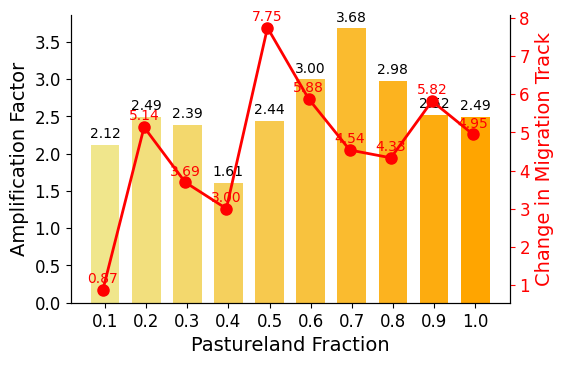

Combined plot saved to D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\combined_pastureland_plot_with_annotations.png


In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
file_path_previous = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_1980-2000_with_cropland_pasture.xlsx"
file_path_recent = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Track_Count_Grid_5.0_2000-2020_with_cropland_pasture.xlsx"

df_previous = pd.read_excel(file_path_previous)
df_recent = pd.read_excel(file_path_recent)
bins = np.arange(0, 1.1, 0.1)  
labels = np.round(bins[1:], 1) 
df_previous['pasture_bin'] = pd.cut(df_previous['pasture'], bins=bins, labels=labels, include_lowest=True)
df_recent['pasture_bin'] = pd.cut(df_recent['pasture'], bins=bins, labels=labels, include_lowest=True)
mean_track_count_previous = df_previous.groupby('pasture_bin')['track_count'].mean()
mean_track_count_recent = df_recent.groupby('pasture_bin')['track_count'].mean()
amplification_factor = mean_track_count_recent / mean_track_count_previous
difference = mean_track_count_recent - mean_track_count_previous
cmap = mcolors.LinearSegmentedColormap.from_list("YellowOrange", ["Khaki", "orange"])
colors = cmap(np.linspace(0, 1, len(amplification_factor)))
fig, ax1 = plt.subplots(figsize=(6, 4))

bar_width = 0.7
bar_positions = np.arange(len(labels)) 
bars = ax1.bar(
    bar_positions, amplification_factor, color=colors, width=bar_width
)
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width() / 2, height + 0.05, f'{height:.2f}', 
             ha='center', va='bottom', fontsize=10, color='black')

ax1.set_xlabel('Pastureland Fraction', fontsize=14)
ax1.set_ylabel('Amplification Factor', fontsize=14)
ax1.set_xticks(bar_positions) 
ax1.set_xticklabels(labels, fontsize=12)
ax1.tick_params(axis='y', labelsize=12)
line_positions = bar_positions + bar_width / 2 - 0.4 
ax2 = ax1.twinx()
line_plot, = ax2.plot(
    line_positions, difference, color='red', marker='o', markersize=8,
    linestyle='-', linewidth=2, label='Change in Migration Track'
)
for i, (x, y) in enumerate(zip(line_positions, difference)):
    ax2.text(x, y + 0.1, f'{y:.2f}', ha='center', va='bottom', fontsize=10, color='red')

ax2.set_ylabel('Change in Migration Track', fontsize=14, color='red')
ax2.tick_params(axis='y', labelsize=12, colors='red')
ax1.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)
plt.tight_layout(pad=2) 
output_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots\\combined_pastureland_plot_with_annotations.png"
plt.savefig(output_path, dpi=300, transparent=True, bbox_inches='tight')  # Ensure no cut-offs
plt.show()
print(f"Combined plot saved to {output_path}")

In [5]:
import pandas as pd
file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Temporal_Events_Summary.xlsx'
data = pd.read_excel(file_path)
continent_counts = data['Continent'].value_counts()
print("Count of Events by Continent:")
print(continent_counts)

Count of Events by Continent:
Continent
Eurasia          1002
Africa            522
South America     430
North America     417
Oceania            89
Name: count, dtype: int64


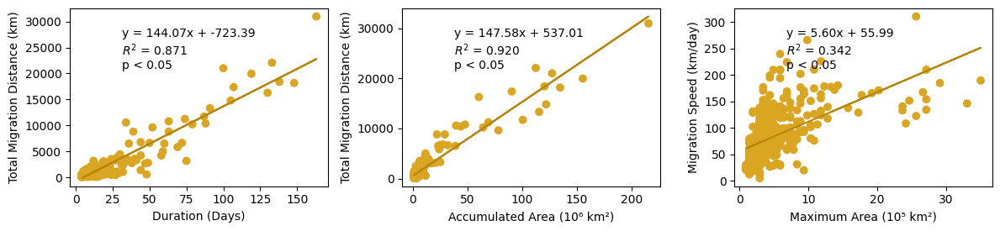

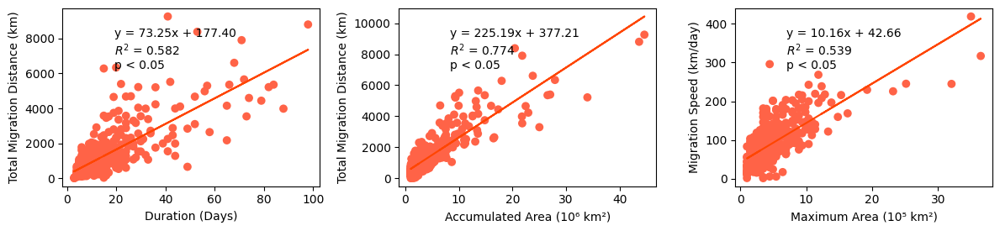

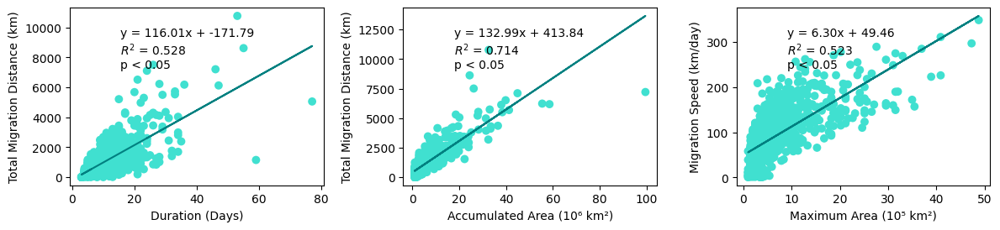

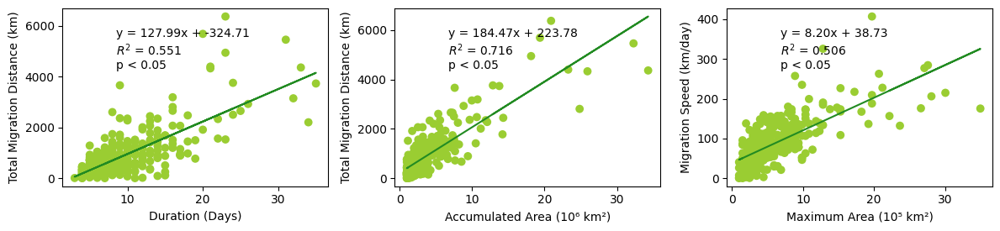

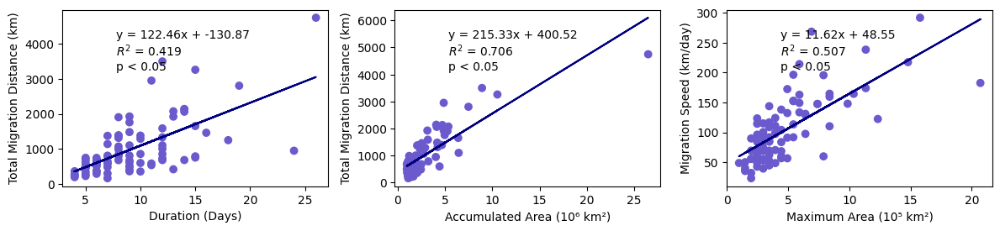

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import os
file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
data = pd.read_excel(file_path)
continent_colors = {
    'South America': ('goldenrod', 'darkgoldenrod'),
    'Africa': ('tomato', 'orangered'),
    'Eurasia': ('turquoise', 'teal'),
    'North America': ('yellowgreen', 'forestgreen'),
    'Oceania': ('slateblue', 'navy')
}

def plot_regression(ax, df, x, y, xlabel, ylabel, text_position, point_color, line_color, show_labels=True):
    sns.scatterplot(x=x, y=y, data=df, ax=ax, color=point_color, marker='o', edgecolor='none', s=50)
    slope, intercept, r_value, p_value, std_err = stats.linregress(df[x], df[y])
    ax.plot(df[x], intercept + slope * df[x], color=line_color)
    equation_text = f'y = {slope:.2f}x + {intercept:.2f}'
    ax.text(*text_position['eq'], equation_text, ha='left', va='top', transform=ax.transAxes, fontsize=10)
    ax.text(*text_position['r2'], f'$R^2$ = {r_value**2:.3f}', ha='left', va='top', transform=ax.transAxes, fontsize=10)
    p_text = "p < 0.05" if p_value < 0.05 else "p > 0.05"
    ax.text(*text_position['p'], p_text, ha='left', va='top', transform=ax.transAxes, fontsize=10)
    ax.set_xlabel(xlabel, fontsize=10)
    ax.set_ylabel(ylabel, fontsize=10)
    ax.grid(False)
text_positions = {
    'eq': (0.2, 0.89),
    'r2': (0.2, 0.81),
    'p': (0.2, 0.71)
}
output_folder = r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots'
os.makedirs(output_folder, exist_ok=True)
for continent in ['South America', 'Africa', 'Eurasia', 'North America', 'Oceania']:
    fig, axs = plt.subplots(1, 3, figsize=(12,3))  
    continent_data = data[data['Continent'] == continent]
    point_color, line_color = continent_colors[continent]
    plot_regression(axs[0], continent_data, 'Duration', 'Total Distance', 'Duration (Days)', 'Total Migration Distance (km)', text_positions, point_color, line_color)
    plot_regression(axs[1], continent_data, 'Accumulated_Area', 'Total Distance', 'Accumulated Area (10⁶ km²)', 'Total Migration Distance (km)', text_positions, point_color, line_color)
    plot_regression(axs[2], continent_data, 'Maximum_Area', 'Moving Speed', 'Maximum Area (10⁵ km²)', 'Migration Speed (km/day)', text_positions, point_color, line_color)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    output_path = os.path.join(output_folder, f'{continent}_regression_plots.png')
    plt.savefig(output_path, dpi=300)
    plt.show()

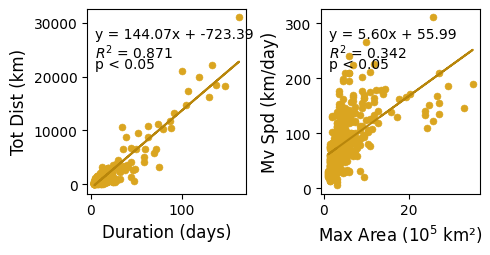

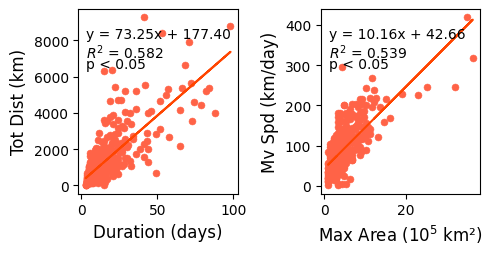

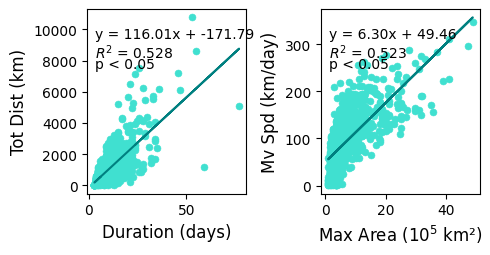

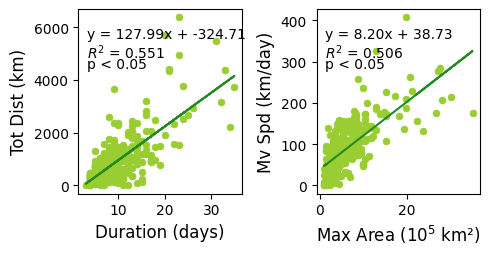

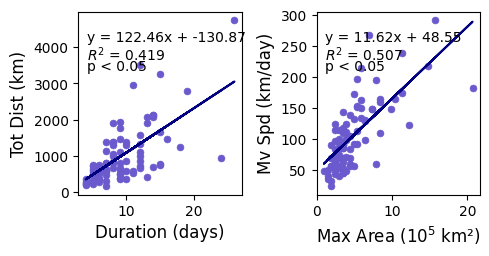

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import os
file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
data = pd.read_excel(file_path)
continent_colors = {
    'South America': ('goldenrod', 'darkgoldenrod'),
    'Africa': ('tomato', 'orangered'),
    'Eurasia': ('turquoise', 'teal'),
    'North America': ('yellowgreen', 'forestgreen'),
    'Oceania': ('slateblue', 'navy')
}

def plot_regression(ax, df, x, y, xlabel, ylabel, text_position, point_color, line_color):
    sns.scatterplot(
        x=x, y=y, data=df, ax=ax, 
        color=point_color, 
        s=25, edgecolor=None 
    )
    slope, intercept, r_value, p_value, std_err = stats.linregress(df[x], df[y])
    ax.plot(df[x], intercept + slope * df[x], color=line_color, linewidth=1.5) 

    equation_text = f'y = {slope:.2f}x + {intercept:.2f}'
    ax.text(*text_position['eq'], equation_text, ha='left', va='top', transform=ax.transAxes, fontsize=10) 
    ax.text(*text_position['r2'], f'$R^2$ = {r_value**2:.3f}', ha='left', va='top', transform=ax.transAxes, fontsize=10)
    p_text = "p < 0.05" if p_value < 0.05 else "p > 0.05"
    ax.text(*text_position['p'], p_text, ha='left', va='top', transform=ax.transAxes, fontsize=10)
    ax.set_xlabel(xlabel, fontsize=12)  
    ax.set_ylabel(ylabel, fontsize=12)
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.grid(False)
text_positions = {
    'eq': (0.05, 0.90), 
    'r2': (0.05, 0.82),
    'p': (0.05, 0.74)
}
output_folder = r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots'
os.makedirs(output_folder, exist_ok=True)
for continent in ['South America', 'Africa', 'Eurasia', 'North America', 'Oceania']:
    fig, axs = plt.subplots(1, 2, figsize=(5, 2.8)) 
    continent_data = data[data['Continent'] == continent]
    point_color, line_color = continent_colors[continent]
    plot_regression(axs[0], continent_data, 'Duration', 'Total Distance',
                    'Duration (days)', 'Tot Dist (km)', 
                    text_positions, point_color, line_color)
    plot_regression(axs[1], continent_data, 'Maximum_Area', 'Moving Speed', 
                    'Max Area ($10^5$ km²)', 'Mv Spd (km/day)', 
                    text_positions, point_color, line_color)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    output_path = os.path.join(output_folder, f'{continent}_regression_plots_vibrant.png')
    plt.savefig(output_path, dpi=300, transparent=True)
    plt.show()

In [2]:
import pandas as pd

# Path to the Excel files
file_path_1 = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx'
file_path_2 = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'

# Load the data from Excel files
df1 = pd.read_excel(file_path_1)
df2 = pd.read_excel(file_path_2)

# Calculate the max area per Event ID from the first file
max_areas = df1.groupby('Event ID')['AreaperDay'].max()

# Map the max areas onto the second file based on Event ID
df2['Max_Area'] = df2['Event ID'].map(max_areas)

# Save the updated DataFrame back to the second Excel file
df2.to_excel(file_path_2, index=False)

print("Updated Excel file saved successfully.")


Updated Excel file saved successfully.


In [8]:
import pandas as pd
file_path_1 = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Daily_Summary_CDHW_Events.xlsx'
file_path_2 = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Event_Level_Summary_1.xlsx'
df1 = pd.read_excel(file_path_1)
df2 = pd.read_excel(file_path_2)
max_areas = df1.groupby('Event ID')['AreaperDay'].max()
max_voxels = df1.groupby('Event ID')['VoxelsPerDay'].max()
df2['Max_Area'] = df2['Event ID'].map(max_areas)
df2['Max_voxels'] = df2['Event ID'].map(max_voxels)
df2.to_excel(file_path_2, index=False)
print("Updated Excel file saved successfully.")

Updated Excel file saved successfully.


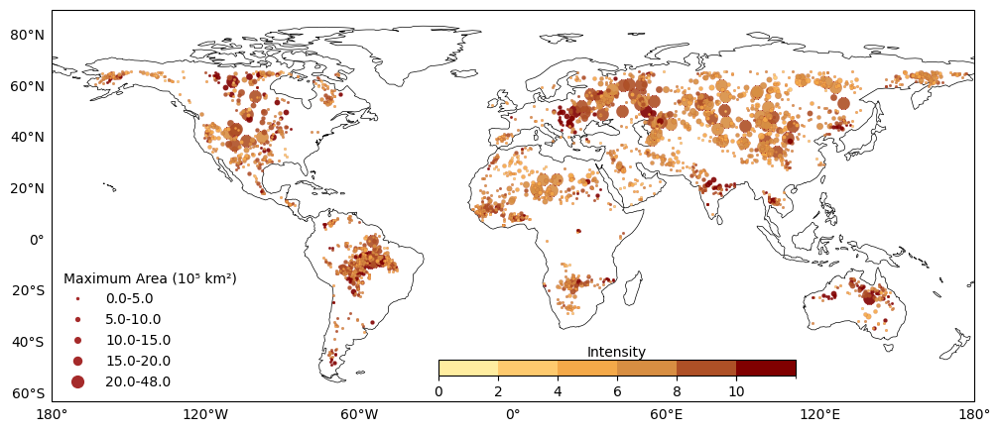

In [13]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import numpy as np
import pandas as pd
from matplotlib.cm import ScalarMappable
file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Level_Summary.xlsx'
data = pd.read_excel(file_path)
save_directory = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots'
fixed_intervals = [0, 2,  4,  6,  8,  10, 30]  
colors =  ['#ffeda0', '#feb24c', '#cd853f', '#800000']
cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", colors, N=len(fixed_intervals)-1)
norm = mcolors.BoundaryNorm(fixed_intervals, cmap.N)
def get_circle_size(voxels):
    if voxels <= 5:
        return 2
    elif voxels <= 10:
        return 3
    elif voxels <= 15:
        return 4
    elif voxels <= 20:
        return 4.8
    else:
        return 9
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax.coastlines(resolution='110m', linewidth=0.5)
ax.set_extent([-180, 180, -63, 90], ccrs.PlateCarree())
for idx, row in data.iterrows():
    color = cmap(norm(row['Intensity']))
    size = get_circle_size(row['Maximum_Area'])
    ax.plot(row['Longitude'], row['Latitude'], 'o', color=color, markersize=size, alpha=0.9, markeredgewidth=0.1, markeredgecolor='brown', transform=ccrs.Geodetic())
gl = ax.gridlines(draw_labels=True, linewidth=0, color='gray', alpha=0.9)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = Falses
colorbar_ax = fig.add_axes([0.45, 0.28, 0.3, 0.02])
cbar = plt.colorbar(ScalarMappable(norm=norm, cmap=cmap), cax=colorbar_ax, orientation='horizontal', ticks=fixed_intervals[:-1] + [10.01])  # Include ticks up to 15 and mid-point for >15
cbar.ax.set_xticklabels(['0', '2', '4', '6', '8', '10', '']) 
cbar.set_label('Intensity', rotation=0, labelpad=-39, horizontalalignment='center')
labels = ['0.0-5.0', '5.0-10.0', '10.0-15.0', '15.0-20.0', '20.0-48.0']
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='brown', markersize=np.sqrt(size)*3.5, label=label)
           for size, label in zip([1, 1.9, 3, 5, 9], labels)]
legend = ax.legend(handles=handles, title='Maximum Area (10⁵ km²)', title_fontsize='10', fontsize='10', loc='lower left', frameon=False, handlelength=2, handletextpad=1)
legend._legend_box.align = "left"
high_res_png = save_directory + '\\CHDW_Oberv_Accumulatedarea_Intensity_1_10.png'
plt.savefig(high_res_png, dpi=900, bbox_inches='tight')
plt.show()

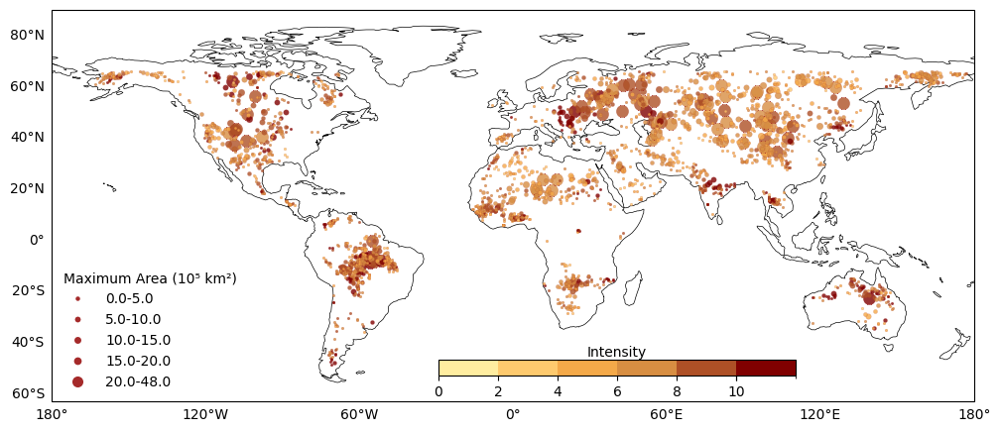

In [10]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import numpy as np
import pandas as pd
from matplotlib.cm import ScalarMappable
file_path = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Level_Summary.xlsx'
data = pd.read_excel(file_path)
save_directory = 'D:\\PhD_Research\\Paper-3_CHDW_Migration\\Results\\Plots'
fixed_intervals = [0, 2, 4, 6, 8, 10, 30]
colors = ['#ffeda0', '#feb24c', '#cd853f', '#800000']
cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", colors, N=len(fixed_intervals)-1)
norm = mcolors.BoundaryNorm(fixed_intervals, cmap.N)
def get_circle_size(voxels):
    if voxels <= 5:
        return 2
    elif voxels <= 10:
        return 3
    elif voxels <= 15:
        return 4
    elif voxels <= 20:
        return 4.8
    else:  # >20
        return 9
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax.coastlines(resolution='110m', linewidth=0.5)
ax.set_extent([-180, 180, -63, 90], ccrs.PlateCarree())
for idx, row in data.iterrows():
    color = cmap(norm(row['Intensity']))
    size = get_circle_size(row['Maximum_Area'])
    ax.plot(row['Longitude'], row['Latitude'], 'o', color=color, markersize=size, alpha=0.8, markeredgewidth=0.1, markeredgecolor='brown', transform=ccrs.Geodetic())
gl = ax.gridlines(draw_labels=True, linewidth=0, color='gray', alpha=0.7)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
colorbar_ax = fig.add_axes([0.45, 0.28, 0.3, 0.02])
cbar = plt.colorbar(ScalarMappable(norm=norm, cmap=cmap), cax=colorbar_ax, orientation='horizontal', ticks=fixed_intervals[:-1] + [10.01])
cbar.ax.set_xticklabels(['0', '2', '4', '6', '8', '10', ''])
cbar.set_label('Intensity', rotation=0, labelpad=-39, horizontalalignment='center')
labels = ['0.0-5.0', '5.0-10.0', '10.0-15.0', '15.0-20.0', '20.0-48.0']
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='brown', markersize=np.sqrt(size)*3, label=label)
           for size, label in zip([2, 3, 4, 4.8, 9], labels)]
legend = ax.legend(handles=handles, title='Maximum Area (10⁵ km²)', title_fontsize='10', fontsize='10', loc='lower left', frameon=False, handlelength=2, handletextpad=1)
legend._legend_box.align = "left"
high_res_png = save_directory + '\\CHDW_Oberv_Accumulatedarea_Intensity_1_10.png'
plt.savefig(high_res_png, dpi=900, bbox_inches='tight')
plt.show()

Total number of events: 2584

Percentage of events in each Maximum Area category:
Max Area Category
<2.0     18.150155
2-5      47.445820
5-10     22.252322
>10.0    12.151703
Name: count, dtype: float64


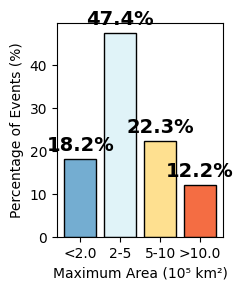

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Level_Summary.xlsx"
data = pd.read_excel(file_path)
bins = [0, 2, 5, 10, float('inf')]
labels = ['<2.0', '2-5', '5-10', '>10.0']
data['Max Area Category'] = pd.cut(data['Maximum_Area'], bins=bins, labels=labels, include_lowest=True)
category_counts = data['Max Area Category'].value_counts().sort_index()
category_percentages = (category_counts / category_counts.sum()) * 100
total_events = data.shape[0]
print(f"Total number of events: {total_events}")
print("\nPercentage of events in each Maximum Area category:")
print(category_percentages)
plt.figure(figsize=(2.5, 3))
colors = sns.color_palette("RdYlBu_r", len(category_percentages))
bars = plt.bar(category_percentages.index, category_percentages, color=colors, edgecolor='black', alpha=1)
for bar, percentage in zip(bars, category_percentages):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{percentage:.1f}%', 
             ha='center', va='bottom', fontsize=14, fontweight='bold')
plt.xlabel('Maximum Area (10⁵ km²)')
plt.ylabel('Percentage of Events (%)')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

Total number of events: 2572

Percentage of events in each Maximum Area category for each continent:
Max Area Category    0.0-2.0    2.0-5.0   5.0-10.0      >10.0
Continent                                                    
Africa             22.953737  53.202847  18.683274   5.160142
Eurasia            14.478764  43.822394  22.683398  19.015444
North America      14.420804  48.463357  27.659574   9.456265
Oceania            12.500000  57.291667  21.875000   8.333333
South America      25.054945  45.054945  21.318681   8.571429


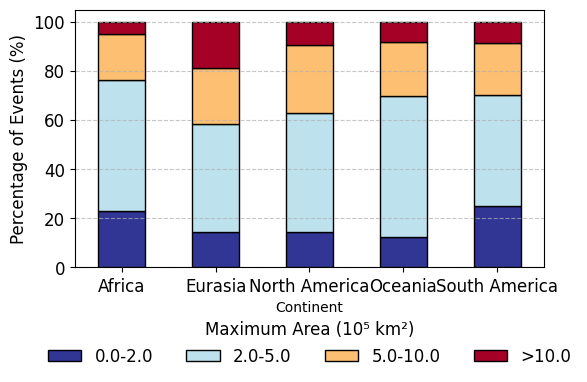

In [27]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Event_Level_Summary.xlsx"
data = pd.read_excel(file_path)
gdf_events = gpd.GeoDataFrame(data, geometry=gpd.points_from_xy(data['Longitude'], data['Latitude']), crs="EPSG:4326")
shapefile_folder = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Data\\World_Continents"
for continent in continents:
    continent_shapefile = f"{shapefile_folder}\\{continent}.shp"
    gdf_continent = gpd.read_file(continent_shapefile)
    gdf_events.loc[gdf_events.sjoin(gdf_continent, predicate='within').index, 'Continent'] = continent
gdf_events['Continent'] = gdf_events['Continent'].replace({'Europe': 'Eurasia', 'Asia': 'Eurasia'})
gdf_events = gdf_events.dropna(subset=['Continent'])
bins = [0, 2, 5, 10, float('inf')]
labels = ['0.0-2.0', '2.0-5.0', '5.0-10.0', '>10.0']
gdf_events['Max Area Category'] = pd.cut(gdf_events['Maximum_Area'], bins=bins, labels=labels, include_lowest=True)
continent_category_counts = gdf_events.groupby(['Continent', 'Max Area Category']).size().unstack(fill_value=0)
continent_category_percentages = continent_category_counts.div(continent_category_counts.sum(axis=1), axis=0) * 100
total_events = gdf_events.shape[0]
print(f"Total number of events: {total_events}")
print("\nPercentage of events in each Maximum Area category for each continent:")
print(continent_category_percentages)
fig, ax = plt.subplots(figsize=(6, 4)) 
continent_category_percentages.plot(
    kind='bar', 
    stacked=True, 
    colormap='RdYlBu_r', 
    edgecolor='black', 
    alpha=1, 
    ax=ax
)
ax.set_ylabel('Percentage of Events (%)', fontsize=12)
ax.tick_params(axis='both', labelsize=12)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=12)
legend = ax.legend(
    title='Maximum Area (10⁵ km²)', 
    fontsize=12, 
    title_fontsize=12, 
    loc='upper center', 
    bbox_to_anchor=(0.5, -0.15), 
    ncol=4,  
    frameon=False
)
ax.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [1]:
import pandas as pd
file_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Daily_Detailed_CDHW_Events.xlsx"
data = pd.read_excel(file_path)
def count_pairs(group):
    unique_pairs = group[['Latitude', 'Longitude']].drop_duplicates().shape[0]
    daily_max_voxels = group.groupby('Date').size().max()
    lcr = daily_max_voxels / unique_pairs if unique_pairs > 0 else 0 

    return pd.Series({
        'Unique Voxels': unique_pairs,
        'Max Voxels': daily_max_voxels,
        'LCR': lcr
    })
result = data.groupby('Event ID').apply(count_pairs)
result.reset_index(inplace=True)
output_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\LCR_Summary_Results.xlsx"
result.to_excel(output_path, index=False)
print("Processing complete. The results are saved in:", output_path)

Processing complete. The results are saved in: D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\LCR_Summary_Results.xlsx


In [57]:
import pandas as pd
temporal_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\Temporal_Events_Summary.xlsx"
temporal_data = pd.read_excel(temporal_path)
lcr_summary_path = "D:\\PhD_Research\\Paper-3_CHDW_Migration\\Processing\\Processed Data\\Step_4_Event_Calculation\\Event_Observ\\LCR_Summary_Results.xlsx"
lcr_data = pd.read_excel(lcr_summary_path)
updated_data = temporal_data.merge(lcr_data[['Event ID', 'LCR']], on='Event ID', how='left')
updated_data.to_excel(temporal_path, index=False)
print("The Temporal Events Summary file has been updated.")

The Temporal Events Summary file has been updated.


In [60]:
import pandas as pd
import os
file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
data = pd.read_excel(file_path)
def top_40_events(group):
    return group.nlargest(40, 'Maximum_Area')
filtered_data = data.groupby('Continent').apply(top_40_events).reset_index(drop=True)
output_folder = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ'
os.makedirs(output_folder, exist_ok=True)
output_path = os.path.join(output_folder, 'Top_40_Events_by_Max_Area.xlsx')
filtered_data.to_excel(output_path, index=False)
print("The Excel file has been saved to:", output_path)

The Excel file has been saved to: D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Top_40_Events_by_Max_Area.xlsx


In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import os
file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
data = pd.read_excel(file_path)
continent_colors = {
    'South America': 'goldenrod',
    'Africa': 'orange',
    'Eurasia': 'sandybrown',
    'North America': 'darksalmon',
    'Oceania': 'chocolate'
}
variables = ['Max_Area']
axis_label = 'Maximum Area (10⁶ km²)'
output_folder = r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\\Box_Plot'
os.makedirs(output_folder, exist_ok=True)
def top_40_events(group):
    return group.nlargest(40, 'Maximum_Area')
filtered_data = data.groupby('Continent').apply(top_40_events)
grouped_data = [filtered_data[filtered_data['Continent'] == continent]['Maximum_Area'].dropna() for continent in continent_colors.keys()]
fig, ax = plt.subplots(figsize=(4, 3))
bplot = ax.boxplot(grouped_data, patch_artist=True, notch=False, widths=0.6, showfliers=False)
for patch, color in zip(bplot['boxes'], continent_colors.values()):
    patch.set_facecolor(color)
for median in bplot['medians']:
    median.set_color('red') 
    median.set_linewidth(2)  
ax.set_ylabel(axis_label, fontsize=12)  
ax.set_xticklabels(['South\nAmerica', 'Africa', 'Eurasia', 'North\nAmerica', 'Oceania'], fontsize=10, ha='center')  # Set custom x-axis tick labels
ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
output_path = os.path.join(output_folder, 'Top_40_Events_Maximum_Area_Boxplot.png')
plt.savefig(output_path, dpi=300, transparent=True, bbox_inches='tight')
plt.close()

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import os
file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
data = pd.read_excel(file_path)
continent_colors = {
    'South America': 'goldenrod',
    'Africa': 'orange',
    'Eurasia': 'sandybrown',
    'North America': 'darksalmon',
    'Oceania': 'chocolate'
}
variables = ['Max_Area']
axis_label = 'Maximum Area (10⁶ km²)'
output_folder = r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\Box_Plot'
os.makedirs(output_folder, exist_ok=True) 
def top_40_events(group):
    return group.nlargest(40, 'Maximum_Area')
filtered_data = data.groupby('Continent').apply(top_40_events)
grouped_data = [filtered_data[filtered_data['Continent'] == continent]['Maximum_Area'].dropna() for continent in continent_colors.keys()]

fig, ax = plt.subplots(figsize=(6, 5))
bplot = ax.boxplot(grouped_data, patch_artist=True, notch=False, widths=0.6, showfliers=False)
for patch, color in zip(bplot['boxes'], continent_colors.values()):
    patch.set_facecolor(color)
for median in bplot['medians']:
    median.set_color('red')  
    median.set_linewidth(2)  
medians = [round(median.get_ydata()[0], 2) for median in bplot['medians']]  # Extract median values
for i, median_value in enumerate(medians):
    ax.text(i + 1, median_value, str(median_value), 
            verticalalignment='bottom', horizontalalignment='center', 
            fontsize=16, fontweight='bold', color='black')
ax.set_ylabel(axis_label, fontsize=16, fontweight='bold')  # Set y-axis label
ax.set_xticklabels(['South\nAmerica', 'Africa', 'Eurasia', 'North\nAmerica', 'Oceania'], fontsize=16, ha='center', fontweight='bold')  # Set custom x-axis tick labels
ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
output_path = os.path.join(output_folder, 'Top_40_Events_Maximum_Area_Boxplot.png')
plt.savefig(output_path, dpi=300, transparent=True, bbox_inches='tight')
plt.close()

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import os
file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
data = pd.read_excel(file_path)
continent_colors = {
    'North America': 'darksalmon',
    'Eurasia': 'sandybrown',
    'Africa': 'orange',
    'South America': 'goldenrod',
    'Oceania': 'chocolate'
}
variable_units = {
    'Duration': ('Duration', 'days'),
    'Accumulated_Area': ('Accumulated Area', '10⁶ km²'),
    'Maximum_Area': ('Maximum Area', '10⁵ km²'),
    'Intensity': ('Intensity', ''), 
    'Total Distance': ('Total Distance', 'km'),
    'Distance': ('Displacement', 'Km'),
    'Moving Speed': ('Moving Speed', 'Km/day'),
    'LCR': ('LCR', '') 
}
output_folder = r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\Box_Plot'
os.makedirs(output_folder, exist_ok=True) 
def top_40_events(group):
    return group.nlargest(40, 'Maximum_Area')
filtered_data = data.groupby('Continent').apply(top_40_events)
for variable, (display_name, unit) in variable_units.items():
    grouped_data = [filtered_data[filtered_data['Continent'] == continent][variable].dropna() 
                    for continent in continent_colors.keys()]
    fig, ax = plt.subplots(figsize=(4, 3))
    bplot = ax.boxplot(grouped_data, patch_artist=True, notch=False, widths=0.6, showfliers=False)
    for patch, color in zip(bplot['boxes'], continent_colors.values()):
        patch.set_facecolor(color)
    for median in bplot['medians']:
        median.set_color('red')  
        median.set_linewidth(2) 
    medians = [round(median.get_ydata()[0], 2) for median in bplot['medians']]  
    for i, median_value in enumerate(medians):
        ax.text(i + 1, median_value, str(median_value), 
                verticalalignment='bottom', horizontalalignment='center', 
                fontsize=16, alpha=0.5, color='black')
    y_label = f"{display_name} ({unit})" if unit else f"{display_name}"
    ax.set_ylabel(y_label, fontsize=16)
    ax.set_xticklabels(['North\nAmerica', 'Eurasia', 'Africa', 'South\nAmerica', 'Oceania'], ha='center', fontsize=20)
    ax.grid(False)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.tight_layout()
    output_path = os.path.join(output_folder, f'Top_40_Events_{variable}_Boxplot.png')
    plt.savefig(output_path, dpi=300, transparent=True, bbox_inches='tight')
    plt.close()
print("All box plots for the top 40 Maximum_Area events have been saved successfully!")

All box plots for the top 40 Maximum_Area events have been saved successfully!


In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import os
file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
data = pd.read_excel(file_path)
continent_colors = {
    'North America': 'darksalmon',
    'Eurasia': 'sandybrown',
    'Africa': 'orange',
    'South America': 'goldenrod',
    'Oceania': 'chocolate'
}
continent_labels = {
    'North America': 'NAm',
    'Eurasia': 'Eur',
    'Africa': 'Afr',
    'South America': 'SAm',
    'Oceania': 'Oce'
}
variable_units = {
    'Duration': ('Duration', 'days'),
    'Accumulated_Area': ('Accumulated Area', '10⁶ km²'),
    'Maximum_Area': ('Maximum Area', '10⁵ km²'),
    'Intensity': ('Intensity', ''), 
    'Total Distance': ('Total Distance', 'km'),
    'Distance': ('Displacement', 'Km'),
    'Moving Speed': ('Moving Speed', 'Km/day'),
    'LCR': ('LCR', '') 
}

output_folder = r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots\Box_Plot'
os.makedirs(output_folder, exist_ok=True)  
def top_40_events(group):
    return group.nlargest(40, 'Maximum_Area')
filtered_data = data.groupby('Continent').apply(top_40_events)
for variable, (display_name, unit) in variable_units.items():
    grouped_data = [filtered_data[filtered_data['Continent'] == continent][variable].dropna() 
                    for continent in continent_colors.keys()]
    fig, ax = plt.subplots(figsize=(3, 3)) 
    bplot = ax.boxplot(grouped_data, patch_artist=True, notch=False, widths=0.6, showfliers=False)
    for patch, color in zip(bplot['boxes'], continent_colors.values()):
        patch.set_facecolor(color)
    for median in bplot['medians']:
        median.set_color('red')  
        median.set_linewidth(2) 
    y_label = f"{display_name} ({unit})" if unit else f"{display_name}"
    ax.set_ylabel(y_label, fontsize=12)
    ax.set_xticklabels([continent_labels[c] for c in continent_colors.keys()], ha='center', fontsize=12)
    ax.spines['top'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.spines['top'].set_linewidth(1.5)
    ax.spines['right'].set_linewidth(1.5)
    ax.tick_params(axis='both', labelsize=12)
    plt.tight_layout()
    output_path = os.path.join(output_folder, f'Top_40_Events_{variable}_Boxplot.png')
    plt.savefig(output_path, dpi=300, transparent=True, bbox_inches='tight')
    plt.close()
print("All box plots for the top 40 Maximum_Area events have been saved successfully!")

All box plots for the top 40 Maximum_Area events have been saved successfully!


In [40]:
import pandas as pd
import os
file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
data = pd.read_excel(file_path)
continents = ['North America', 'Eurasia', 'Africa', 'South America', 'Oceania']
variables = ['Duration', 'Accumulated_Area', 'Maximum_Area', 'Intensity', 
             'Total Distance', 'Distance', 'Moving Speed', 'LCR']
def top_40_events(group):
    return group.nlargest(40, 'Maximum_Area')
filtered_data = data.groupby('Continent').apply(top_40_events)
print("\nMedian Values for Top 40 Maximum_Area Events\n")
for variable in variables:
    print(f"Variable: {variable}")
    for continent in continents:
        continent_data = filtered_data[filtered_data['Continent'] == continent][variable].dropna()
        if not continent_data.empty:
            median_value = round(continent_data.median(), 2)
            print(f"  {continent}: {median_value}")
        else:
            print(f"  {continent}: No data")
    print("\n" + "-"*50 + "\n")  


Median Values for Top 40 Maximum_Area Events

Variable: Duration
  North America: 11.5
  Eurasia: 16.5
  Africa: 15.5
  South America: 42.5
  Oceania: 9.0

--------------------------------------------------

Variable: Accumulated_Area
  North America: 8.11
  Eurasia: 21.46
  Africa: 7.84
  South America: 26.22
  Oceania: 3.03

--------------------------------------------------

Variable: Maximum_Area
  North America: 15.03
  Eurasia: 26.86
  Africa: 10.84
  South America: 13.55
  Oceania: 5.91

--------------------------------------------------

Variable: Intensity
  North America: 8.84
  Eurasia: 7.93
  Africa: 7.43
  South America: 9.05
  Oceania: 8.89

--------------------------------------------------

Variable: Total Distance
  North America: 1967.51
  Eurasia: 3207.3
  Africa: 2587.32
  South America: 6712.32
  Oceania: 1344.86

--------------------------------------------------

Variable: Distance
  North America: 871.89
  Eurasia: 1587.06
  Africa: 940.56
  South America: 701.

In [68]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import os
file_path = r'D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step_4_Event_Calculation\Event_Observ\Temporal_Events_Summary.xlsx'
data = pd.read_excel(file_path)
variables = ['Duration', 'Accumulated_Area', 'Maximum_Area', 'Intensity', 'Total Distance', 'Distance', 'Moving Speed']
continents = data['Continent'].unique()
colors = ['#ffeda0', '#feb24c', '#f03b20']
cmap = LinearSegmentedColormap.from_list("custom_gradient", colors, N=256)
output_folder = r'D:\PhD_Research\Paper-3_CHDW_Migration\Results\Plots'
os.makedirs(output_folder, exist_ok=True)
for continent in continents:
    fig, axs = plt.subplots(len(variables), figsize=(6, 24))
    continent_data = data[data['Continent'] == continent]
    for i, var in enumerate(variables):
        n, bins, patches = axs[i].hist(continent_data[var].dropna(), bins=20, density=True, edgecolor='black')
        bin_centers = 0.5 * (bins[:-1] + bins[1:])
        col = bin_centers - min(bin_centers)
        col /= max(col)
        for c, p in zip(col, patches):
            plt.setp(p, 'facecolor', cmap(c))  
        axs[i].set_title(f'{var.replace("_", " ")} - {continent}')
        axs[i].set_xlabel(f'{var} (units)')
        axs[i].set_ylabel('Probability Density')
        axs[i].grid(False)  
    plt.tight_layout()
    save_path = os.path.join(output_folder, f'{continent}_Characteristics_Histograms.png')
    plt.savefig(save_path, format='png', dpi=300)
    plt.close(fig)  # Close the plot to free memory
print("All plots have been saved successfully.")

All plots have been saved successfully.


In [1]:
import os
import xarray as xr
import pandas as pd
from tqdm import tqdm
nc_path = r"D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step-7_Mechanism\Variables\Deep_Model\CDHW_3DCNN_Predicted_Severity_1982_2019.nc"
out_csv = nc_path.replace(".nc", "_PRED.csv")
ds = xr.open_dataset(nc_path)
da = ds["CDHW_severity_pred"] 
lons = ds["lon"].values
lats = ds["lat"].values
grid = pd.MultiIndex.from_product([lons, lats], names=["Longitude", "Latitude"]).to_frame(index=False)
years = pd.to_datetime(ds["time"].values).year
unique_years = sorted(pd.unique(years))
grid.to_csv(out_csv, index=False)
print(f"Started writing: {out_csv}")
for yr in tqdm(unique_years, desc="Converting (year blocks)"):
    da_y = da.sel(time=slice(f"{yr}-01-01", f"{yr}-12-31"))
    df = da_y.to_dataframe(name="severity").reset_index()
    df["date"] = pd.to_datetime(df["time"]).dt.strftime("%Y_%m_%d")
    wide_y = df.pivot_table(index=["lon", "lat"], columns="date", values="severity")
    wide_y = wide_y.reindex(pd.MultiIndex.from_product([lons, lats], names=["lon", "lat"]))
    tmp_csv = os.path.join(os.path.dirname(out_csv), f"_tmp_{yr}.csv")
    wide_y.reset_index(drop=True).to_csv(tmp_csv, index=False)
tmp_files = [os.path.join(os.path.dirname(out_csv), f"_tmp_{yr}.csv") for yr in unique_years]
final_df = grid.copy()
for f in tqdm(tmp_files, desc="Merging year blocks"):
    block = pd.read_csv(f)
    final_df = pd.concat([final_df, block], axis=1)
final_df.to_csv(out_csv, index=False)
print(f"\nFinal CSV saved:\n{out_csv}")
for f in tmp_files:
    os.remove(f)
print("Temporary files removed.")

C:\Users\Amitesh\AppData\Roaming\Python\Python39\site-packages\pandas\core\arrays\masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


Started writing: D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step-7_Mechanism\Variables\Deep_Model\CDHW_3DCNN_Predicted_Severity_1982_2019_PRED.csv


Merging year blocks: 100%|█████████████████████████████████████████████████████████████| 37/37 [00:26<00:00,  1.42it/s]



✅ Done! Final CSV saved:
D:\PhD_Research\Paper-3_CHDW_Migration\Processing\Processed Data\Step-7_Mechanism\Variables\Deep_Model\CDHW_3DCNN_Predicted_Severity_1982_2019_PRED.csv
Temporary files removed.
